## 1.Data Collection

#### Setting up Binance Connection

In this section, I will be establishing a connection to Binance to retrieve data from their API services.

For Binance Connection, I will be using <a href='https://python-binance.readthedocs.io/en/latest/index.html'>python-binance</a>

For the purpose of EDA, Data Preprocessing and Data Visualisation, I will be using the following libraries:
<ul>
    <li>Pandas: For creation and data manipulation </li>
    <li>Numpy: Data manipulation</li>
    <li>MatplotLib: Data Visualisation</li>
    <li>Seaborn: Data Visualisation</li>
    <li>datetime: Data Manipulation</li>
</ul>

In [1]:
# !pip install python-binance 

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
from config import binance_key, binance_secret
from binance import Client
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mplfinance as mpf
from datetime import datetime, timedelta

apikey = binance_key
secret = binance_secret

client = Client(apikey, secret)

### 1.1 Retrieving Historical Prices for selected cryptocurrencies

I shortlisted a list of cryptocurrencies that are paired against USDT:
<ol>
    <li>BTCUSDT</li>
    <li>ETHUSDT</li>
    <li>SOLUDST</li>
    <li>DOGEUSDT</li>
    <li>BNBUSDT</li>
    <li>LINKUSDT</li>
    <li>AAVEUSDT</li>
    <li>UNIUSDT</li>
    <li>ADAUSDT</li>
    <li>DOTUSDT</li>
</ol>

These coins always been in the top 30 coins by Market Capitalisation since 2021 for the following reasons:
<ol>
    <li>Sufficient Volume</li>
    <li>Existence of Perpetual Contracts</li>
    <li>Covers different sectors of cryptocurrency (eg. Large coins, Meme coins, Altcoins)</li>
</ol>

**fetch_hist_data (symbol, start_date)**

The function of *fetch_hist_data* was created to fetch historical prices of the cryptocurrency since 1 Apr 2021. It takes the following parameters:
- client: client connection to Binance API
- symbol: Cryptocurrency symbol against USDT (eg. BTCUSDT)
- start_date:  Start date for the historical data in datetime format

In fetch_hist_data, I conduct the following operations: 
1. Create a pandas dataframe of the historical price for the respective coin
2. Changed the dtypes of relevant column values from object to either datetime or float

Historical data from Binance was fetched using <span style='color:orange'>KLINE_INTERVAL_1HOUR</span> API to get the hourly prices of coin.

In [4]:
def fetch_hist_data(client, symbol, start_date, end_date=datetime.now()):
    """Fetch historical data for given symbol from start date to end date at specified interval."""
    start_timestamp = int(start_date.timestamp() * 1000)
    end_timestamp = int(end_date.timestamp() * 1000)

    historical = client.get_historical_klines(symbol, client.KLINE_INTERVAL_1HOUR, start_timestamp, end_timestamp)
    data = pd.DataFrame(historical, columns=['open_time', 'open', 'high', 'low', 'close', 'volume', 
                                             'close_time', 'quote_asset_volume', 'number_of_trades', 
                                             'taker_buy_base_asset_volume', 'taker_buy_quote_asset_volume', 'ignore'])
    
    data['open_time'] = pd.to_datetime(data['open_time'], unit='ms')
    data['close_time'] = pd.to_datetime(data['close_time'], unit='ms')

    numerical_columns = ['open', 'high', 'low', 'close', 'volume', 'quote_asset_volume', 'number_of_trades', 'taker_buy_base_asset_volume', 'taker_buy_quote_asset_volume']
    data[numerical_columns] = data[numerical_columns].apply(pd.to_numeric)
    return data

Getting the entire list of coins takes about <u>**2 minutes**</u>

A variable ,*full_data*, is used to store the entire historical price actions for all cryptocurrencies. 
<br>

I use *pd.concat* to concatenate pandas object along the cryptocurrency symbol (key) to each DataFrame

In [5]:
from dateutil.relativedelta import relativedelta

#Retrieve last 36 months
current_date = datetime.now()
start_date = current_date - relativedelta(months=36)

interested_coins = ['BTCUSDT', 'ETHUSDT', 'SOLUSDT', 'DOGEUSDT', 'BNBUSDT', 'LINKUSDT', 'AAVEUSDT', 'UNIUSDT', 'ADAUSDT', 'DOTUSDT']

full_data = pd.concat(
    [fetch_hist_data(client, coin, start_date) for coin in interested_coins], 
    keys=interested_coins,
    names=['Symbol', 'Index']
)

For EDA and Data Preparation, I will use the copy of *full_date*

In [6]:
#Saving a copy of full_data. We will use this copy to do eda 
full_data_copy = full_data.copy()

In [7]:
full_data_copy

open_time       open       high        low      close  \
Symbol  Index                                                                   
BTCUSDT 0     2021-04-14 17:00:00  63484.790  63764.620  62231.490  62250.140   
        1     2021-04-14 18:00:00  62250.140  62697.530  61568.000  62119.260   
        2     2021-04-14 19:00:00  62119.260  62496.450  61301.000  62150.040   
        3     2021-04-14 20:00:00  62150.030  62479.080  61873.510  62397.390   
        4     2021-04-14 21:00:00  62397.390  62838.180  62363.500  62773.650   
...                           ...        ...        ...        ...        ...   
DOTUSDT 26287 2024-04-14 12:00:00      6.605      6.717      6.581      6.648   
        26288 2024-04-14 13:00:00      6.648      6.698      6.537      6.544   
        26289 2024-04-14 14:00:00      6.541      6.600      6.431      6.508   
        26290 2024-04-14 15:00:00      6.506      6.626      6.500      6.562   
        26291 2024-04-14 16:00:00      6.563      6.740      6.542      6.666   

                     volume              close_time  quote_asset_volume  \
Symbol  Index                                                             
BTCUSDT 0      3.905678e+03 2021-04-14 17:59:59.999        2.459116e+08   
        1      5.025115e+03 2021-04-14 18:59:59.999        3.124764e+08   
        2      4.727102e+03 2021-04-14 19:59:59.999        2.923069e+08   
        3      1.987515e+03 2021-04-14 20:59:59.999        1.235638e+08   
        4      2.128236e+03 2021-04-14 21:59:59.999        1.332899e+08   
...                     ...                     ...                 ...   
DOTUSDT 26287  4.612448e+05 2024-04-14 12:59:59.999        3.064596e+06   
        26288  5.446729e+05 2024-04-14 13:59:59.999        3.605225e+06   
        26289  1.132183e+06 2024-04-14 14:59:59.999        7.361846e+06   
        26290  5.277159e+05 2024-04-14 15:59:59.999        3.461223e+06   
        26291  5.264020e+05 2024-04-14 16:59:59.999        3.508411e+06   

               number_of_trades  taker_buy_base_asset_volume  \
Symbol  Index                                                  
BTCUSDT 0                101499                  1701.971648   
        1                130017                  2269.510122   
        2                119021                  2258.987982   
        3                 68090                   967.471768   
        4                 88464                   960.446884   
...                         ...                          ...   
DOTUSDT 26287              8858                229651.000000   
        26288              9930                262698.920000   
        26289             17961                575079.150000   
        26290              9865                255680.800000   
        26291              9890                282220.270000   

               taker_buy_quote_asset_volume ignore  
Symbol  Index                                       
BTCUSDT 0                      1.072217e+08      0  
        1                      1.411755e+08      0  
        2                      1.397200e+08      0  
        3                      6.015061e+07      0  
        4                      6.015637e+07      0  
...                                     ...    ...  
DOTUSDT 26287                  1.526059e+06      0  
        26288                  1.738540e+06      0  
        26289                  3.737515e+06      0  
        26290                  1.676586e+06      0  
        26291                  1.880852e+06      0  

[262920 rows x 12 columns]

In [8]:
full_data_copy.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 262920 entries, ('BTCUSDT', 0) to ('DOTUSDT', 26291)
Data columns (total 12 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   open_time                     262920 non-null  datetime64[ns]
 1   open                          262920 non-null  float64       
 2   high                          262920 non-null  float64       
 3   low                           262920 non-null  float64       
 4   close                         262920 non-null  float64       
 5   volume                        262920 non-null  float64       
 6   close_time                    262920 non-null  datetime64[ns]
 7   quote_asset_volume            262920 non-null  float64       
 8   number_of_trades              262920 non-null  int64         
 9   taker_buy_base_asset_volume   262920 non-null  float64       
 10  taker_buy_quote_asset_volume  262920 non-null  float64 

In [9]:
#Assess the historical prices of coins using .loc[symbol]
full_data_copy.loc['BTCUSDT'].head()

,open_time,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore
Index,,,,,,,,,,,,
0,2021-04-14 17:00:00,63484.79,63764.62,62231.49,62250.14,3905.678478,2021-04-14 17:59:59.999,2.459116e+08,101499,1701.971648,1.072217e+08,0
1,2021-04-14 18:00:00,62250.14,62697.53,61568.00,62119.26,5025.114605,2021-04-14 18:59:59.999,3.124764e+08,130017,2269.510122,1.411755e+08,0
2,2021-04-14 19:00:00,62119.26,62496.45,61301.00,62150.04,4727.102401,2021-04-14 19:59:59.999,2.923069e+08,119021,2258.987982,1.397200e+08,0
3,2021-04-14 20:00:00,62150.03,62479.08,61873.51,62397.39,1987.515450,2021-04-14 20:59:59.999,1.235638e+08,68090,967.471768,6.015061e+07,0
4,2021-04-14 21:00:00,62397.39,62838.18,62363.50,62773.65,2128.235856,2021-04-14 21:59:59.999,1.332899e+08,88464,960.446884,6.015637e+07,0


#### 1.2 Retrieving perpetual futures funding rates for relevant cryptocurrencies

**fetch_funding_rates(client, symbol, start_date)**

The function of *fetch_funding_rates* was created to fetch historical prices of the cryptocurrency since 1 Apr 2021. It takes the following parameters:
- client: client connection to Binance API
- symbol: Perpetual contracts symbol (eg. BTCUSD_PERPS)
- start_date:  Start date for the historical data in datetime format

In *fetch_funding_rates*, I conduct the following operations:
1. Create a pandas dataframe of the historical funding rates and data for each respective perptual futures contract
2. Changed the dtypes of relevant column values from object to either datetime or float

Historical data from Binance was fetched using <span style='color:orange'>futures_coin_funding_rate</span> API to get the funding rate of perpetual futures contract.

However due to API Limitations of retrieivng only 1000 rows, a while loop was used to continuously retrieve data until the start_time was reached. 

Data that was retrieved is stored into a list, *funding_rates*


In [10]:
def fetch_funding_rates(client, symbol, start_date, end_date=datetime.now(), limit=1000):
    """Get Historical Funding Rates for a given symbol."""
    
    funding_rates = []

    start_timestamp = int(start_date.timestamp() * 1000) - int(timedelta(hours=8).total_seconds() * 1000) #Get the previous funding rate interval 
    end_timestamp = int(end_date.timestamp() * 1000)

    while start_timestamp < end_timestamp:

        rates = client.futures_coin_funding_rate(symbol=symbol, startTime=start_timestamp, limit=limit)
        if not rates:
            break  
        funding_rates.extend(rates)

        last_rate_timestamp = rates[-1]['fundingTime']
        start_timestamp = last_rate_timestamp + 1


    funding_rate_df = pd.DataFrame(funding_rates)

    funding_rate_df['fundingTime'] = pd.to_datetime(funding_rate_df['fundingTime'], unit='ms')

    funding_rate_df['fundingRate'] = pd.to_numeric(funding_rate_df['fundingRate'])

    print(symbol, 'retrieval is done')
    
    return funding_rate_df

In [11]:
interested_perps = [i.replace('USDT', 'USD').upper() + '_PERP' for i in interested_coins]
print(interested_perps)

['BTCUSD_PERP', 'ETHUSD_PERP', 'SOLUSD_PERP', 'DOGEUSD_PERP', 'BNBUSD_PERP', 'LINKUSD_PERP', 'AAVEUSD_PERP', 'UNIUSD_PERP', 'ADAUSD_PERP', 'DOTUSD_PERP']


Similar to what I did for historical prices, a variable, *full_perps_data*, will be used to store the entire historical data of all perpetual futures contract

I used *pd.concat* to concatenate the dataframe of each perpeutal contract along the perpetual contract symbol (key) to each dataframe

In [12]:
full_perps_data = pd.concat(
    [fetch_funding_rates(client, coin, start_date) for coin in interested_perps], 
    keys=interested_perps,
    names=['Symbol', 'Index']
)

full_perps_data

BTCUSD_PERP retrieval is done


ETHUSD_PERP retrieval is done
SOLUSD_PERP retrieval is done
DOGEUSD_PERP retrieval is done
BNBUSD_PERP retrieval is done
LINKUSD_PERP retrieval is done
AAVEUSD_PERP retrieval is done
UNIUSD_PERP retrieval is done
ADAUSD_PERP retrieval is done
DOTUSD_PERP retrieval is done


symbol             fundingTime  fundingRate  \
Symbol      Index                                                     
BTCUSD_PERP 0      BTCUSD_PERP 2021-04-14 16:00:00.001     0.001244   
            1      BTCUSD_PERP 2021-04-15 00:00:00.011     0.000479   
            2      BTCUSD_PERP 2021-04-15 08:00:00.002     0.000671   
            3      BTCUSD_PERP 2021-04-15 16:00:00.000     0.000727   
            4      BTCUSD_PERP 2021-04-16 00:00:00.006     0.000856   
...                        ...                     ...          ...   
DOTUSD_PERP 3284   DOTUSD_PERP 2024-04-13 08:00:00.000    -0.000015   
            3285   DOTUSD_PERP 2024-04-13 16:00:00.000     0.000100   
            3286   DOTUSD_PERP 2024-04-14 00:00:00.000    -0.001780   
            3287   DOTUSD_PERP 2024-04-14 08:00:00.000     0.000100   
            3288   DOTUSD_PERP 2024-04-14 16:00:00.000     0.000100   

                    markPrice  
Symbol      Index              
BTCUSD_PERP 0                  
            1                  
            2                  
            3                  
            4                  
...                       ...  
DOTUSD_PERP 3284   7.24500000  
            3285   7.10620854  
            3286   6.40156895  
            3287   6.77614554  
            3288   6.56350517  

[31770 rows x 4 columns]

For EDA and Data Preparation, I will use the copy of *full_perps_data*

In [13]:
full_perps_data_copy = full_perps_data.copy()

In [14]:
full_perps_data_copy.loc['BTCUSD_PERP'].head()

,symbol,fundingTime,fundingRate,markPrice
Index,,,,
0,BTCUSD_PERP,2021-04-14 16:00:00.001,0.001244,
1,BTCUSD_PERP,2021-04-15 00:00:00.011,0.000479,
2,BTCUSD_PERP,2021-04-15 08:00:00.002,0.000671,
3,BTCUSD_PERP,2021-04-15 16:00:00.000,0.000727,
4,BTCUSD_PERP,2021-04-16 00:00:00.006,0.000856,


## 2. Data Preparation

#### 2.1 Historical Prices (full_data_copy)

Variables for each coin's historical data will be created with the following format:
- *"symbol"_hist_df*, where symbol is the cryptocurrency's symbol (eg. btc_hist_df)

Reason for creation of these variables: Easy retrieval of respective coin's data

In [15]:
# Store each coin's data in a separate dataframe
for i in interested_coins:
    coins_df = i[:-4].lower() + '_hist_df'
    print(coins_df)
    globals()[coins_df] = full_data_copy.loc[i].reset_index(drop=True)

btc_hist_df
eth_hist_df
sol_hist_df
doge_hist_df
bnb_hist_df
link_hist_df
aave_hist_df
uni_hist_df
ada_hist_df
dot_hist_df


In [16]:
eth_hist_df.head()

,open_time,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore
0,2021-04-14 17:00:00,2374.10,2385.30,2323.32,2330.00,42985.24866,2021-04-14 17:59:59.999,1.011361e+08,85579,19917.92422,4.686708e+07,0
1,2021-04-14 18:00:00,2329.96,2354.49,2301.89,2337.74,57212.91010,2021-04-14 18:59:59.999,1.333838e+08,64694,29949.87992,6.984692e+07,0
2,2021-04-14 19:00:00,2337.75,2353.00,2309.00,2335.30,36571.29468,2021-04-14 19:59:59.999,8.522266e+07,49853,17740.48178,4.135496e+07,0
3,2021-04-14 20:00:00,2335.24,2373.48,2323.03,2371.00,25099.20558,2021-04-14 20:59:59.999,5.895571e+07,37321,12729.03093,2.990075e+07,0
4,2021-04-14 21:00:00,2370.98,2431.52,2368.66,2426.14,50679.65514,2021-04-14 21:59:59.999,1.217565e+08,91308,25930.78311,6.230698e+07,0


In [17]:
dot_hist_df.head()

,open_time,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore
0,2021-04-14 17:00:00,42.0380,42.0382,40.7820,40.8533,491091.59,2021-04-14 17:59:59.999,2.031970e+07,24575,216499.85,8.956094e+06,0
1,2021-04-14 18:00:00,40.8802,41.3432,40.5000,41.1393,321964.72,2021-04-14 18:59:59.999,1.318166e+07,19128,161173.05,6.601041e+06,0
2,2021-04-14 19:00:00,41.1396,41.3622,40.6102,41.2580,277333.14,2021-04-14 19:59:59.999,1.136220e+07,17060,141640.29,5.805130e+06,0
3,2021-04-14 20:00:00,41.2574,41.4956,40.9926,41.4668,136193.58,2021-04-14 20:59:59.999,5.616682e+06,8867,69000.33,2.845799e+06,0
4,2021-04-14 21:00:00,41.4667,42.2817,41.4647,42.2686,256684.50,2021-04-14 21:59:59.999,1.076845e+07,15722,123869.76,5.194826e+06,0


In [18]:
uni_hist_df.head()

,open_time,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore
0,2021-04-14 17:00:00,34.8853,34.9963,33.9831,34.1451,152181.27,2021-04-14 17:59:59.999,5.235354e+06,10405,78476.20,2.699637e+06,0
1,2021-04-14 18:00:00,34.1450,35.0985,33.6650,34.8834,226143.60,2021-04-14 18:59:59.999,7.780909e+06,15087,120288.90,4.145592e+06,0
2,2021-04-14 19:00:00,34.8692,34.8971,34.0701,34.3600,123642.07,2021-04-14 19:59:59.999,4.255872e+06,8209,54067.34,1.861955e+06,0
3,2021-04-14 20:00:00,34.3600,34.7444,34.1400,34.7309,62699.53,2021-04-14 20:59:59.999,2.165862e+06,4019,36019.79,1.244310e+06,0
4,2021-04-14 21:00:00,34.7330,35.3773,34.6851,35.3370,102294.29,2021-04-14 21:59:59.999,3.592703e+06,8077,57402.03,2.016800e+06,0


Checking for missing values and understanding the dataframe

In [19]:
#Checking if there is any null values for each coin
for i in interested_coins:
    print('Checking NaN and Null values for', i)
    print(full_data_copy.loc[i].isna().sum())
    print()

Checking NaN and Null values for BTCUSDT
open_time                       0
open                            0
high                            0
low                             0
close                           0
volume                          0
close_time                      0
quote_asset_volume              0
number_of_trades                0
taker_buy_base_asset_volume     0
taker_buy_quote_asset_volume    0
ignore                          0
dtype: int64

Checking NaN and Null values for ETHUSDT
open_time                       0
open                            0
high                            0
low                             0
close                           0
volume                          0
close_time                      0
quote_asset_volume              0
number_of_trades                0
taker_buy_base_asset_volume     0
taker_buy_quote_asset_volume    0
ignore                          0
dtype: int64

Checking NaN and Null values for SOLUSDT
open_time                       0

In [20]:
# Checking the dtype, no. of orws and null counts for each coin
for i in interested_coins:
    print('Checking Information for', i)
    print(full_data_copy.loc[i].info())
    print()

Checking Information for BTCUSDT
<class 'pandas.core.frame.DataFrame'>
Int64Index: 26292 entries, 0 to 26291
Data columns (total 12 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   open_time                     26292 non-null  datetime64[ns]
 1   open                          26292 non-null  float64       
 2   high                          26292 non-null  float64       
 3   low                           26292 non-null  float64       
 4   close                         26292 non-null  float64       
 5   volume                        26292 non-null  float64       
 6   close_time                    26292 non-null  datetime64[ns]
 7   quote_asset_volume            26292 non-null  float64       
 8   number_of_trades              26292 non-null  int64         
 9   taker_buy_base_asset_volume   26292 non-null  float64       
 10  taker_buy_quote_asset_volume  26292 non-null  float64       


To calculate **percentage returns** of the coins in each hour, the function, *compute_percent_return*, will be used to  compute the percentage return for each coin. The formula is:

% Return = (Close Price - Open Price) * 100 / (Open Price)

In [21]:
def compute_percent_return(data):
    """Compute the percentage change in price from open to close for each row in the data."""
    
    data['percent_return'] = ((data['close'] - data['open']) / data['open']) * 100
    
    return data

In [22]:
for i in interested_coins:
    coins_df = i[:-4].lower() + '_hist_df'
    print('Adding percent return for', coins_df)
    globals()[coins_df] = compute_percent_return(globals()[coins_df])

Adding percent return for btc_hist_df
Adding percent return for eth_hist_df
Adding percent return for sol_hist_df
Adding percent return for doge_hist_df
Adding percent return for bnb_hist_df
Adding percent return for link_hist_df
Adding percent return for aave_hist_df
Adding percent return for uni_hist_df
Adding percent return for ada_hist_df
Adding percent return for dot_hist_df


In [23]:
ada_hist_df.head()

,open_time,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore,percent_return
0,2021-04-14 17:00:00,1.45727,1.45758,1.40230,1.40346,35695020.0,2021-04-14 17:59:59.999,5.100920e+07,70809,17966480.0,2.567460e+07,0,-3.692521
1,2021-04-14 18:00:00,1.40346,1.42980,1.37963,1.41808,38331628.9,2021-04-14 18:59:59.999,5.400418e+07,63343,19104523.0,2.693605e+07,0,1.041711
2,2021-04-14 19:00:00,1.41839,1.42922,1.37500,1.41262,33337011.3,2021-04-14 19:59:59.999,4.665744e+07,55761,14454425.9,2.023760e+07,0,-0.406799
3,2021-04-14 20:00:00,1.41212,1.43431,1.39537,1.43114,18343681.2,2021-04-14 20:59:59.999,2.599447e+07,33926,9185411.5,1.301703e+07,0,1.346911
4,2021-04-14 21:00:00,1.43106,1.46456,1.42865,1.45860,27711052.3,2021-04-14 21:59:59.999,4.011288e+07,51546,14427078.7,2.089213e+07,0,1.924448


In [24]:
btc_hist_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26292 entries, 0 to 26291
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   open_time                     26292 non-null  datetime64[ns]
 1   open                          26292 non-null  float64       
 2   high                          26292 non-null  float64       
 3   low                           26292 non-null  float64       
 4   close                         26292 non-null  float64       
 5   volume                        26292 non-null  float64       
 6   close_time                    26292 non-null  datetime64[ns]
 7   quote_asset_volume            26292 non-null  float64       
 8   number_of_trades              26292 non-null  int64         
 9   taker_buy_base_asset_volume   26292 non-null  float64       
 10  taker_buy_quote_asset_volume  26292 non-null  float64       
 11  ignore                      

In [25]:
for i in interested_coins:
    coins_df = i[:-4].lower() + '_hist_df'
    print('Describing for', coins_df)
    print(globals()[coins_df].describe())
    print()
    print('=' * 100)
    print()

Describing for btc_hist_df
               open          high           low         close         volume  \
count  26292.000000  26292.000000  26292.000000  26292.000000   26292.000000   
mean   35610.062794  35769.897934  35442.120423  35610.096670    4247.739900   
std    13634.889979  13709.830328  13552.166769  13634.964769    5669.787525   
min    15648.230000  15769.990000  15476.000000  15649.520000       0.000000   
25%    24754.342500  24879.107500  24635.707500  24754.650000    1121.434880   
50%    32873.240000  33111.920000  32650.825000  32873.240000    2107.648690   
75%    43772.280000  43945.000000  43584.127500  43772.280000    5135.785565   
max    73577.350000  73777.000000  73215.140000  73577.350000  137207.188600   

       quote_asset_volume  number_of_trades  taker_buy_base_asset_volume  \
count        2.629200e+04      2.629200e+04                 26292.000000   
mean         1.201227e+08      1.059702e+05                  2106.719821   
std          1.283410e+0

#### 2.2. Pereptual Futures Funding Rate (full_perps_data_copy)

Variables for each coin's historical perpetual funding data will be created with the following format:
- *"symbol"_funding_hist_df*, where symbol is the cryptocurrency's symbol (eg. btc_funding_hist_df)

Reason for creation of these variables: Easy retrieval of respective coin's data

In [26]:
# Store each coin's perps data in a separate dataframe
for i in interested_perps:
    perps_df = i[:-5].lower() + '_funding_hist_df'
    print(perps_df)
    globals()[perps_df] = full_perps_data_copy.loc[i].reset_index(drop=True)

btcusd_funding_hist_df
ethusd_funding_hist_df
solusd_funding_hist_df
dogeusd_funding_hist_df
bnbusd_funding_hist_df
linkusd_funding_hist_df
aaveusd_funding_hist_df
uniusd_funding_hist_df
adausd_funding_hist_df
dotusd_funding_hist_df


In [27]:
btcusd_funding_hist_df.head()

,symbol,fundingTime,fundingRate,markPrice
0,BTCUSD_PERP,2021-04-14 16:00:00.001,0.001244,
1,BTCUSD_PERP,2021-04-15 00:00:00.011,0.000479,
2,BTCUSD_PERP,2021-04-15 08:00:00.002,0.000671,
3,BTCUSD_PERP,2021-04-15 16:00:00.000,0.000727,
4,BTCUSD_PERP,2021-04-16 00:00:00.006,0.000856,


In [28]:
solusd_funding_hist_df.head()

,symbol,fundingTime,fundingRate,markPrice
0,SOLUSD_PERP,2021-09-02 08:00:00.007,0.000764,
1,SOLUSD_PERP,2021-09-02 16:00:00.011,0.000805,
2,SOLUSD_PERP,2021-09-03 00:00:00.000,0.000663,
3,SOLUSD_PERP,2021-09-03 08:00:00.008,0.000588,
4,SOLUSD_PERP,2021-09-03 16:00:00.000,0.000100,


In [29]:
linkusd_funding_hist_df.head()

,symbol,fundingTime,fundingRate,markPrice
0,LINKUSD_PERP,2021-04-14 16:00:00.001,0.000628,
1,LINKUSD_PERP,2021-04-15 00:00:00.011,0.000711,
2,LINKUSD_PERP,2021-04-15 08:00:00.002,0.000928,
3,LINKUSD_PERP,2021-04-15 16:00:00.000,0.001098,
4,LINKUSD_PERP,2021-04-16 00:00:00.006,0.000717,


Checking for missing values and understanding the dataframe

In [30]:
#Checking if there is any null values for each perps
for i in interested_perps:
    print('Checking NaN and Null values for', i)
    print(full_perps_data_copy.loc[i].isna().sum())
    print()

Checking NaN and Null values for BTCUSD_PERP
symbol         0
fundingTime    0
fundingRate    0
markPrice      0
dtype: int64

Checking NaN and Null values for ETHUSD_PERP
symbol         0
fundingTime    0
fundingRate    0
markPrice      0
dtype: int64

Checking NaN and Null values for SOLUSD_PERP
symbol         0
fundingTime    0
fundingRate    0
markPrice      0
dtype: int64

Checking NaN and Null values for DOGEUSD_PERP
symbol         0
fundingTime    0
fundingRate    0
markPrice      0
dtype: int64

Checking NaN and Null values for BNBUSD_PERP
symbol         0
fundingTime    0
fundingRate    0
markPrice      0
dtype: int64

Checking NaN and Null values for LINKUSD_PERP
symbol         0
fundingTime    0
fundingRate    0
markPrice      0
dtype: int64

Checking NaN and Null values for AAVEUSD_PERP
symbol         0
fundingTime    0
fundingRate    0
markPrice      0
dtype: int64

Checking NaN and Null values for UNIUSD_PERP
symbol         0
fundingTime    0
fundingRate    0
markPrice   

In [31]:
#Checking info
for i in interested_perps:
    print('Checking Information for', i)
    print(full_perps_data_copy.loc[i].info())
    print()

Checking Information for BTCUSD_PERP
<class 'pandas.core.frame.DataFrame'>
Int64Index: 3289 entries, 0 to 3288
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   symbol       3289 non-null   object        
 1   fundingTime  3289 non-null   datetime64[ns]
 2   fundingRate  3289 non-null   float64       
 3   markPrice    3289 non-null   object        
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 128.5+ KB
None

Checking Information for ETHUSD_PERP
<class 'pandas.core.frame.DataFrame'>
Int64Index: 3289 entries, 0 to 3288
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   symbol       3289 non-null   object        
 1   fundingTime  3289 non-null   datetime64[ns]
 2   fundingRate  3289 non-null   float64       
 3   markPrice    3289 non-null   object        
dtypes: datetime64[ns](1), float64(1), object(2

In [32]:
#Describing 
for i in interested_perps:
    print('Describing', i)
    print(full_perps_data_copy.loc[i].describe())
    print()

Describing BTCUSD_PERP
       fundingRate
count  3289.000000
mean      0.000069
std       0.000146
min      -0.003000
25%       0.000016
50%       0.000100
75%       0.000100
max       0.001244

Describing ETHUSD_PERP
       fundingRate
count  3289.000000
mean      0.000061
std       0.000183
min      -0.003750
25%       0.000007
50%       0.000100
75%       0.000100
max       0.001189

Describing SOLUSD_PERP
       fundingRate
count  2942.000000
mean     -0.000072
std       0.001371
min      -0.025000
25%      -0.000031
50%       0.000100
75%       0.000100
max       0.002502

Describing DOGEUSD_PERP
       fundingRate
count  3289.000000
mean      0.000107
std       0.000172
min      -0.002324
25%       0.000097
50%       0.000100
75%       0.000100
max       0.001863

Describing BNBUSD_PERP
       fundingRate
count  3289.000000
mean     -0.000066
std       0.000334
min      -0.003671
25%      -0.000081
50%       0.000000
75%       0.000000
max       0.002033

Describing LINKUSD_PERP


## 3. Exploratory Data Analysis

##### Plotting historical price actions of each coin

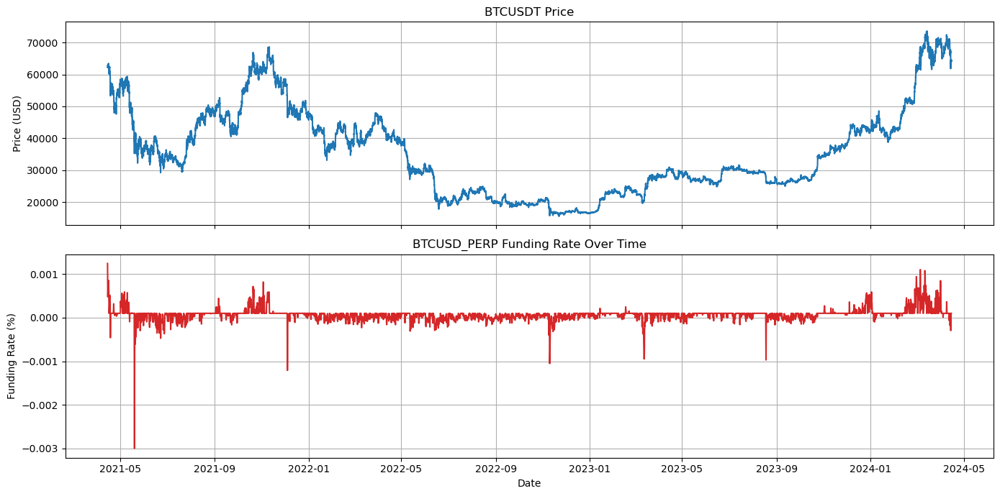

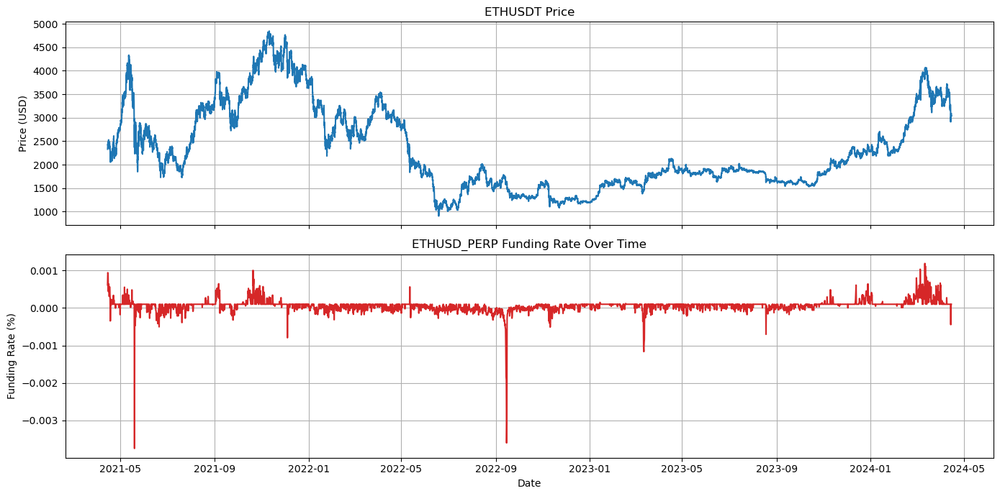

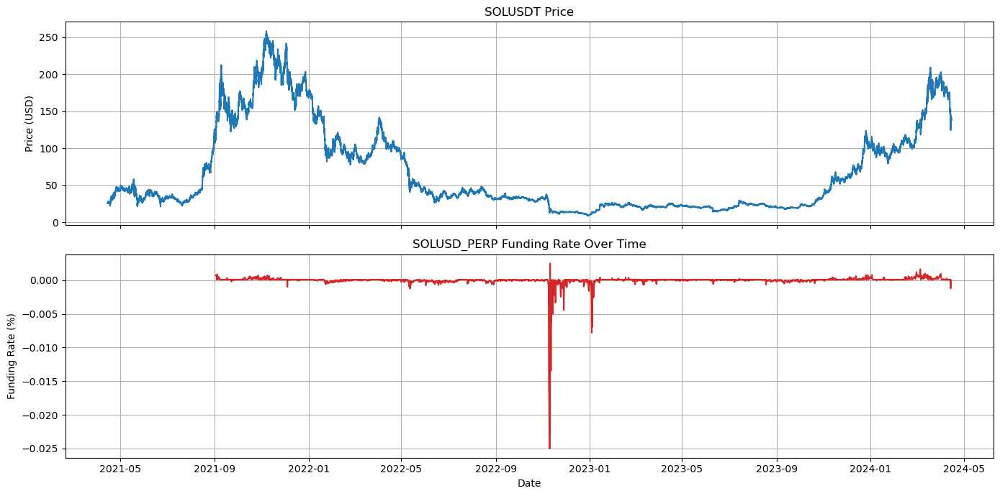

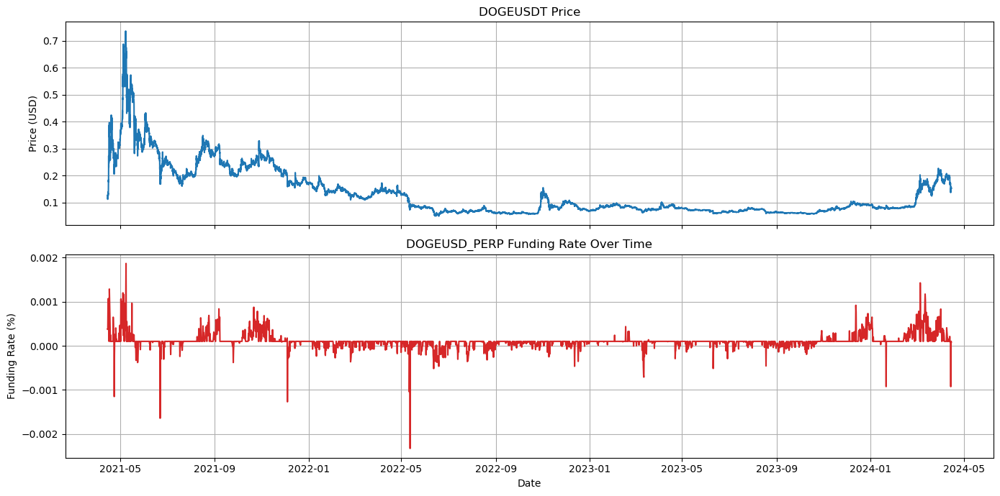

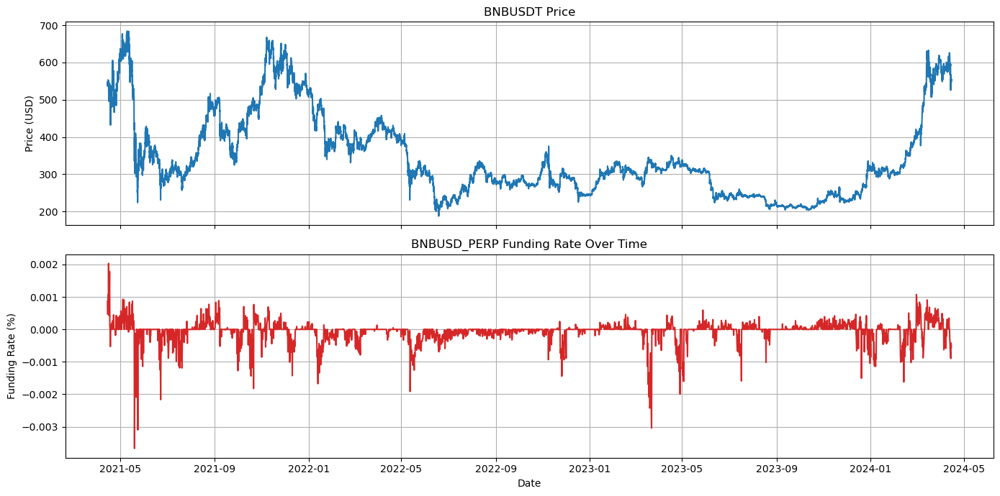

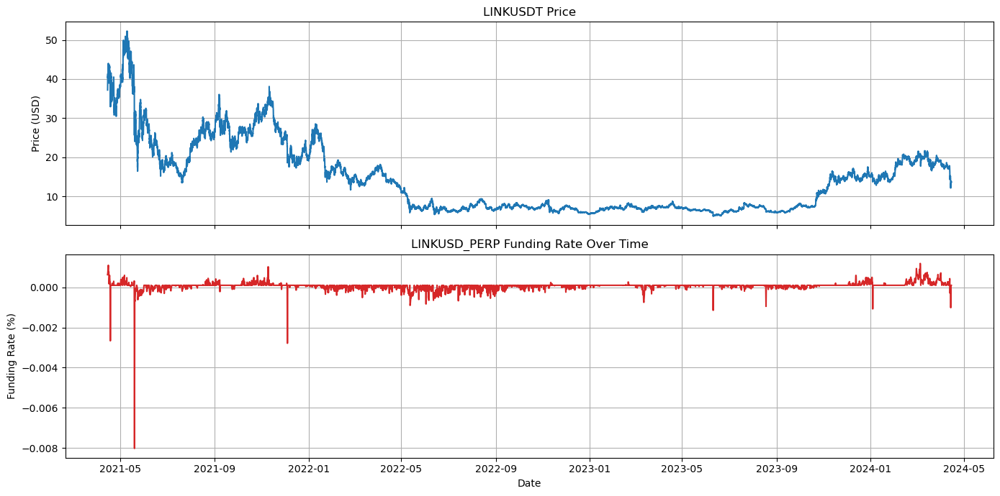

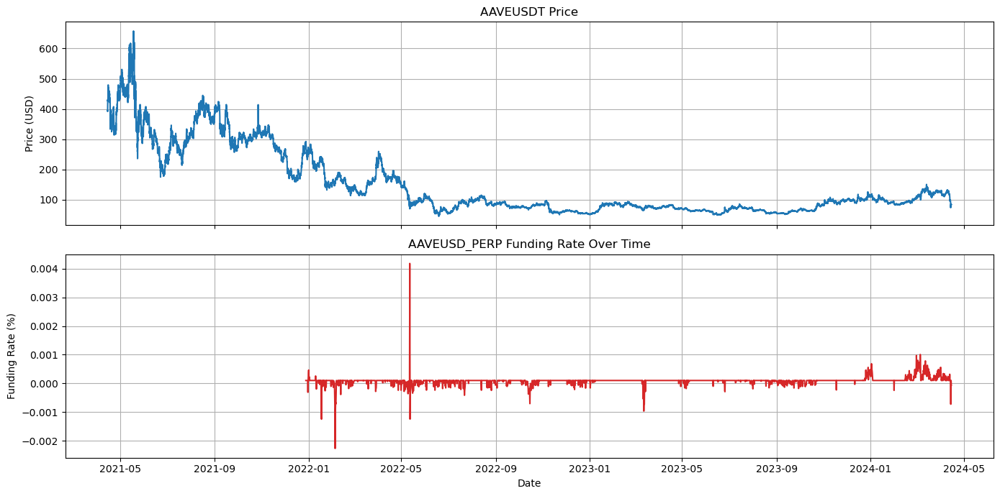

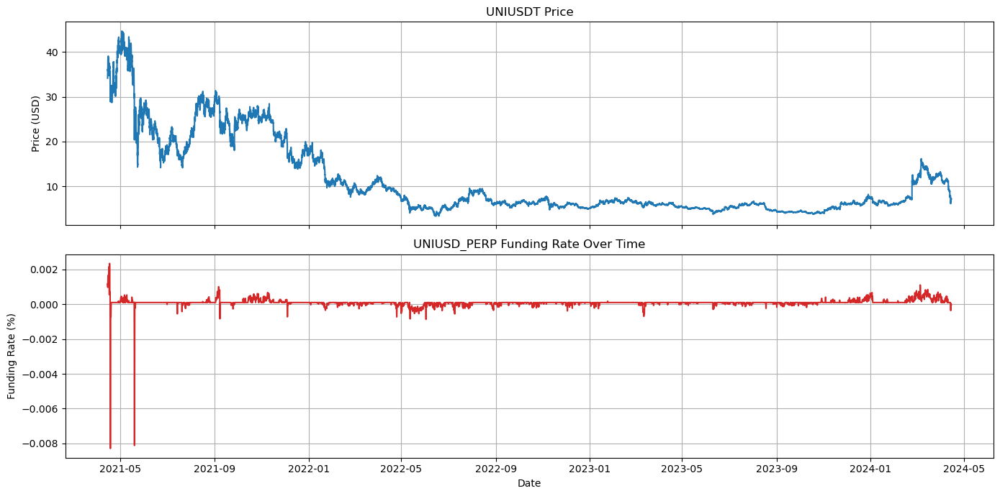

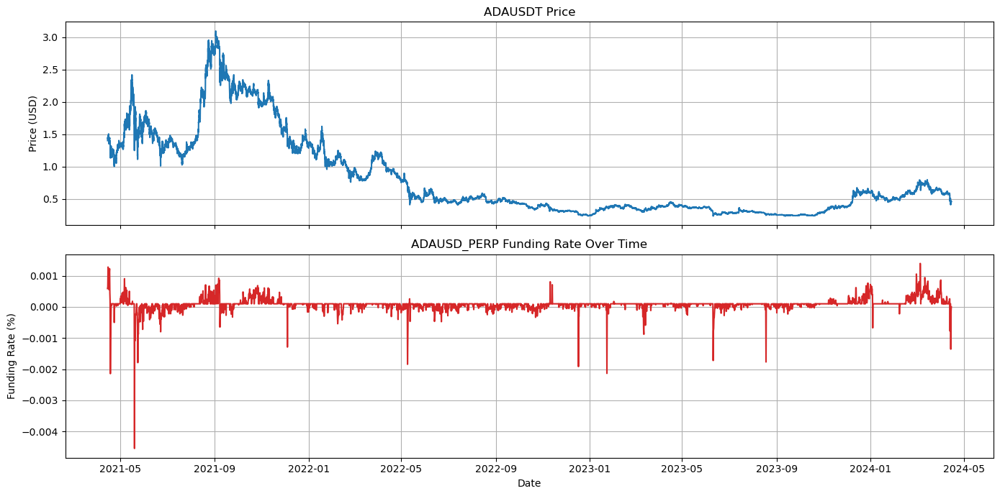

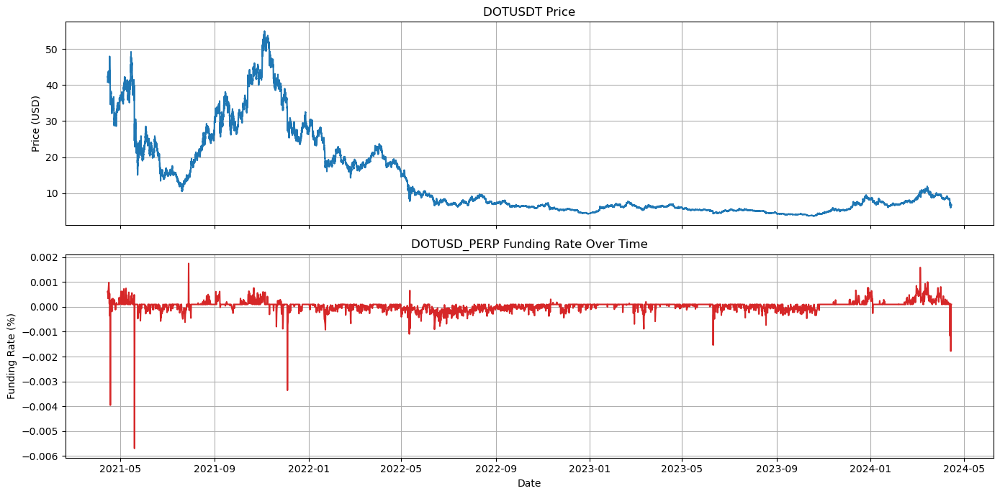

In [33]:
# Plotting spot prices against funding rates on a similar axis
for spot,rates in zip(interested_coins,interested_perps):
    spot_df = spot[:-4].lower() + '_hist_df'
    rates_df = rates[:-5].lower() + '_funding_hist_df'

    spot_df= globals()[spot_df]
    rates_df= globals()[rates_df]
    
    fig, axs = plt.subplots(2, 1, figsize=(14, 7), sharex=True)

    axs[0].plot(spot_df['close_time'], spot_df['close'], color='tab:blue')
    axs[0].set_title(f'{spot} Price')
    axs[0].set_ylabel('Price (USD)')
    axs[0].grid(True)

    axs[1].plot(rates_df['fundingTime'], rates_df['fundingRate'], color='tab:red')
    axs[1].set_title(f'{rates} Funding Rate Over Time')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Funding Rate (%)')
    plt.grid(True)

    fig.tight_layout()
    plt.show()

##### General Observation
1. When there is a sharp dip in spot prices across all the cryptocurrencies, there will be a sharp dip in funding rates as well.
2. Funding Rates for AAVE has been generally negative
3. From the above plot, it is evident that there is a mismatch is starting date between the spot price and funding rate for 2 coins.

These two coins are:
1. SOL
2. AAVE

##### General Trend Observation: 
1. Across all charts, there was a key testing of support in May 2022


##### Seasonality:  
The data shows a clear seasonal trends in the bull and bear market cycles. Using Bitcoin's price action as reference, I will split the time periods into the following cycles:
1. Before 2022-05: Bull Market Cycle 1
2. Between 2022-5 to 2023-09: Bear Market Cycle
3. After 2023-09: Bull Market Cycle 2





##### Data Cleaning

Before proceeding to analysis the price actions and funding rate, I will combine both historical prices and funding rates into one dataframe

In [34]:
btc_hist_df.head()

,open_time,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore,percent_return
0,2021-04-14 17:00:00,63484.79,63764.62,62231.49,62250.14,3905.678478,2021-04-14 17:59:59.999,2.459116e+08,101499,1701.971648,1.072217e+08,0,-1.944797
1,2021-04-14 18:00:00,62250.14,62697.53,61568.00,62119.26,5025.114605,2021-04-14 18:59:59.999,3.124764e+08,130017,2269.510122,1.411755e+08,0,-0.210249
2,2021-04-14 19:00:00,62119.26,62496.45,61301.00,62150.04,4727.102401,2021-04-14 19:59:59.999,2.923069e+08,119021,2258.987982,1.397200e+08,0,0.049550
3,2021-04-14 20:00:00,62150.03,62479.08,61873.51,62397.39,1987.515450,2021-04-14 20:59:59.999,1.235638e+08,68090,967.471768,6.015061e+07,0,0.398005
4,2021-04-14 21:00:00,62397.39,62838.18,62363.50,62773.65,2128.235856,2021-04-14 21:59:59.999,1.332899e+08,88464,960.446884,6.015637e+07,0,0.603006


In [35]:
btcusd_funding_hist_df.head()

,symbol,fundingTime,fundingRate,markPrice
0,BTCUSD_PERP,2021-04-14 16:00:00.001,0.001244,
1,BTCUSD_PERP,2021-04-15 00:00:00.011,0.000479,
2,BTCUSD_PERP,2021-04-15 08:00:00.002,0.000671,
3,BTCUSD_PERP,2021-04-15 16:00:00.000,0.000727,
4,BTCUSD_PERP,2021-04-16 00:00:00.006,0.000856,


**merge_prices_rates(spot_price_df, funding_data_df)**

The function of *merge_prices_rates* was created to combine the dataframes of historical prices and funding rates. It takes the following parameteres:
- spot_price_df: Historical Price DataFrame (eg. btc_hist_df)
- funding_data_df: Historical Funding Rates DataFrame (eg. btc_funding_hist_df)

In *merge_prices_rates*, I conduct the following operations:

1. On spot_price_df:
<ul>
    <li>Resample on the basis of the closing  time in each dataframe to an 8 hour frequency. This is done to match the Funding Rate window</li>
    <li>Aggregate the different columns based on: </li>
    <ul>
        <li>First Open Time</li>
        <li>Last Open Time</li>
        <li>First Opening Price</li>
        <li>Last Closing Price</li>
        <li>Maximum Price recorded</li>
        <li>Minimum Price recorded</li>
    </ul>
</ul>

2. Merge spot_price_df and funding_data_df using *merge_asof*:
- Keys of open_time in spot_price_df and fundingTime in funding_data_df were used for merge
- Direction "nearest" was used in case of no exact match

In [36]:
def merge_prices_rates(spot_price_df, funding_data_df):
    """Merge the spot price data with the funding rate data using resampling."""

    spot_price_eight_hour_agg = spot_price_df.resample('8H', on='close_time').agg({
                                                        'open': 'first',
                                                        'close': 'last',
                                                        'high': 'max',
                                                        'low': 'min',
                                                        'open_time': 'first',
                                                        'close_time': 'last'
                                                    }).reset_index(drop=True)
    
    data_join = pd.merge_asof(spot_price_eight_hour_agg, funding_data_df, 
                                left_on='open_time', right_on='fundingTime', direction='nearest')

    data_join = compute_percent_return(data_join)

    return data_join

*merged_dict* was then created to store all merged dataframes created.

Similarly, a variable of *"symbol"_merged_df* was recreated for easier retrieval

In [37]:
merged_dict = {}

for i, j in zip(interested_coins, interested_perps):
    spot_df = i[:-4].lower() + '_hist_df'
    rates_df = j[:-5].lower() + '_funding_hist_df'

    spot_df = globals()[spot_df]
    rates_df = globals()[rates_df]

    print('Merging', i, 'and', j)
    globals()[i[:-4].lower() + '_merged_df'] = merge_prices_rates(spot_df, rates_df)

    n = 'merged_' + i[:-4].lower()

    merged_dict[n] = globals()[i[:-4].lower() + '_merged_df']

print(merged_dict.keys())

Merging BTCUSDT and BTCUSD_PERP
Merging ETHUSDT and ETHUSD_PERP
Merging SOLUSDT and SOLUSD_PERP
Merging DOGEUSDT and DOGEUSD_PERP
Merging BNBUSDT and BNBUSD_PERP
Merging LINKUSDT and LINKUSD_PERP
Merging AAVEUSDT and AAVEUSD_PERP
Merging UNIUSDT and UNIUSD_PERP
Merging ADAUSDT and ADAUSD_PERP
Merging DOTUSDT and DOTUSD_PERP
dict_keys(['merged_btc', 'merged_eth', 'merged_sol', 'merged_doge', 'merged_bnb', 'merged_link', 'merged_aave', 'merged_uni', 'merged_ada', 'merged_dot'])


In [38]:
merged_dict['merged_btc'].head()

,open,close,high,low,open_time,close_time,symbol,fundingTime,fundingRate,markPrice,percent_return
0,63484.79,62959.53,63764.62,61301.00,2021-04-14 17:00:00,2021-04-14 23:59:59.999,BTCUSD_PERP,2021-04-14 16:00:00.001,0.001244,,-0.827379
1,62959.53,62842.56,63491.45,62333.55,2021-04-15 00:00:00,2021-04-15 07:59:59.999,BTCUSD_PERP,2021-04-15 00:00:00.011,0.000479,,-0.185786
2,62842.56,62715.18,63137.92,62020.00,2021-04-15 08:00:00,2021-04-15 15:59:59.999,BTCUSD_PERP,2021-04-15 08:00:00.002,0.000671,,-0.202697
3,62715.17,63159.98,63800.00,62308.00,2021-04-15 16:00:00,2021-04-15 23:59:59.999,BTCUSD_PERP,2021-04-15 16:00:00.000,0.000727,,0.709254
4,63158.74,61414.83,63520.61,61025.00,2021-04-16 00:00:00,2021-04-16 07:59:59.999,BTCUSD_PERP,2021-04-16 00:00:00.006,0.000856,,-2.761154


In [39]:
merged_dict['merged_sol'].head()

,open,close,high,low,open_time,close_time,symbol,fundingTime,fundingRate,markPrice,percent_return
0,26.4082,26.4067,27.1586,25.0059,2021-04-14 17:00:00,2021-04-14 23:59:59.999,SOLUSD_PERP,2021-09-02 08:00:00.007,0.000764,,-0.005680
1,26.4182,26.7502,26.9000,25.4479,2021-04-15 00:00:00,2021-04-15 07:59:59.999,SOLUSD_PERP,2021-09-02 08:00:00.007,0.000764,,1.256709
2,26.7532,27.2446,27.6871,26.3317,2021-04-15 08:00:00,2021-04-15 15:59:59.999,SOLUSD_PERP,2021-09-02 08:00:00.007,0.000764,,1.836790
3,27.2649,27.7816,28.2000,26.7152,2021-04-15 16:00:00,2021-04-15 23:59:59.999,SOLUSD_PERP,2021-09-02 08:00:00.007,0.000764,,1.895111
4,27.7946,26.9631,28.2571,26.7286,2021-04-16 00:00:00,2021-04-16 07:59:59.999,SOLUSD_PERP,2021-09-02 08:00:00.007,0.000764,,-2.991588


In [40]:
merged_dict['merged_aave'].head()

,open,close,high,low,open_time,close_time,symbol,fundingTime,fundingRate,markPrice,percent_return
0,401.852,428.517,431.100,387.105,2021-04-14 17:00:00,2021-04-14 23:59:59.999,AAVEUSD_PERP,2021-12-28 08:00:00,0.0001,,6.635528
1,428.474,438.825,441.000,422.300,2021-04-15 00:00:00,2021-04-15 07:59:59.999,AAVEUSD_PERP,2021-12-28 08:00:00,0.0001,,2.415783
2,438.632,466.696,489.000,431.007,2021-04-15 08:00:00,2021-04-15 15:59:59.999,AAVEUSD_PERP,2021-12-28 08:00:00,0.0001,,6.398074
3,466.898,466.076,481.559,458.105,2021-04-15 16:00:00,2021-04-15 23:59:59.999,AAVEUSD_PERP,2021-12-28 08:00:00,0.0001,,-0.176056
4,466.076,444.566,470.073,431.743,2021-04-16 00:00:00,2021-04-16 07:59:59.999,AAVEUSD_PERP,2021-12-28 08:00:00,0.0001,,-4.615127


In [41]:
merged_dict['merged_aave'].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3289 entries, 0 to 3288
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   open            3289 non-null   float64       
 1   close           3289 non-null   float64       
 2   high            3289 non-null   float64       
 3   low             3289 non-null   float64       
 4   open_time       3289 non-null   datetime64[ns]
 5   close_time      3289 non-null   datetime64[ns]
 6   symbol          3289 non-null   object        
 7   fundingTime     3289 non-null   datetime64[ns]
 8   fundingRate     3289 non-null   float64       
 9   markPrice       3289 non-null   object        
 10  percent_return  3289 non-null   float64       
dtypes: datetime64[ns](3), float64(6), object(2)
memory usage: 308.3+ KB


Future EDA and Anaylsis will be conducted on merged_dict.copy()

In [42]:
merged_dict_copy = merged_dict.copy()

**align_timeframe(data)**

The function of *align_timeframe* was created to match the candle's opening price and the opening time of the funding rate. It takes the following parameteres:
- data: merged_df consisting of spot price and funding rates (eg. btc_merged_df)

In *align_timeframe*, I conduct the following operations:

1. Store the Opening Time of price and funding Rate, and Closing Time for Funding Time
2. Create a variable, *slicer*, which will be used to slice the dataframe such that the first recorded open time is in the window of the first recorded funding time

In [43]:
def align_timeframe(data):
    """Align the opening and closing candles of the coin to the nearest funding rate timestamp."""

    first_open_time = data.iloc[0]['open_time']
    open_funding_time = data.iloc[0]['fundingTime']  - timedelta(minutes=1)
    close_funding_time = open_funding_time + timedelta(hours=8, minutes=2)

    print(first_open_time)
    print(open_funding_time)
    print(close_funding_time)

    slicer = None

    for i in range(len(data)):
        open_time = data.iloc[i]['open_time']
        close_time = data.iloc[i]['close_time']
        if (open_time >= open_funding_time) and (close_time <= close_funding_time):
            slicer = i
            print(f"Valid row found at index {slicer} with open_time {open_time} and close_time {close_time} | funding window from {open_funding_time} tp {close_funding_time}")
            break
    
    if slicer is not None:
        # Slice df from row 'slicer' onwards
        data = data.iloc[slicer:]
        print('Data sliced from row:', slicer)
    else:
        print('No valid row found within the funding window.')

    print('Remaining data shape:', data.shape)
    data.reset_index(drop=True, inplace=True)
    return data

In [44]:
for i in merged_dict_copy.keys():
    print('Checking timeframe alignment in', i)
    merged_dict_copy[i] = align_timeframe(merged_dict_copy[i])
    print()

Checking timeframe alignment in merged_btc
2021-04-14 17:00:00
2021-04-14 15:59:00.001000
2021-04-15 00:01:00.001000
Valid row found at index 0 with open_time 2021-04-14 17:00:00 and close_time 2021-04-14 23:59:59.999000 | funding window from 2021-04-14 15:59:00.001000 tp 2021-04-15 00:01:00.001000
Data sliced from row: 0
Remaining data shape: (3289, 11)

Checking timeframe alignment in merged_eth
2021-04-14 17:00:00
2021-04-14 15:59:00.001000
2021-04-15 00:01:00.001000
Valid row found at index 0 with open_time 2021-04-14 17:00:00 and close_time 2021-04-14 23:59:59.999000 | funding window from 2021-04-14 15:59:00.001000 tp 2021-04-15 00:01:00.001000
Data sliced from row: 0
Remaining data shape: (3289, 11)

Checking timeframe alignment in merged_sol
2021-04-14 17:00:00
2021-09-02 07:59:00.007000
2021-09-02 16:01:00.007000
Valid row found at index 422 with open_time 2021-09-02 08:00:00 and close_time 2021-09-02 15:59:59.999000 | funding window from 2021-09-02 07:59:00.007000 tp 2021-09-0

Checking if timeframe aligns and understanding the dataframe

In [45]:
merged_dict_copy['merged_sol'].head()

,open,close,high,low,open_time,close_time,symbol,fundingTime,fundingRate,markPrice,percent_return
0,114.47,121.88,123.50,114.08,2021-09-02 08:00:00,2021-09-02 15:59:59.999,SOLUSD_PERP,2021-09-02 08:00:00.007,0.000764,,6.473312
1,121.87,128.23,131.96,119.54,2021-09-02 16:00:00,2021-09-02 23:59:59.999,SOLUSD_PERP,2021-09-02 16:00:00.011,0.000805,,5.218676
2,128.20,144.69,146.38,128.12,2021-09-03 00:00:00,2021-09-03 07:59:59.999,SOLUSD_PERP,2021-09-03 00:00:00.000,0.000663,,12.862715
3,144.67,140.02,145.19,135.54,2021-09-03 08:00:00,2021-09-03 15:59:59.999,SOLUSD_PERP,2021-09-03 08:00:00.008,0.000588,,-3.214212
4,140.02,146.40,148.99,138.13,2021-09-03 16:00:00,2021-09-03 23:59:59.999,SOLUSD_PERP,2021-09-03 16:00:00.000,0.000100,,4.556492


Checking if there are any missing values

In [46]:
for k in merged_dict_copy.keys():
    print('Checking NaN and Null values for', k)
    print(merged_dict_copy[k].isna().sum())
    print()

Checking NaN and Null values for merged_btc
open              0
close             0
high              0
low               0
open_time         0
close_time        0
symbol            0
fundingTime       0
fundingRate       0
markPrice         0
percent_return    0
dtype: int64

Checking NaN and Null values for merged_eth
open              0
close             0
high              0
low               0
open_time         0
close_time        0
symbol            0
fundingTime       0
fundingRate       0
markPrice         0
percent_return    0
dtype: int64

Checking NaN and Null values for merged_sol
open              0
close             0
high              0
low               0
open_time         0
close_time        0
symbol            0
fundingTime       0
fundingRate       0
markPrice         0
percent_return    0
dtype: int64

Checking NaN and Null values for merged_doge
open              0
close             0
high              0
low               0
open_time         0
close_time        0
s

In [47]:
for k in merged_dict_copy.keys():
    print('Checking info for', k)
    print(merged_dict_copy[k].info())
    print()

Checking info for merged_btc
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3289 entries, 0 to 3288
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   open            3289 non-null   float64       
 1   close           3289 non-null   float64       
 2   high            3289 non-null   float64       
 3   low             3289 non-null   float64       
 4   open_time       3289 non-null   datetime64[ns]
 5   close_time      3289 non-null   datetime64[ns]
 6   symbol          3289 non-null   object        
 7   fundingTime     3289 non-null   datetime64[ns]
 8   fundingRate     3289 non-null   float64       
 9   markPrice       3289 non-null   object        
 10  percent_return  3289 non-null   float64       
dtypes: datetime64[ns](3), float64(6), object(2)
memory usage: 282.8+ KB
None

Checking info for merged_eth
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3289 entries, 0 to 3288
Data c

In [48]:
for k in merged_dict_copy.keys():
    print('Describing ', k)
    print(merged_dict_copy[k].describe())
    print()
    print('=' * 100)
    print()

Describing  merged_btc
               open         close          high           low  fundingRate  \
count   3289.000000   3289.000000   3289.000000   3289.000000  3289.000000   
mean   35626.372840  35626.709571  36089.085020  35117.445351     0.000069   
std    13640.869122  13641.499859  13855.224129  13392.766349     0.000146   
min    15760.420000  15760.420000  15967.760000  15476.000000    -0.003000   
25%    24872.540000  24871.280000  25121.230000  24430.000000     0.000016   
50%    32966.700000  32966.700000  33650.000000  32242.070000     0.000100   
75%    43800.740000  43800.740000  44297.250000  43208.000000     0.000100   
max    73224.000000  73224.000000  73777.000000  72500.000000     0.001244   

       percent_return  
count     3289.000000  
mean         0.016644  
std          1.791486  
min        -11.862286  
25%         -0.689758  
50%         -0.005970  
75%          0.723612  
max          8.967384  


Describing  merged_eth
              open        close  

#### Seasonal analysis

In [49]:
first_bull_cycle = datetime(2022, 5, 1)
first_bull_cycle_dict = {}

bear_cycle = datetime(2023, 9, 1)
bear_cycle_dict ={}

second_bull_cycle_dict = {}

In [50]:
merged_dict_copy['merged_sol']

,open,close,high,low,open_time,close_time,symbol,fundingTime,fundingRate,markPrice,percent_return
0,114.47,121.88,123.50,114.08,2021-09-02 08:00:00,2021-09-02 15:59:59.999,SOLUSD_PERP,2021-09-02 08:00:00.007,0.000764,,6.473312
1,121.87,128.23,131.96,119.54,2021-09-02 16:00:00,2021-09-02 23:59:59.999,SOLUSD_PERP,2021-09-02 16:00:00.011,0.000805,,5.218676
2,128.20,144.69,146.38,128.12,2021-09-03 00:00:00,2021-09-03 07:59:59.999,SOLUSD_PERP,2021-09-03 00:00:00.000,0.000663,,12.862715
3,144.67,140.02,145.19,135.54,2021-09-03 08:00:00,2021-09-03 15:59:59.999,SOLUSD_PERP,2021-09-03 08:00:00.008,0.000588,,-3.214212
4,140.02,146.40,148.99,138.13,2021-09-03 16:00:00,2021-09-03 23:59:59.999,SOLUSD_PERP,2021-09-03 16:00:00.000,0.000100,,4.556492
...,...,...,...,...,...,...,...,...,...,...,...
2862,151.02,148.99,153.39,148.00,2024-04-13 08:00:00,2024-04-13 15:59:59.999,SOLUSD_PERP,2024-04-13 08:00:00.000,0.000100,151.08100000,-1.344193
2863,148.99,138.47,149.64,116.00,2024-04-13 16:00:00,2024-04-13 23:59:59.999,SOLUSD_PERP,2024-04-13 16:00:00.000,0.000028,148.93700000,-7.060877
2864,138.47,144.06,144.56,130.45,2024-04-14 00:00:00,2024-04-14 07:59:59.999,SOLUSD_PERP,2024-04-14 00:00:00.000,-0.001205,138.60291174,4.036976
2865,144.05,137.99,145.60,135.49,2024-04-14 08:00:00,2024-04-14 15:59:59.999,SOLUSD_PERP,2024-04-14 08:00:00.000,0.000037,144.05265900,-4.206873


In [51]:
# Splitting the merged_dataframe into 3 parts to match the cycles
for k, df in merged_dict_copy.items():
    print('Splitting', k)

    # first bull cycle
    first_bull_cycle_data = df[df['open_time'] < first_bull_cycle]

    # bear 
    bear_cycle_data = df[(df['open_time'] >= first_bull_cycle) & (df['open_time'] < bear_cycle)]

    # second bull cycle
    second_bull_cycle_data = df[df['open_time'] >= bear_cycle]

    first_bull_cycle_dict[k] = first_bull_cycle_data
    bear_cycle_dict[k] = bear_cycle_data
    second_bull_cycle_dict[k] = second_bull_cycle_data

Splitting merged_btc
Splitting merged_eth
Splitting merged_sol
Splitting merged_doge
Splitting merged_bnb
Splitting merged_link
Splitting merged_aave
Splitting merged_uni
Splitting merged_ada
Splitting merged_dot


In [52]:
first_bull_cycle_dict['merged_doge'].head()

,open,close,high,low,open_time,close_time,symbol,fundingTime,fundingRate,markPrice,percent_return
0,0.129793,0.121433,0.133453,0.106000,2021-04-14 17:00:00,2021-04-14 23:59:59.999,DOGEUSD_PERP,2021-04-14 16:00:00.001,0.000376,,-6.440958
1,0.121432,0.136280,0.144400,0.119788,2021-04-15 00:00:00,2021-04-15 07:59:59.999,DOGEUSD_PERP,2021-04-15 00:00:00.011,0.000371,,12.227182
2,0.136246,0.133100,0.138719,0.124200,2021-04-15 08:00:00,2021-04-15 15:59:59.999,DOGEUSD_PERP,2021-04-15 08:00:00.002,0.000985,,-2.309057
3,0.133008,0.182360,0.191892,0.132021,2021-04-15 16:00:00,2021-04-15 23:59:59.999,DOGEUSD_PERP,2021-04-15 16:00:00.000,0.001068,,37.104460
4,0.182500,0.245796,0.298828,0.179100,2021-04-16 00:00:00,2021-04-16 07:59:59.999,DOGEUSD_PERP,2021-04-16 00:00:00.006,0.000950,,34.682354


In [53]:
bear_cycle_dict['merged_doge'].head()

,open,close,high,low,open_time,close_time,symbol,fundingTime,fundingRate,markPrice,percent_return
1144,0.1273,0.1318,0.1366,0.1260,2022-05-01 00:00:00,2022-05-01 07:59:59.999,DOGEUSD_PERP,2022-05-01 00:00:00.000,-0.000148,,3.534957
1145,0.1318,0.1336,0.1342,0.1302,2022-05-01 08:00:00,2022-05-01 15:59:59.999,DOGEUSD_PERP,2022-05-01 08:00:00.009,0.000100,,1.365706
1146,0.1337,0.1327,0.1346,0.1295,2022-05-01 16:00:00,2022-05-01 23:59:59.999,DOGEUSD_PERP,2022-05-01 16:00:00.006,-0.000021,,-0.747943
1147,0.1327,0.1319,0.1340,0.1313,2022-05-02 00:00:00,2022-05-02 07:59:59.999,DOGEUSD_PERP,2022-05-02 00:00:00.000,-0.000034,,-0.602864
1148,0.1320,0.1305,0.1321,0.1287,2022-05-02 08:00:00,2022-05-02 15:59:59.999,DOGEUSD_PERP,2022-05-02 08:00:00.001,-0.000028,,-1.136364


In [54]:
second_bull_cycle_dict['merged_doge'].head()

,open,close,high,low,open_time,close_time,symbol,fundingTime,fundingRate,markPrice,percent_return
2608,0.06379,0.06357,0.06413,0.06335,2023-09-01 00:00:00,2023-09-01 07:59:59.999,DOGEUSD_PERP,2023-09-01 00:00:00,-0.000006,,-0.344882
2609,0.06357,0.06338,0.06426,0.06300,2023-09-01 08:00:00,2023-09-01 15:59:59.999,DOGEUSD_PERP,2023-09-01 08:00:00,0.000020,,-0.298883
2610,0.06339,0.06388,0.06405,0.06230,2023-09-01 16:00:00,2023-09-01 23:59:59.999,DOGEUSD_PERP,2023-09-01 16:00:00,0.000057,,0.772993
2611,0.06386,0.06345,0.06403,0.06329,2023-09-02 00:00:00,2023-09-02 07:59:59.999,DOGEUSD_PERP,2023-09-02 00:00:00,0.000054,,-0.642029
2612,0.06344,0.06375,0.06497,0.06305,2023-09-02 08:00:00,2023-09-02 15:59:59.999,DOGEUSD_PERP,2023-09-02 08:00:00,-0.000006,,0.488651


##### Plotting Bull Market Cycle 1

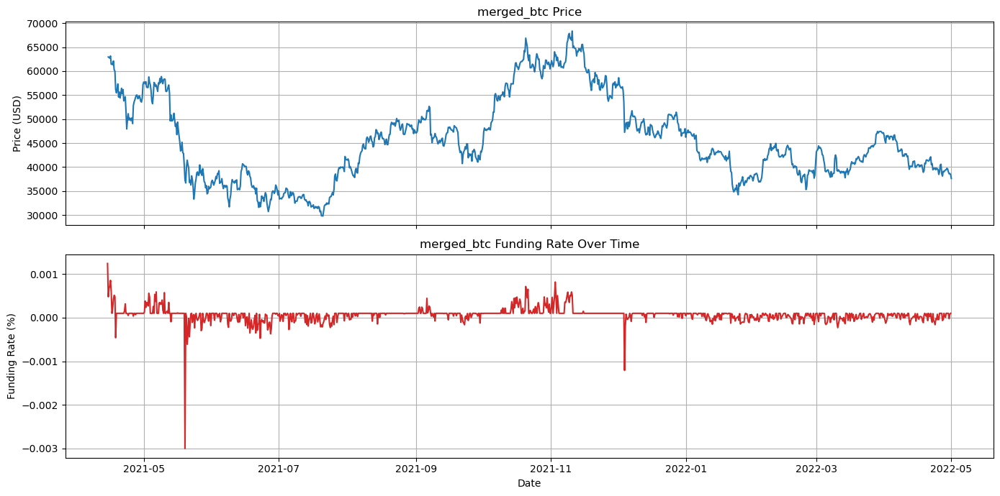

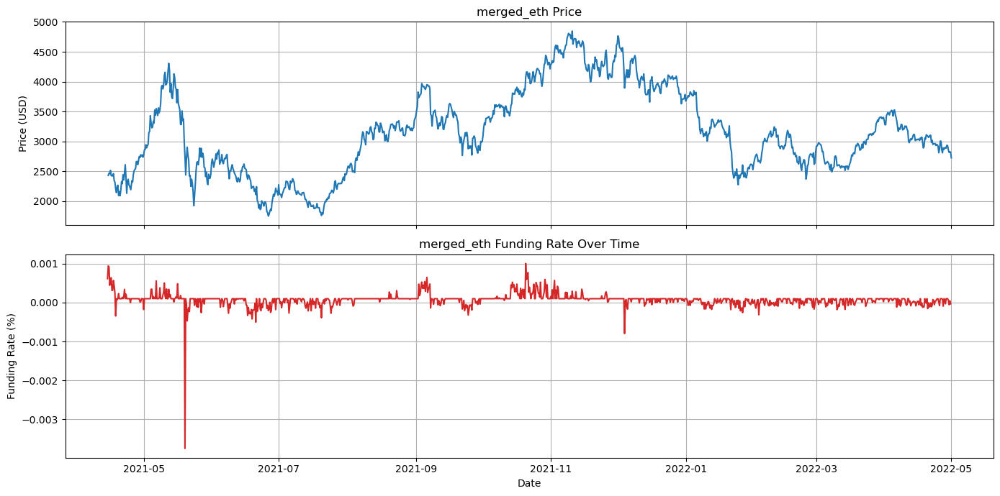

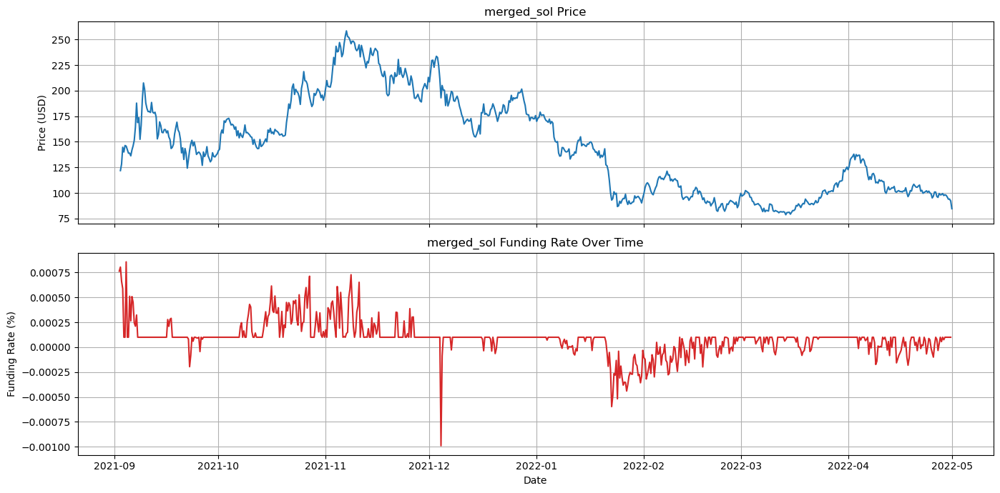

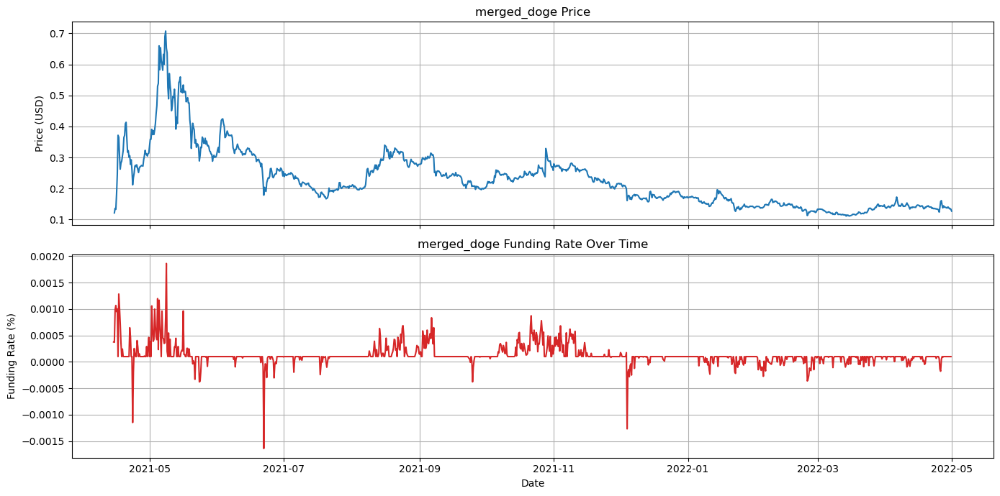

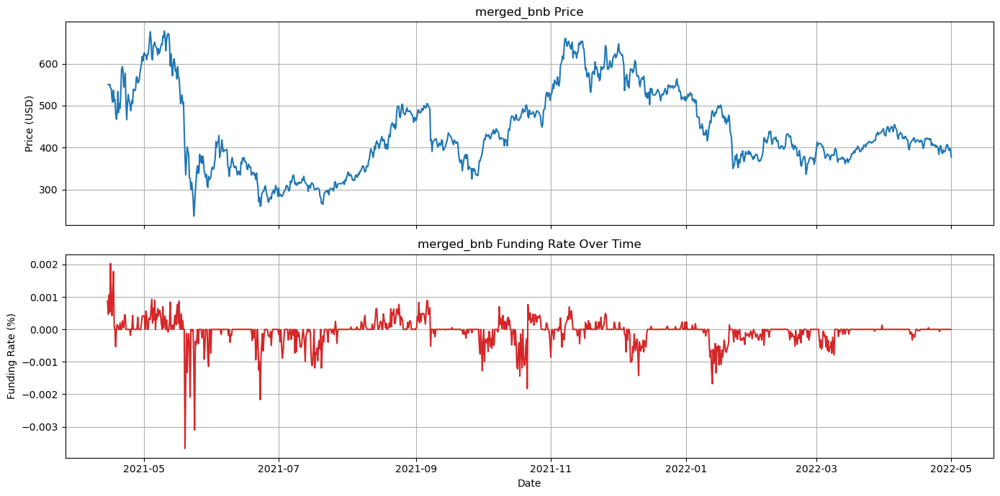

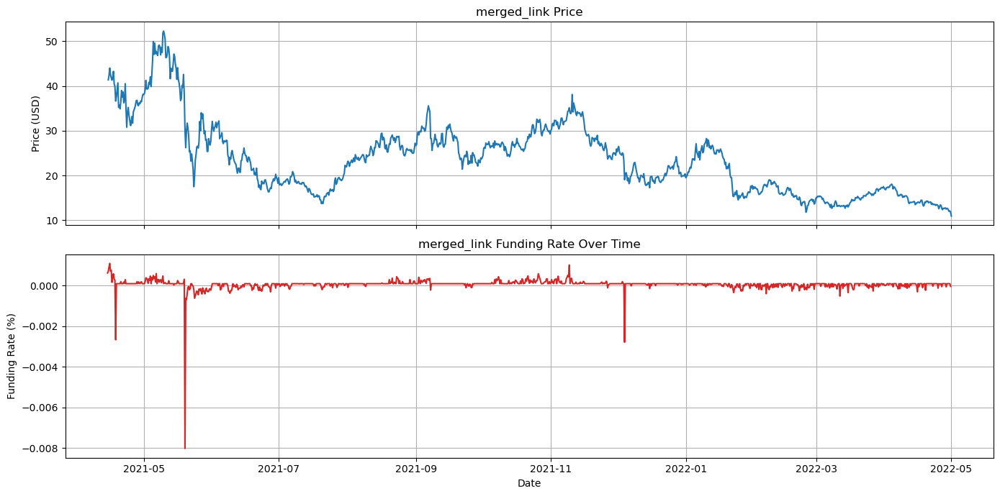

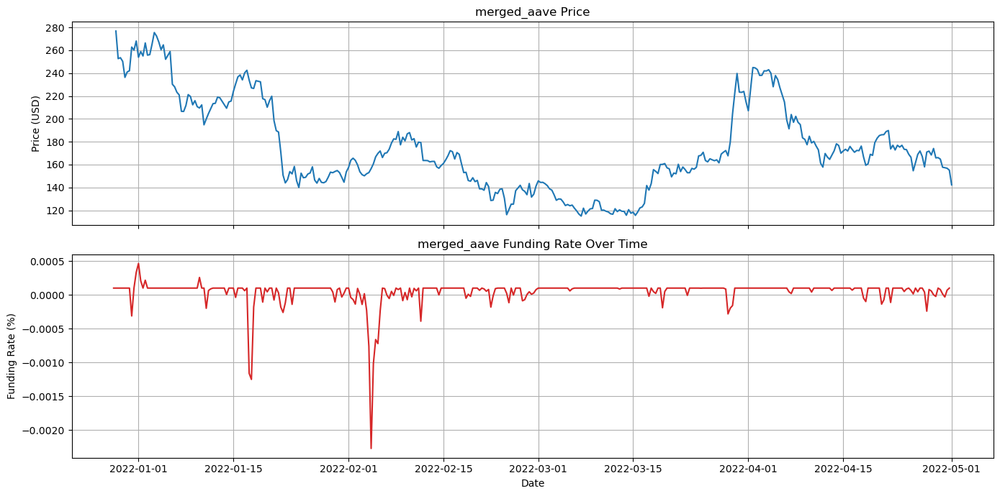

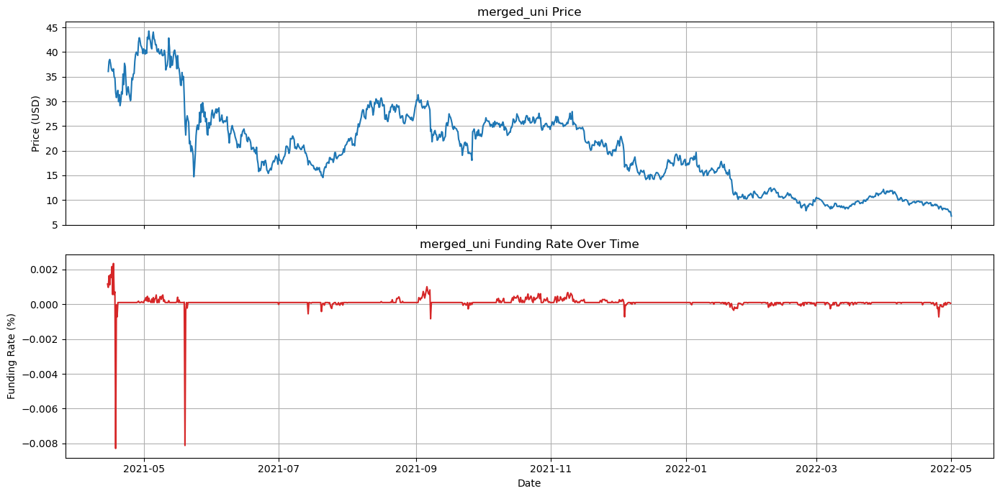

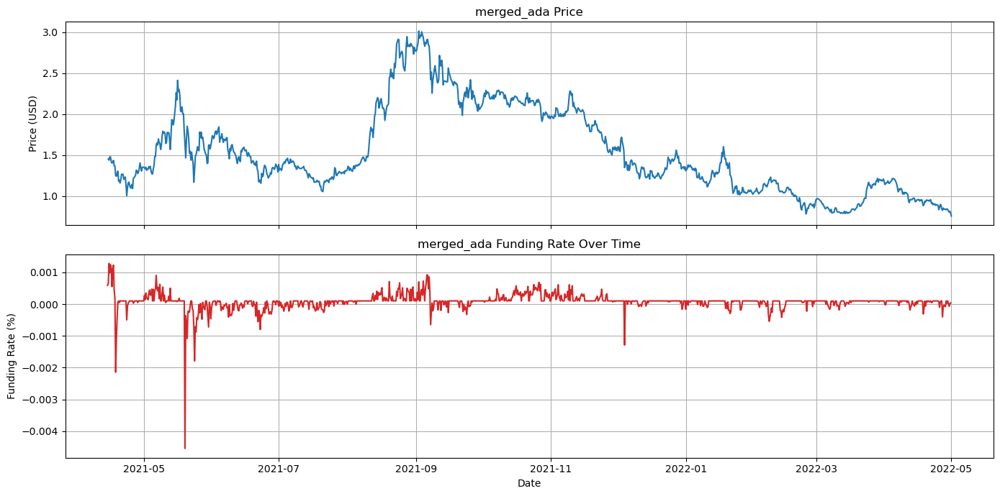

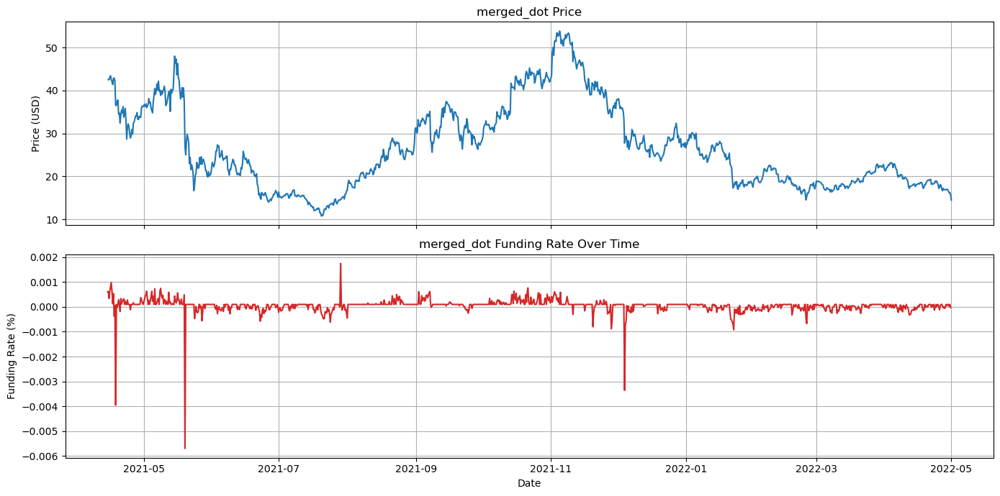

In [55]:
# Plotting spot prices against funding rates on a similar axis for bull cycle 1
for k, df in first_bull_cycle_dict.items():
    fig, axs = plt.subplots(2, 1, figsize=(14, 7), sharex=True)

    axs[0].plot(df['close_time'], df['close'], color='tab:blue')
    axs[0].set_title(f'{k} Price')
    axs[0].set_ylabel('Price (USD)')
    axs[0].grid(True)

    axs[1].plot(df['fundingTime'], df['fundingRate'], color='tab:red')
    axs[1].set_title(f'{k} Funding Rate Over Time')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Funding Rate (%)')
    plt.grid(True)

    fig.tight_layout()
    plt.show()

#### Plotting Bear Cycle

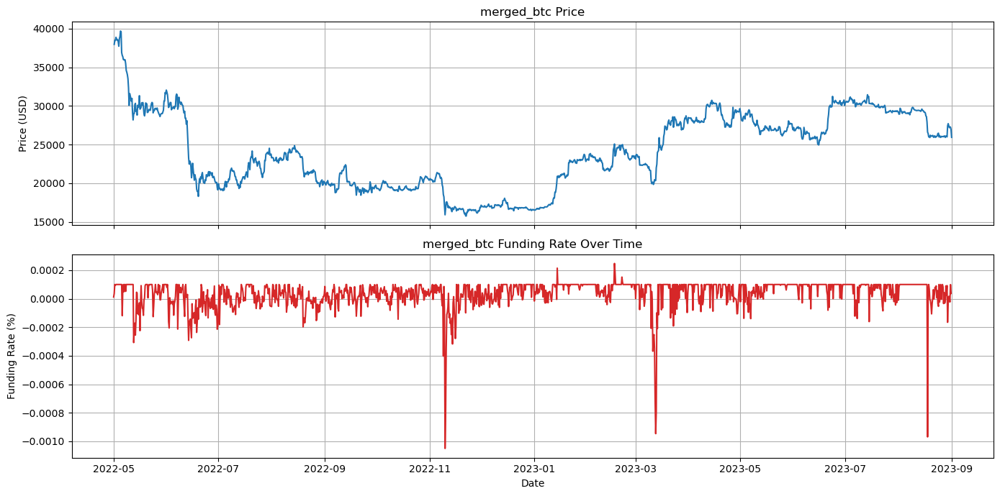

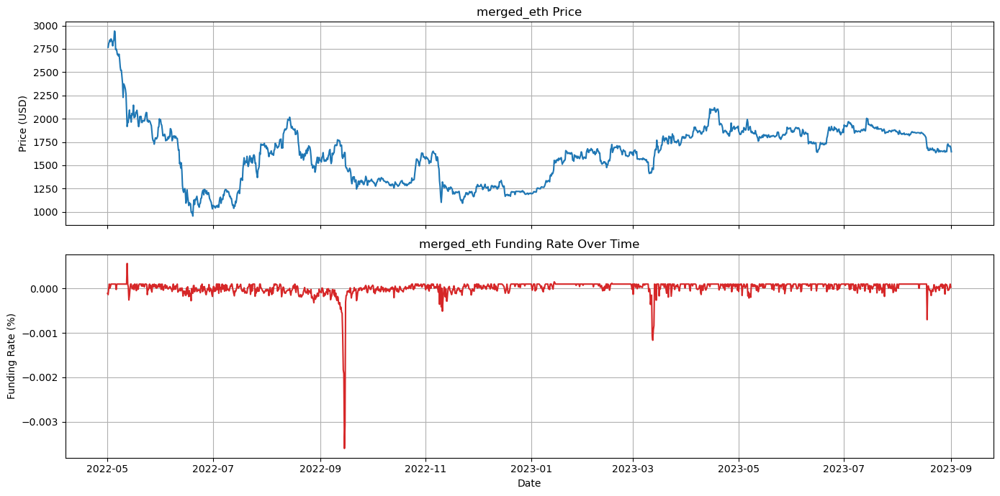

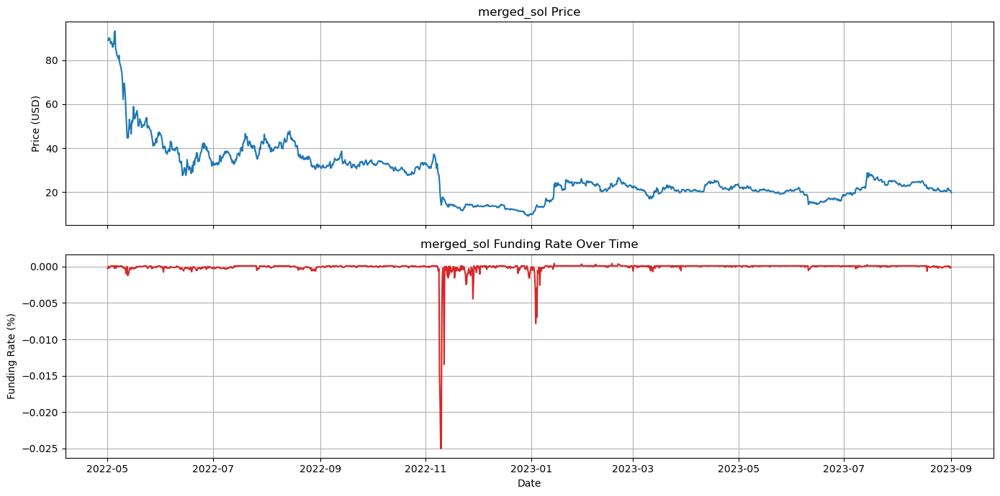

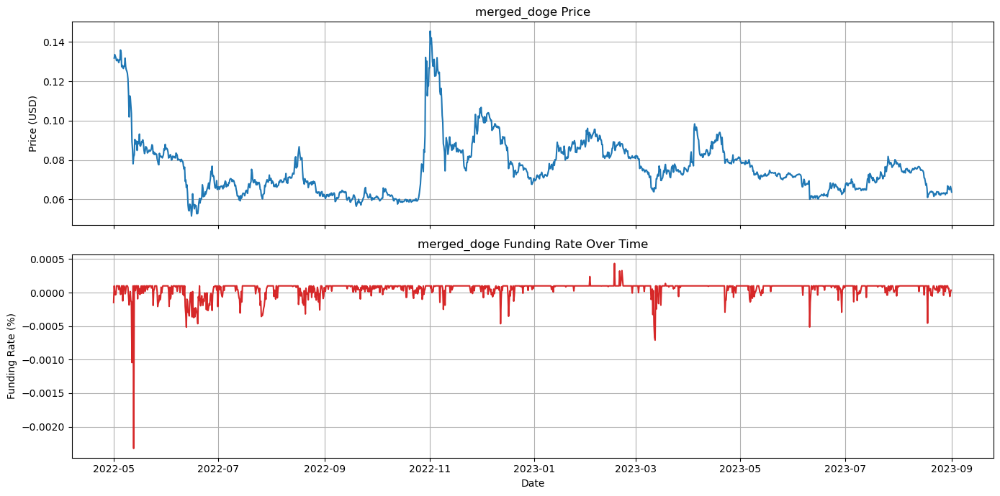

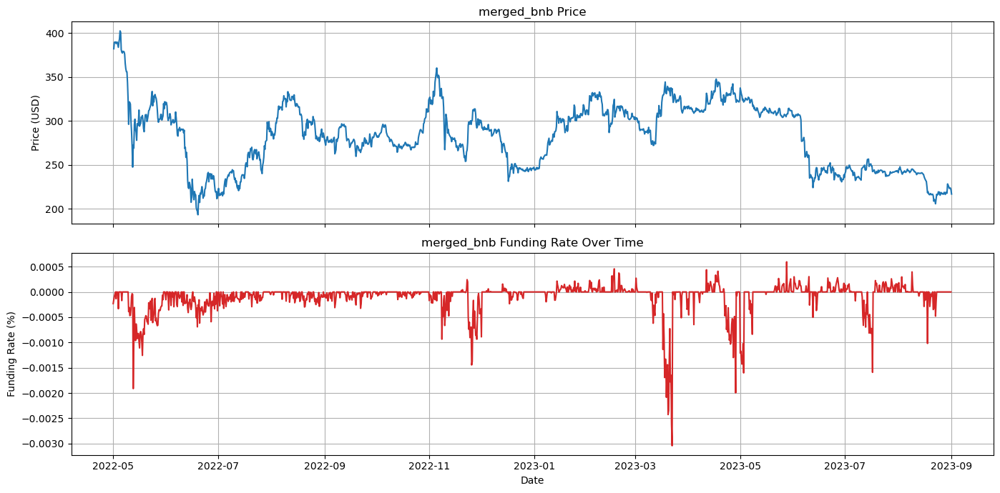

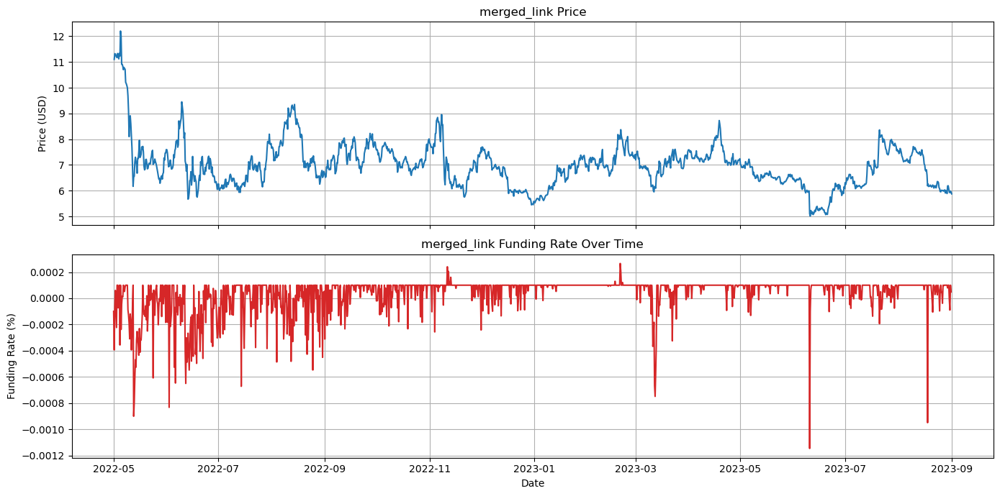

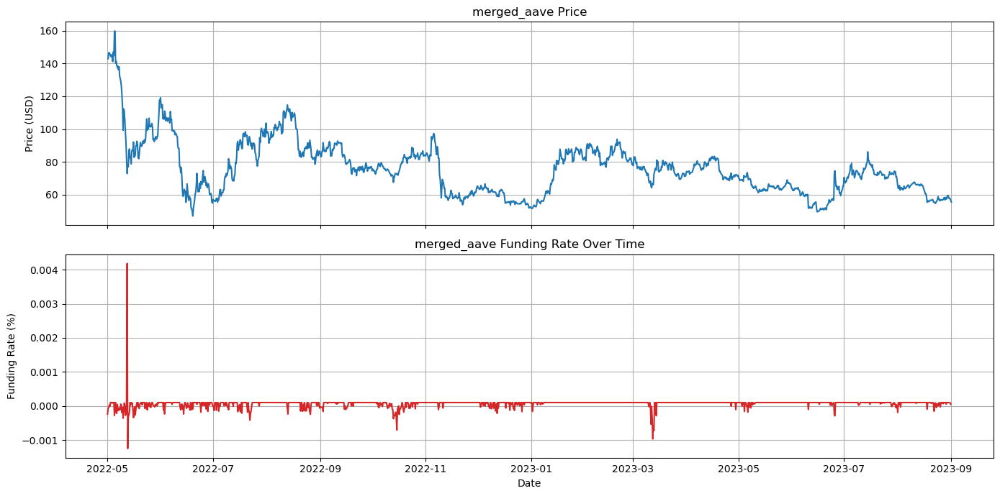

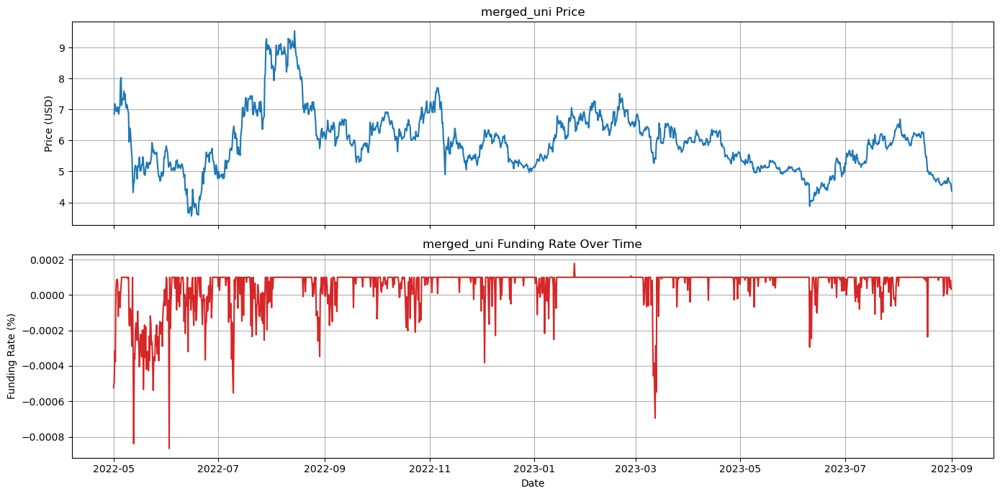

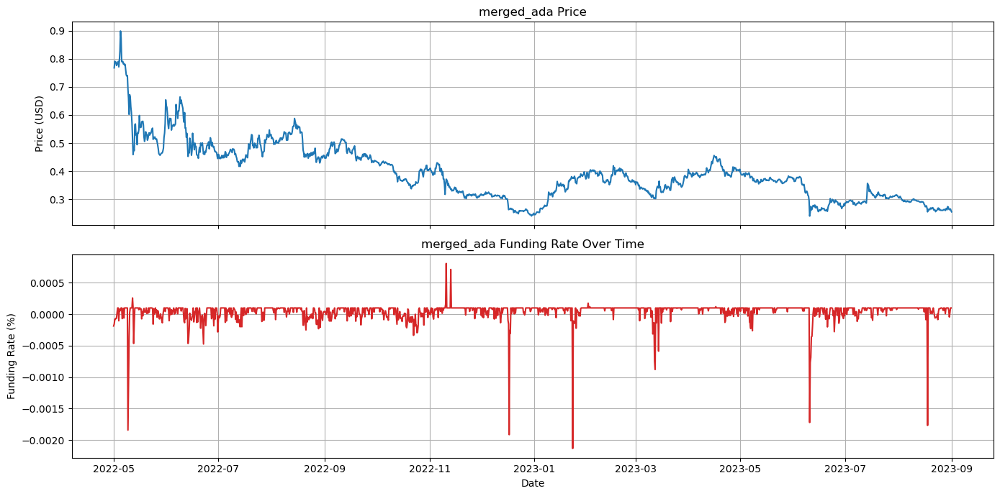

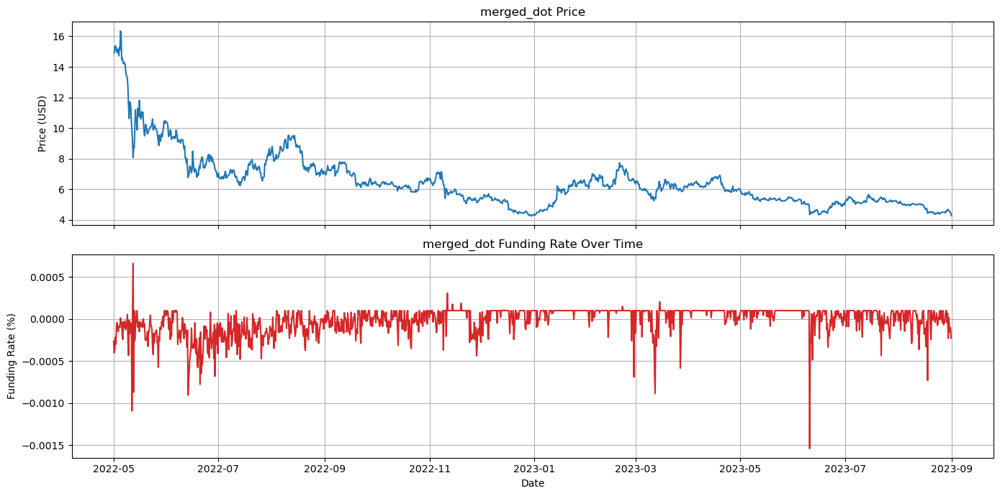

In [56]:
# Plotting spot prices against funding rates on a similar axis for bull cycle 1
for k, df in bear_cycle_dict.items():
    fig, axs = plt.subplots(2, 1, figsize=(14, 7), sharex=True)

    axs[0].plot(df['close_time'], df['close'], color='tab:blue')
    axs[0].set_title(f'{k} Price')
    axs[0].set_ylabel('Price (USD)')
    axs[0].grid(True)

    axs[1].plot(df['fundingTime'], df['fundingRate'], color='tab:red')
    axs[1].set_title(f'{k} Funding Rate Over Time')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Funding Rate (%)')
    plt.grid(True)

    fig.tight_layout()
    plt.show()

#### Plotting Bull Market Cycle 2

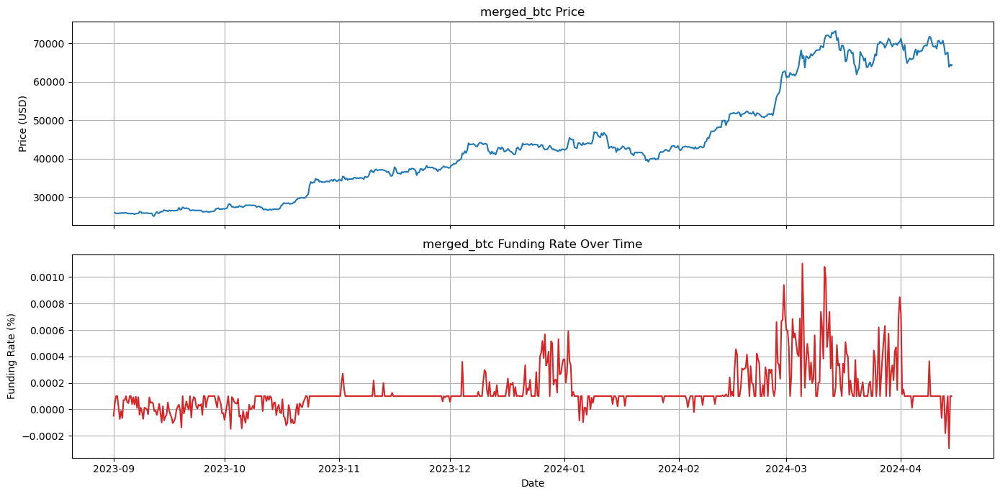

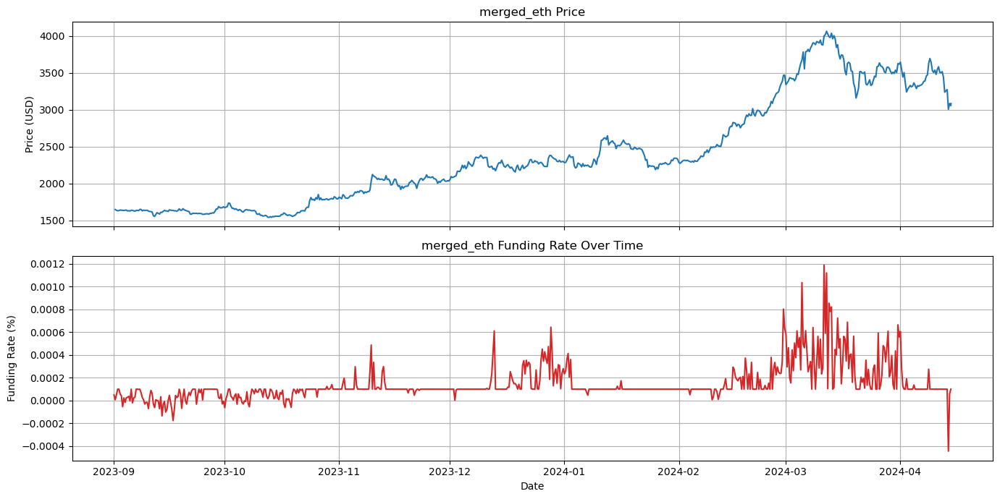

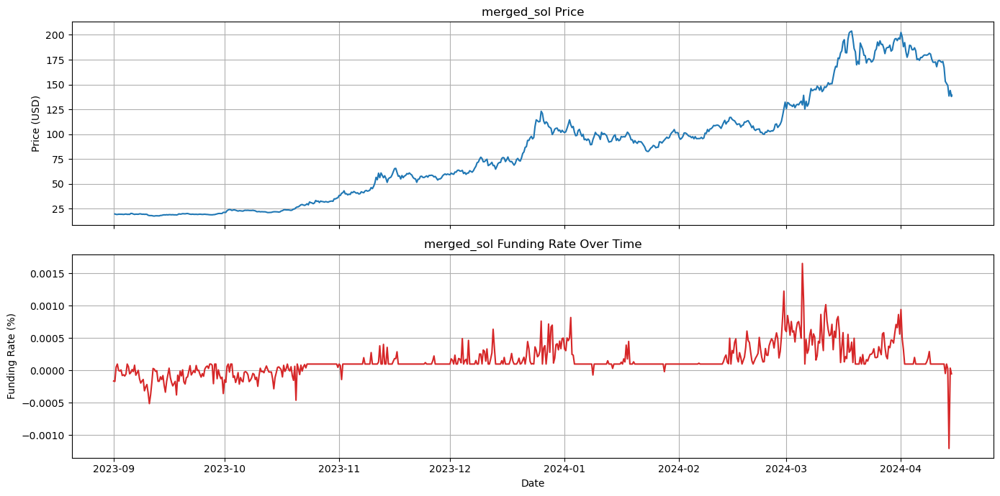

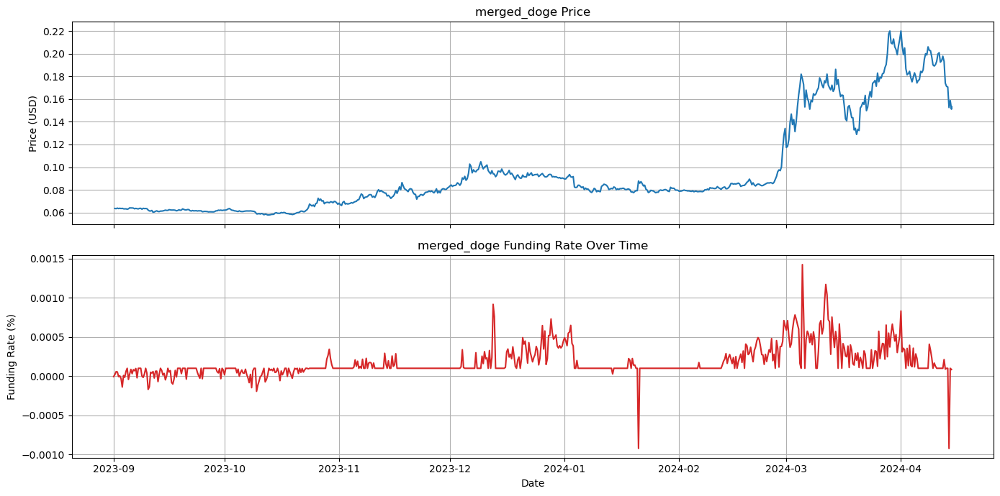

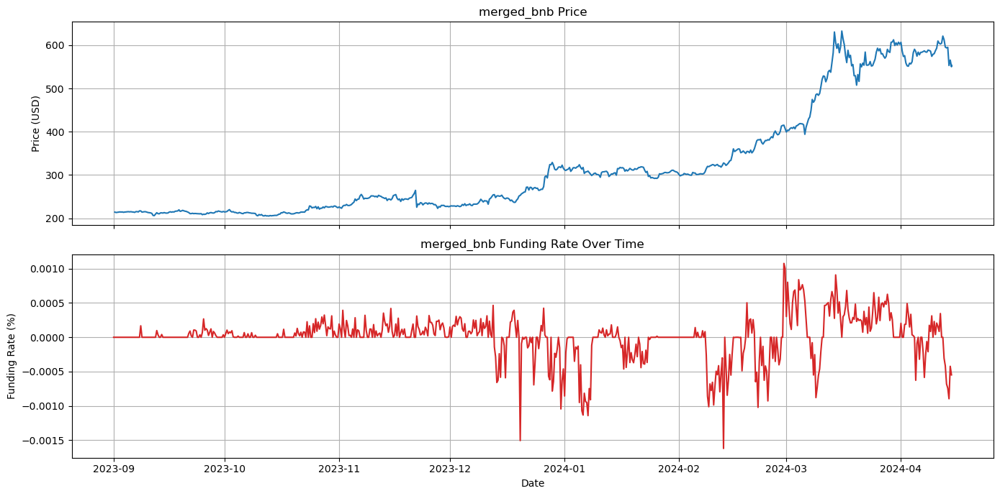

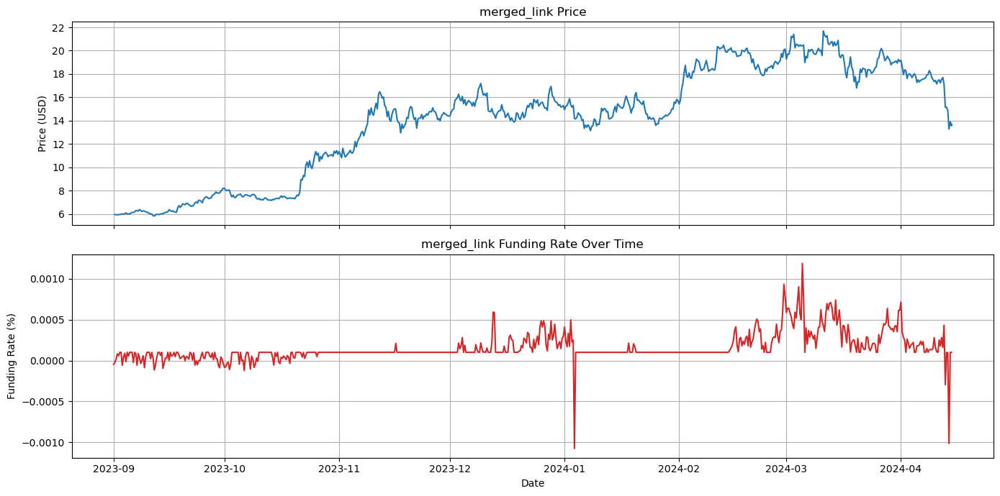

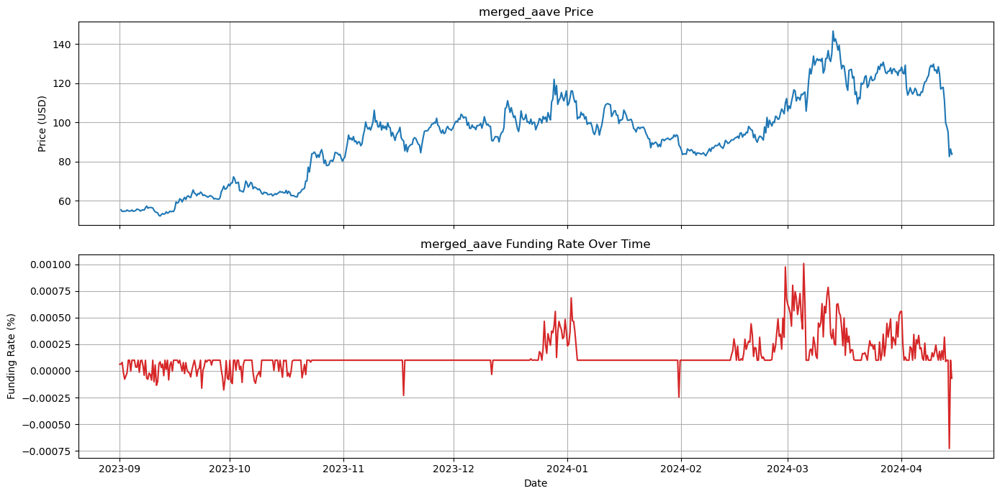

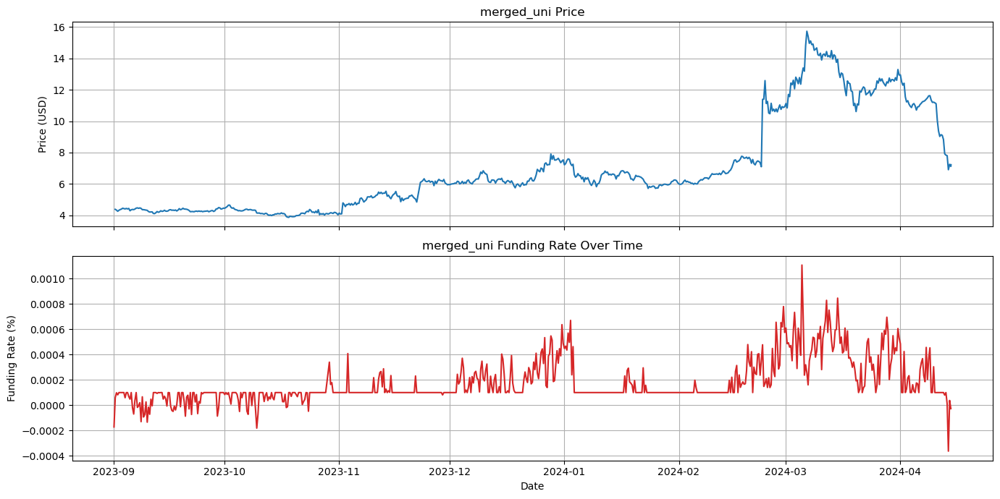

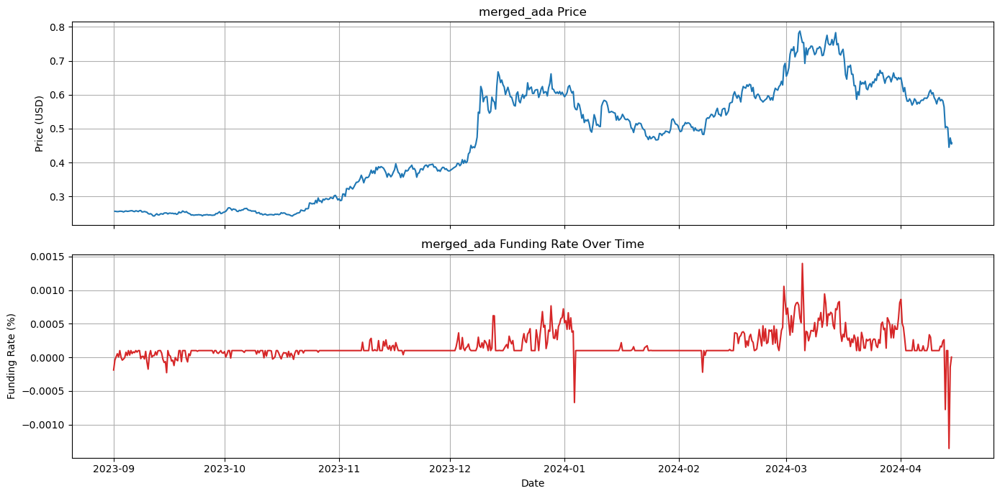

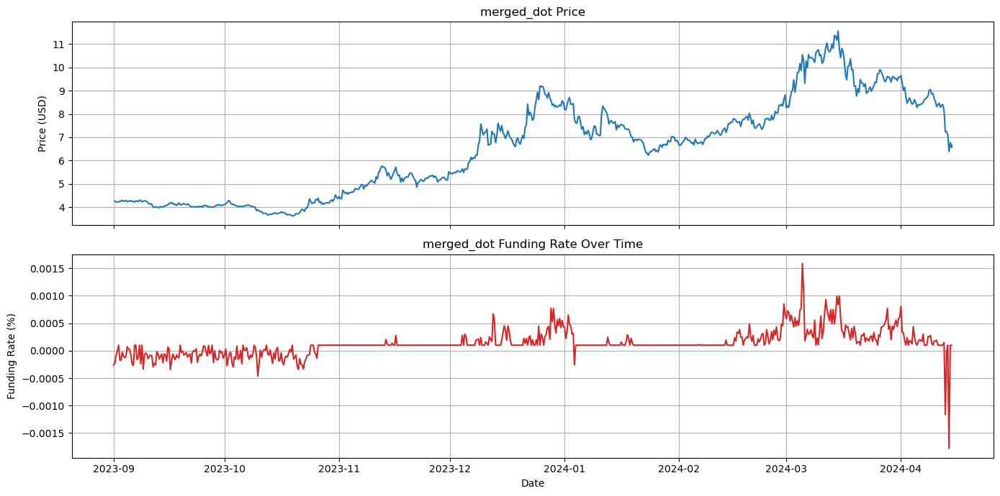

In [57]:
# Plotting spot prices against funding rates on a similar axis for bull cycle 1
for k, df in second_bull_cycle_dict.items():
    fig, axs = plt.subplots(2, 1, figsize=(14, 7), sharex=True)

    axs[0].plot(df['close_time'], df['close'], color='tab:blue')
    axs[0].set_title(f'{k} Price')
    axs[0].set_ylabel('Price (USD)')
    axs[0].grid(True)

    axs[1].plot(df['fundingTime'], df['fundingRate'], color='tab:red')
    axs[1].set_title(f'{k} Funding Rate Over Time')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Funding Rate (%)')
    plt.grid(True)

    fig.tight_layout()
    plt.show()

### Observations:

asda

#### Plotting distribution of funding rates over each cycle

In [58]:
def boxplot_funding_rate(cycle_data, cycle_name):
    n = len(cycle_data)
    rows = (n + 1) // 2  
    fig, axs = plt.subplots(rows, 2, figsize=(16,8)) 
    axs = axs.flatten()  # Flatten the 2D array of axes for easy iteration
    
    for i, (k, df) in enumerate(cycle_data.items()):
        k = k.split('_')[1].upper()
        sns.boxplot(x=df['fundingRate'], ax=axs[i], showmeans=True,
                        meanprops={"marker": "o", "markerfacecolor": "white", "markeredgecolor": "black", "markersize": "10"})
        axs[i].set_title(f'Funding Rates for {k} Perpetual Futures in {cycle_name} Cycle')
        axs[i].set_xlabel('Funding Rate')


    # Adjust the layout
    plt.tight_layout()
    plt.show()


##### Bull Market Cycle 1

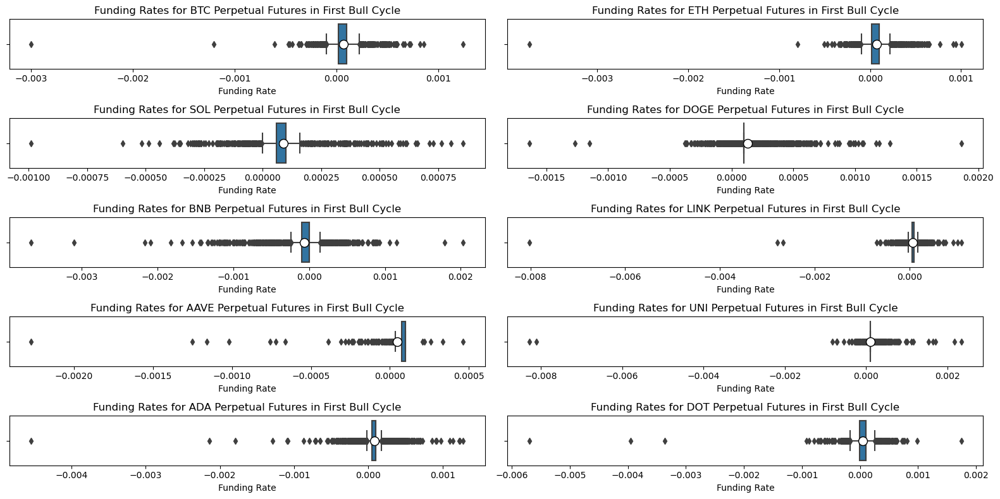

In [59]:
boxplot_funding_rate(first_bull_cycle_dict, "First Bull")

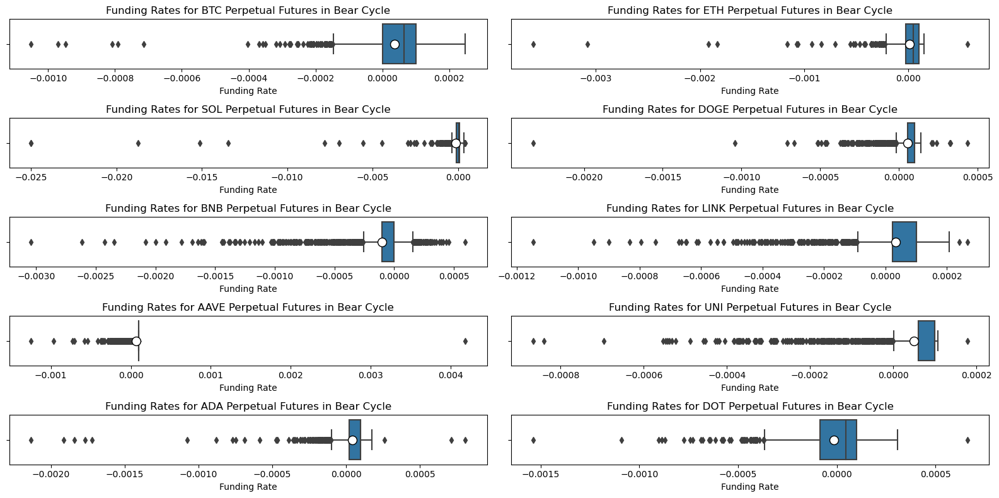

In [60]:
boxplot_funding_rate(bear_cycle_dict, "Bear")

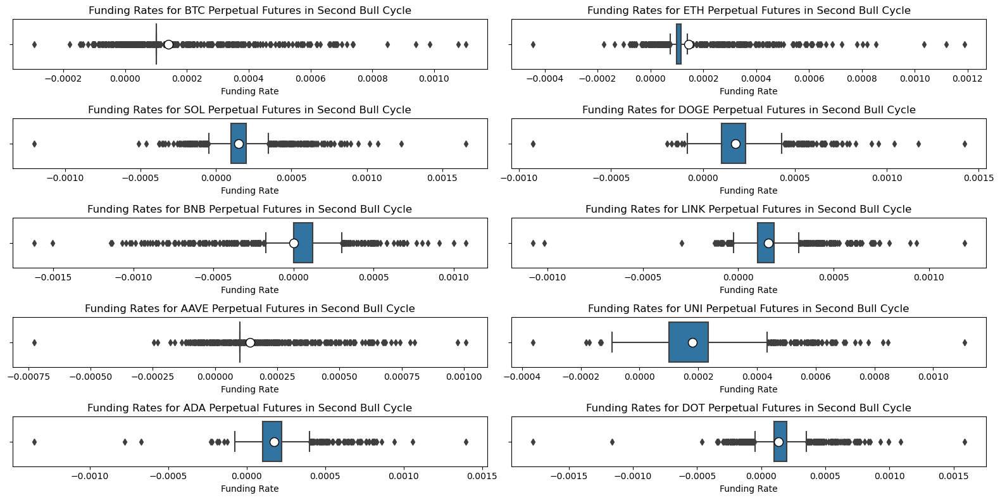

In [61]:
boxplot_funding_rate(second_bull_cycle_dict, "Second Bull")

#### General Observations:



# 4. Quantitative Analysis

#### 4.1 Correlation Matrix for the past 36 months of price return and funding rate

In [62]:
print(merged_dict_copy.keys())

dict_keys(['merged_btc', 'merged_eth', 'merged_sol', 'merged_doge', 'merged_bnb', 'merged_link', 'merged_aave', 'merged_uni', 'merged_ada', 'merged_dot'])


In [63]:
coin_corr_dict = {}

for i in merged_dict_copy.keys():
    coin_corr_dict[i.split('_')[1] + '_corr_matrix'] = merged_dict_copy[i].corr()

print(coin_corr_dict.keys())

dict_keys(['btc_corr_matrix', 'eth_corr_matrix', 'sol_corr_matrix', 'doge_corr_matrix', 'bnb_corr_matrix', 'link_corr_matrix', 'aave_corr_matrix', 'uni_corr_matrix', 'ada_corr_matrix', 'dot_corr_matrix'])


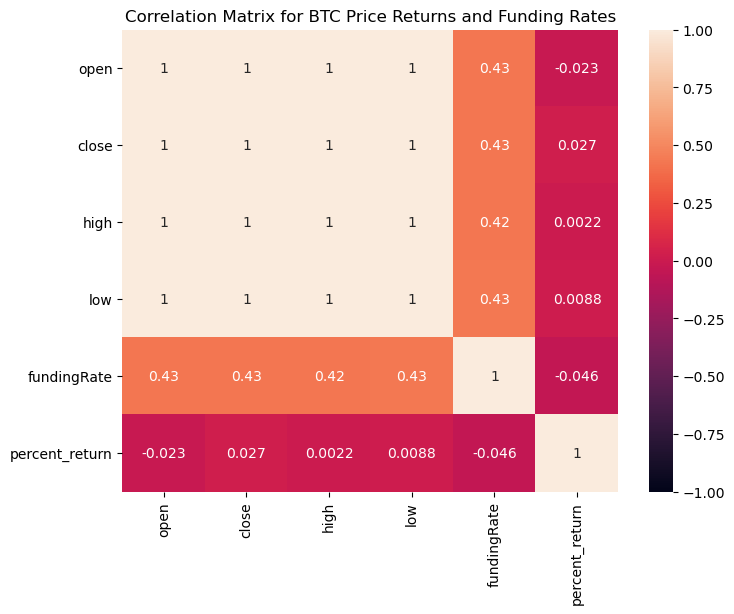

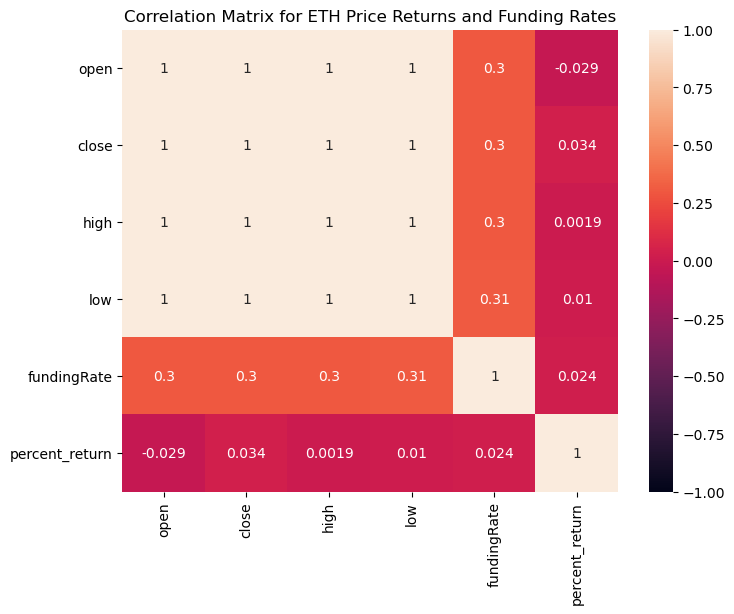

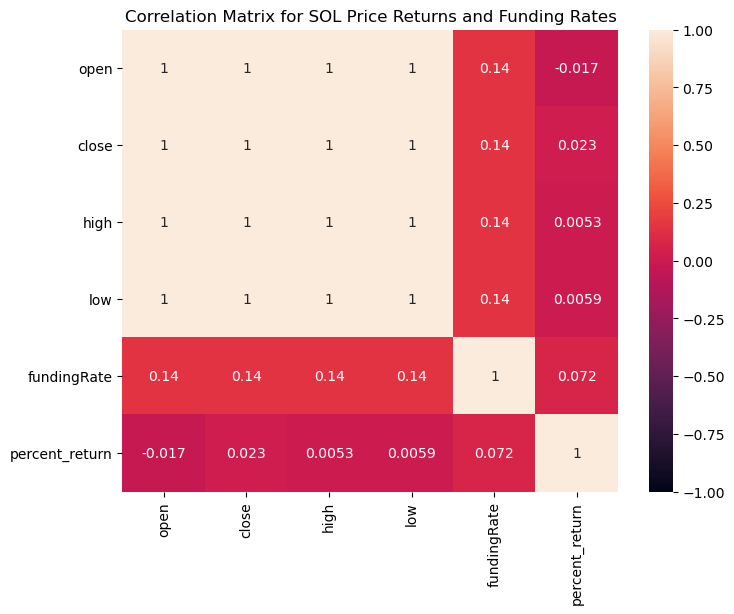

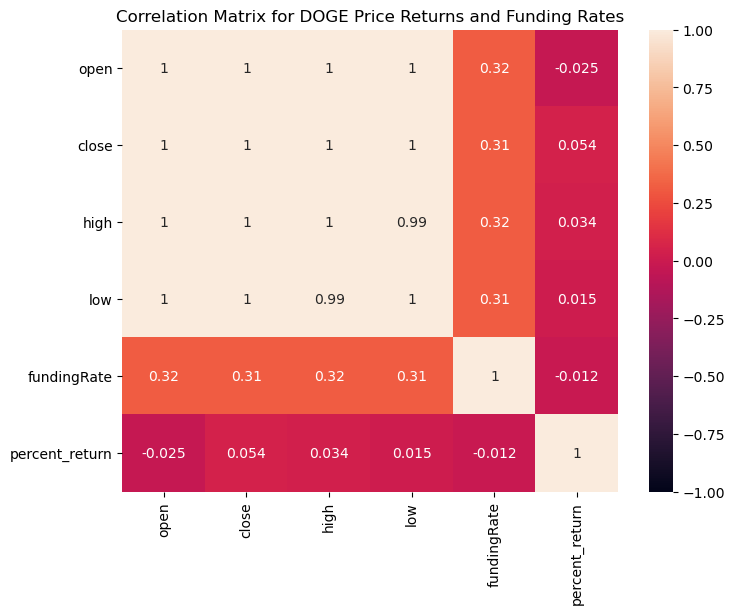

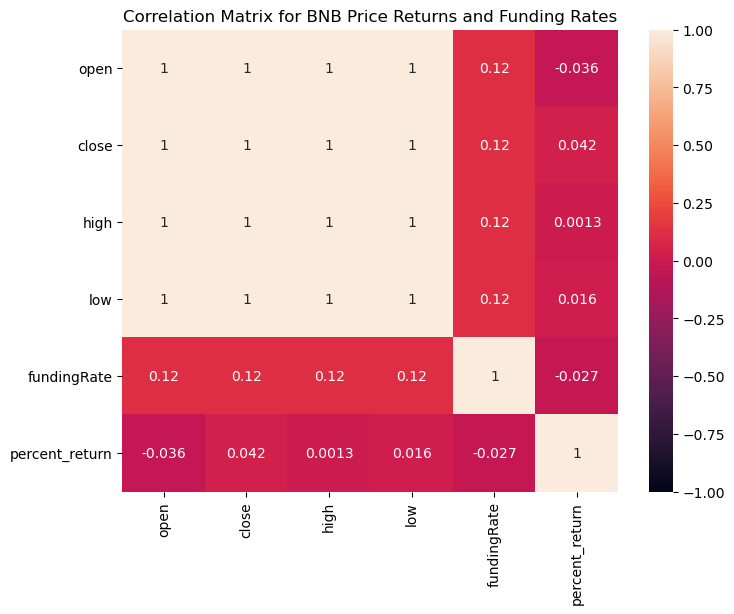

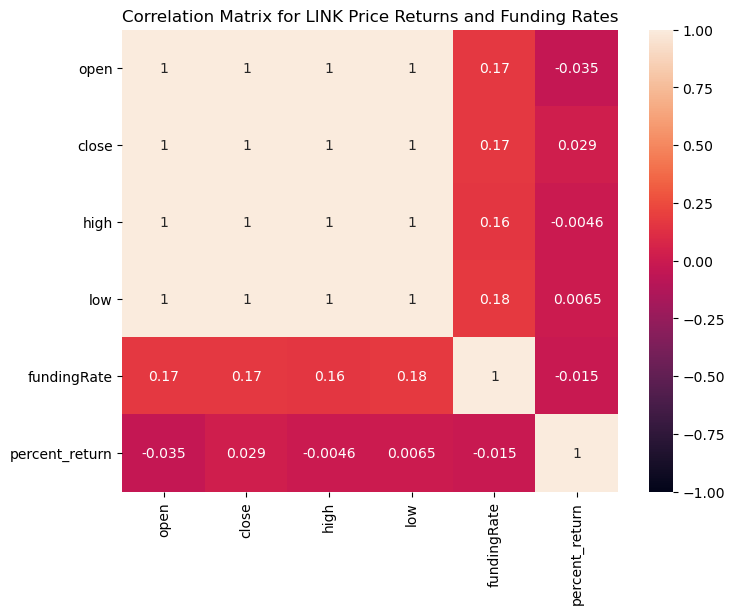

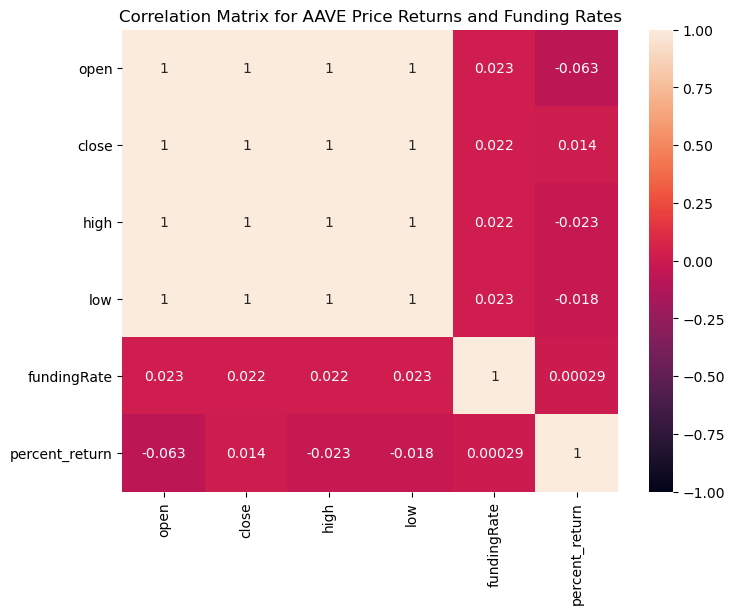

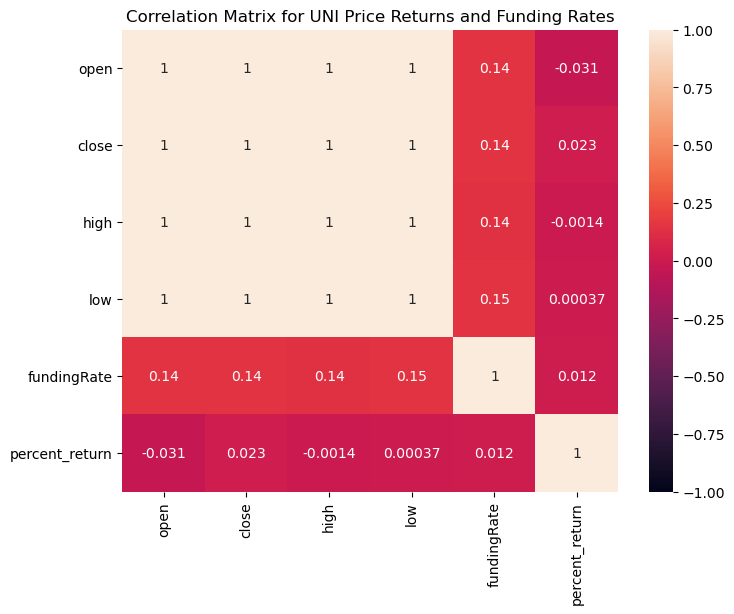

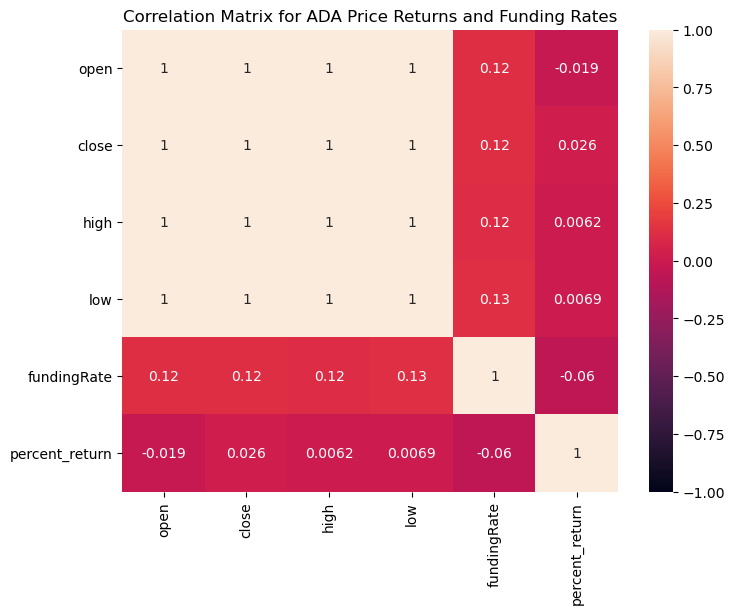

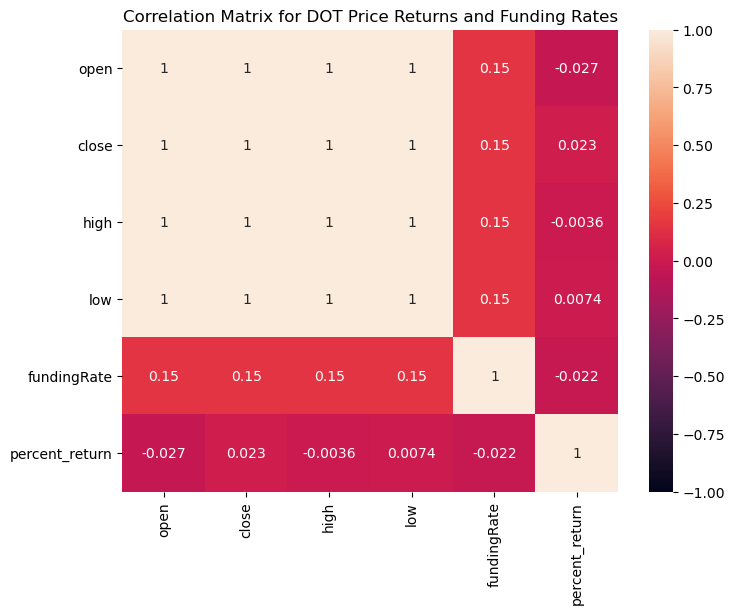

In [64]:
for i in coin_corr_dict.keys():

    # Plot the heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(coin_corr_dict[i], annot=True, vmin=-1, vmax=1)
    temp = i.split('_')[0].upper()
    plt.title(f'Correlation Matrix for {temp} Price Returns and Funding Rates')
    plt.show()

#### Observations:

asd

### 4.2 Correlation Matrix for Bear Market

In [65]:
print(bear_cycle_dict.keys())

dict_keys(['merged_btc', 'merged_eth', 'merged_sol', 'merged_doge', 'merged_bnb', 'merged_link', 'merged_aave', 'merged_uni', 'merged_ada', 'merged_dot'])


In [66]:
bear_cycle_corr_dict = {}

for i in bear_cycle_dict.keys():
    bear_cycle_corr_dict[i.split('_')[1] + '_bear_corr_matrix'] = bear_cycle_dict[i].corr()

print(bear_cycle_corr_dict.keys())

dict_keys(['btc_bear_corr_matrix', 'eth_bear_corr_matrix', 'sol_bear_corr_matrix', 'doge_bear_corr_matrix', 'bnb_bear_corr_matrix', 'link_bear_corr_matrix', 'aave_bear_corr_matrix', 'uni_bear_corr_matrix', 'ada_bear_corr_matrix', 'dot_bear_corr_matrix'])


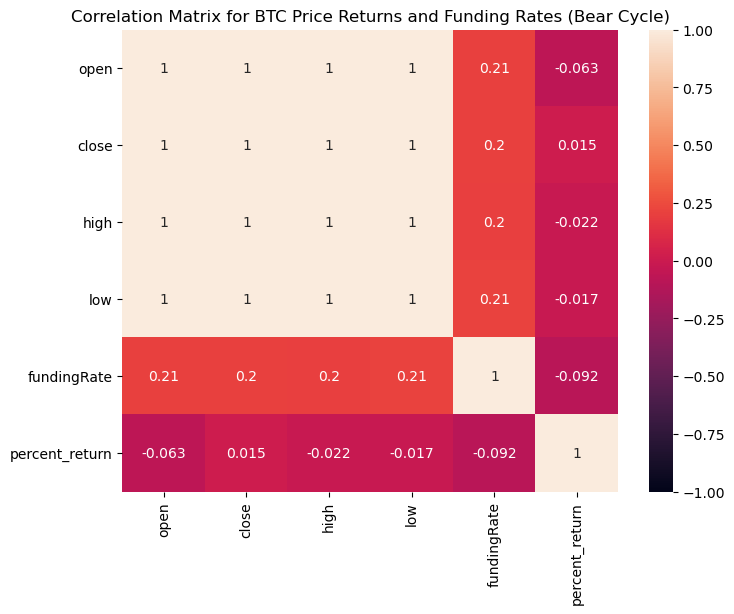

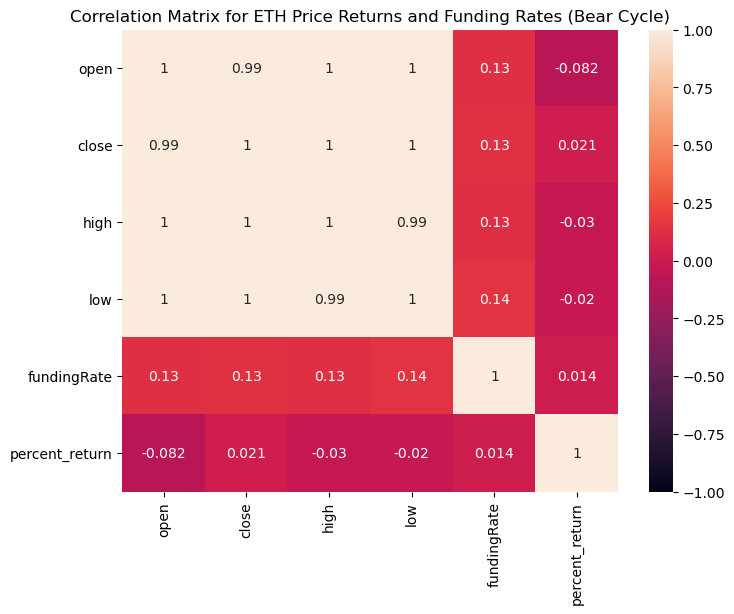

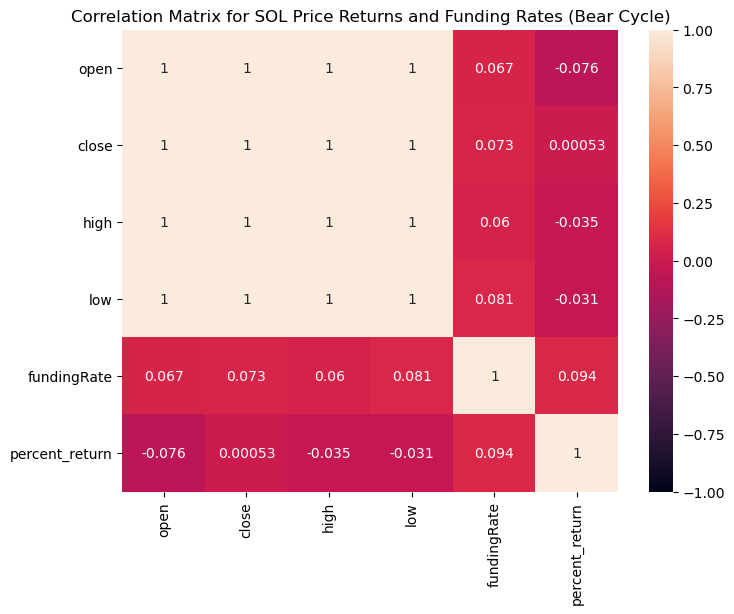

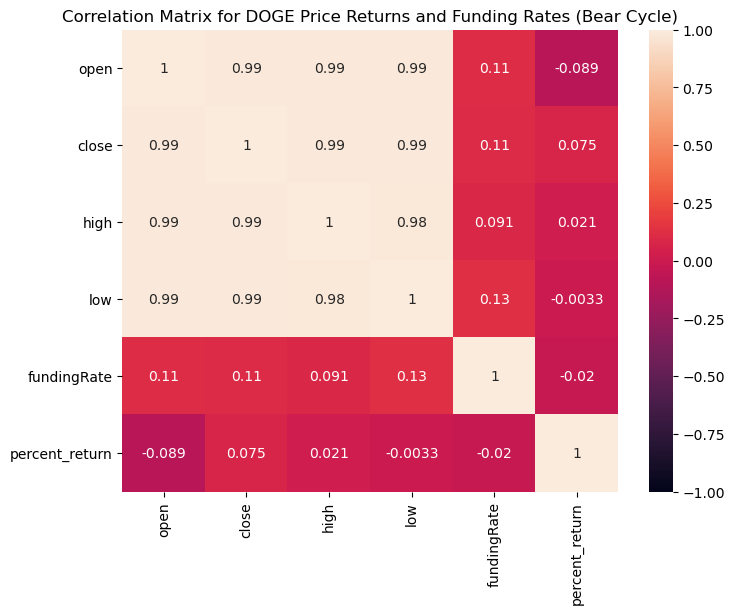

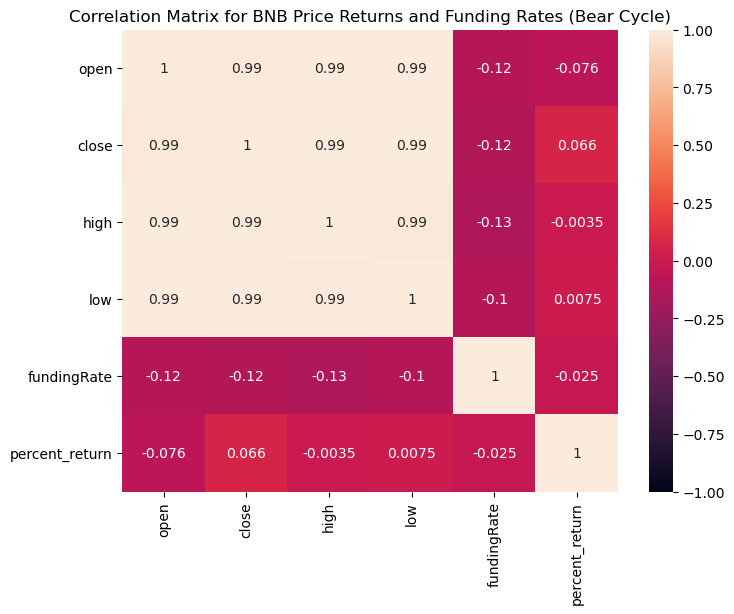

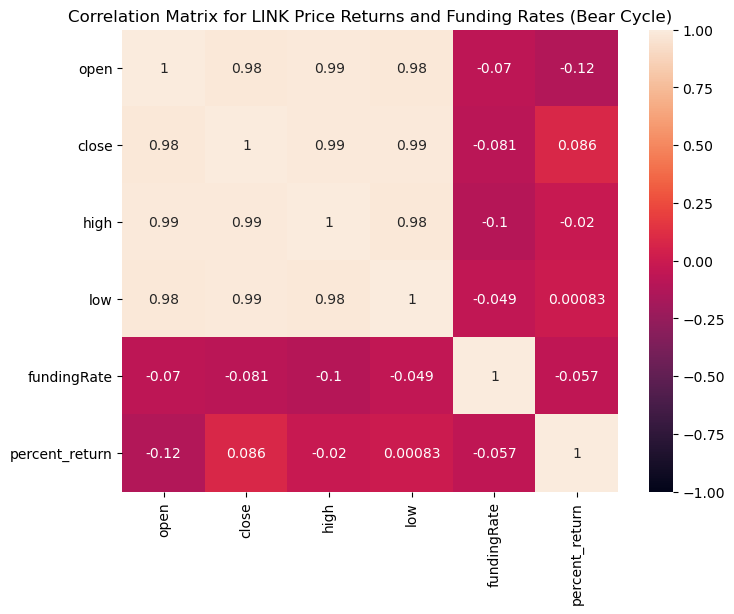

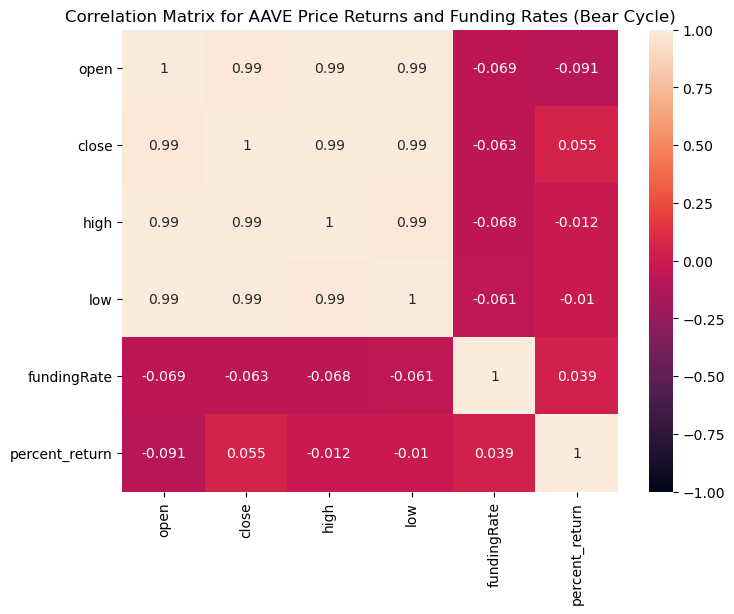

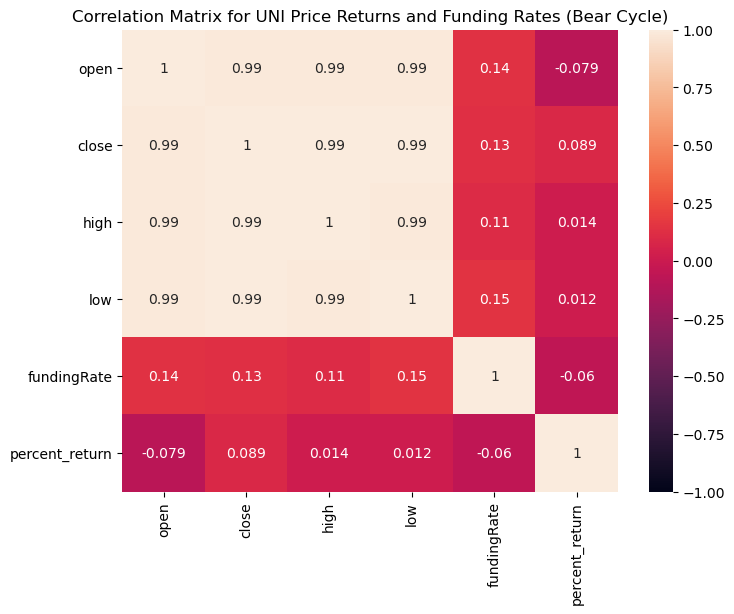

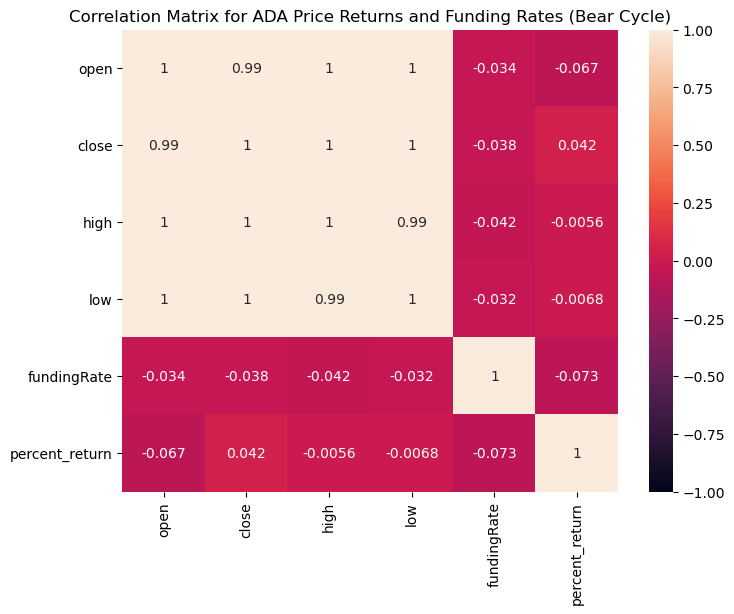

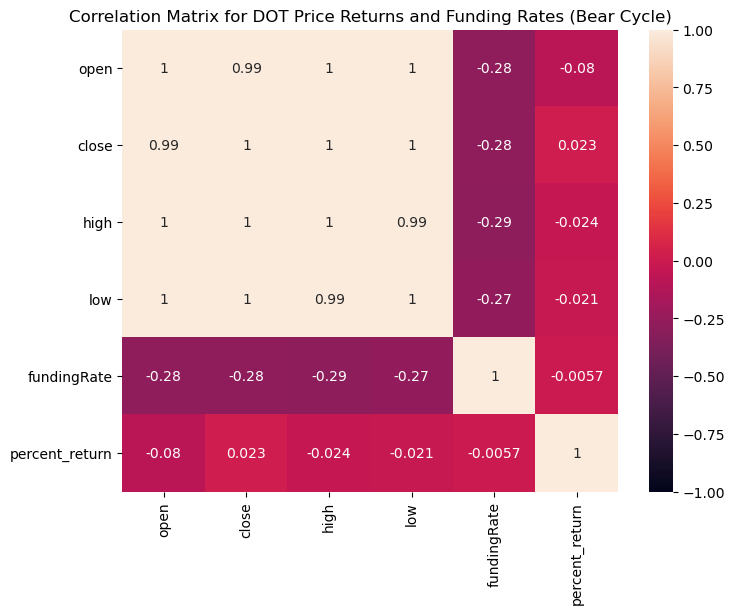

In [67]:
for i in bear_cycle_corr_dict.keys():

    # Plot the heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(bear_cycle_corr_dict[i], annot=True, vmin=-1, vmax=1)
    temp = i.split('_')[0].upper()
    plt.title(f'Correlation Matrix for {temp} Price Returns and Funding Rates (Bear Cycle)')
    plt.show()

### 4.3 Correlation Matrix for Current Bull Market

In [68]:
print(second_bull_cycle_dict.keys())

dict_keys(['merged_btc', 'merged_eth', 'merged_sol', 'merged_doge', 'merged_bnb', 'merged_link', 'merged_aave', 'merged_uni', 'merged_ada', 'merged_dot'])


In [69]:
second_bull_cycle_corr_dict = {}

for i in second_bull_cycle_dict.keys():
    second_bull_cycle_corr_dict[i.split('_')[1] + '_bear_corr_matrix'] = second_bull_cycle_dict[i].corr()

print(second_bull_cycle_corr_dict.keys())

dict_keys(['btc_bear_corr_matrix', 'eth_bear_corr_matrix', 'sol_bear_corr_matrix', 'doge_bear_corr_matrix', 'bnb_bear_corr_matrix', 'link_bear_corr_matrix', 'aave_bear_corr_matrix', 'uni_bear_corr_matrix', 'ada_bear_corr_matrix', 'dot_bear_corr_matrix'])


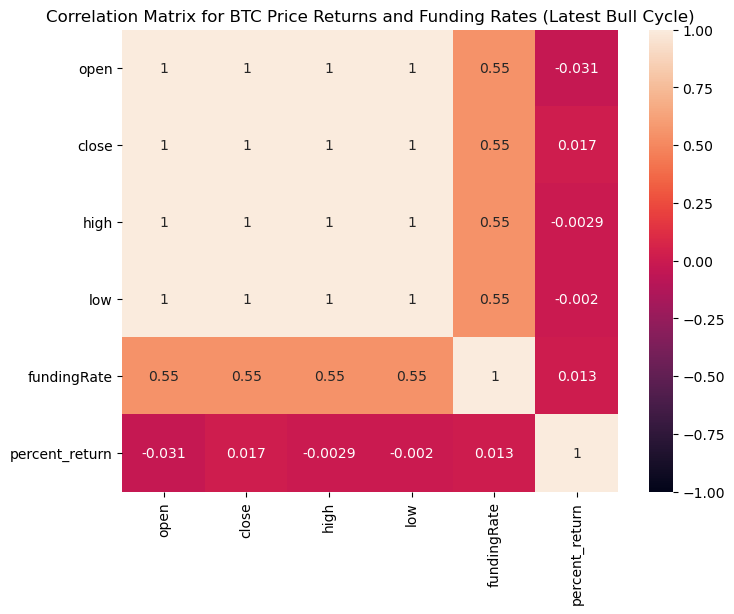

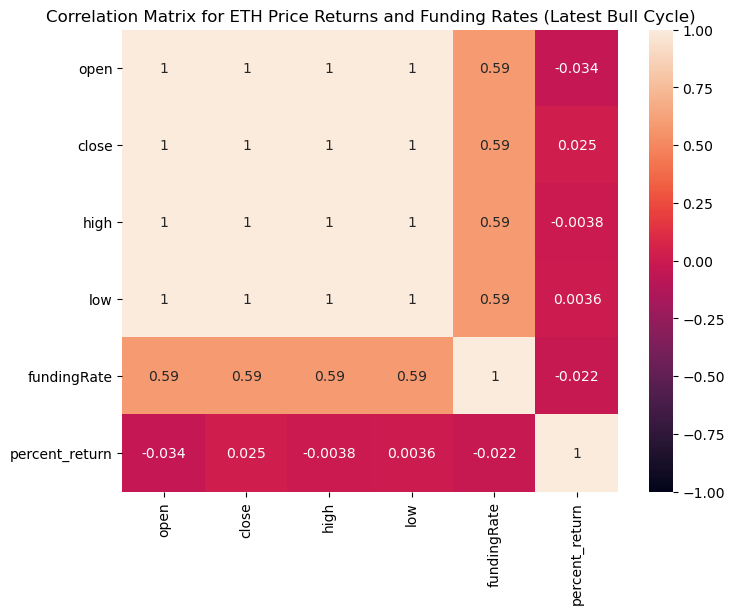

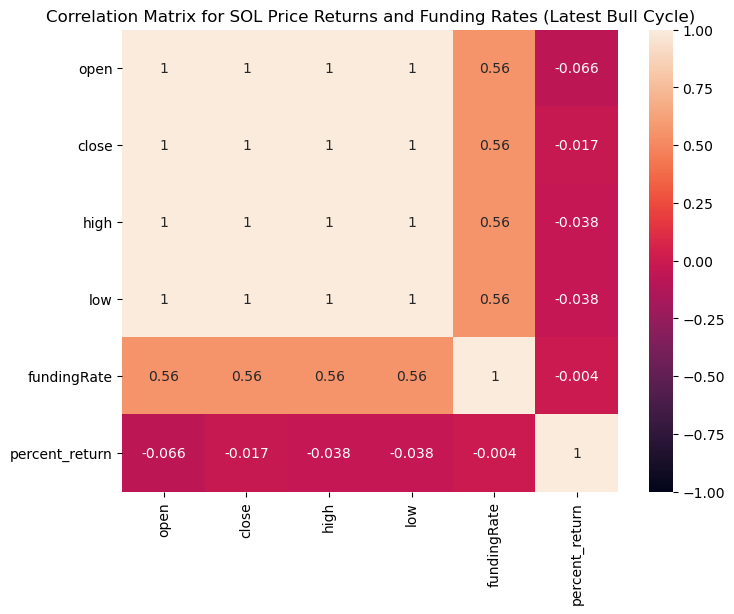

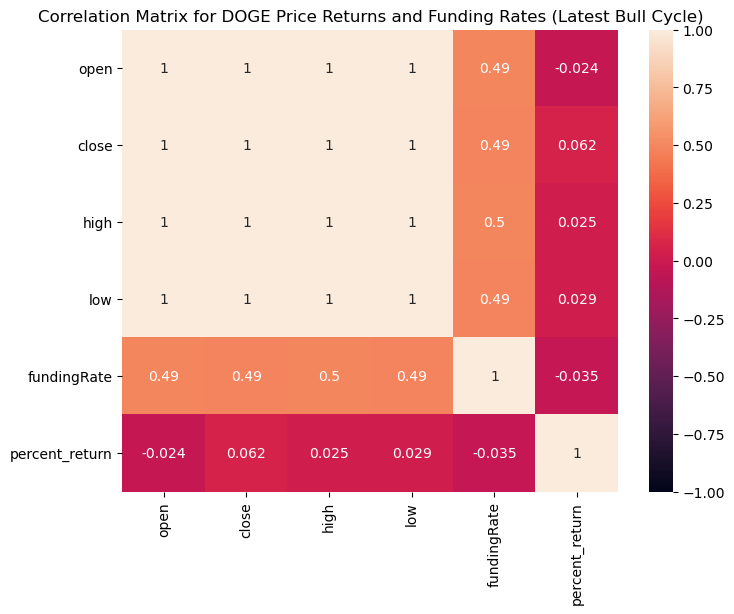

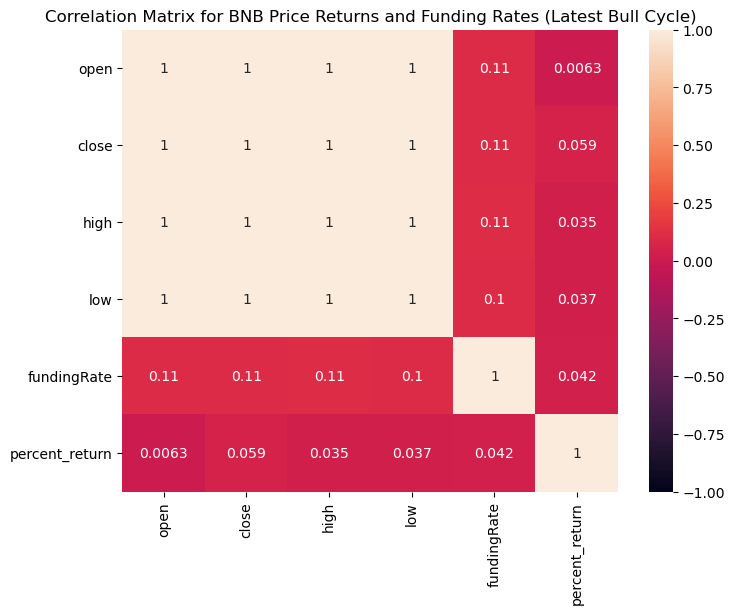

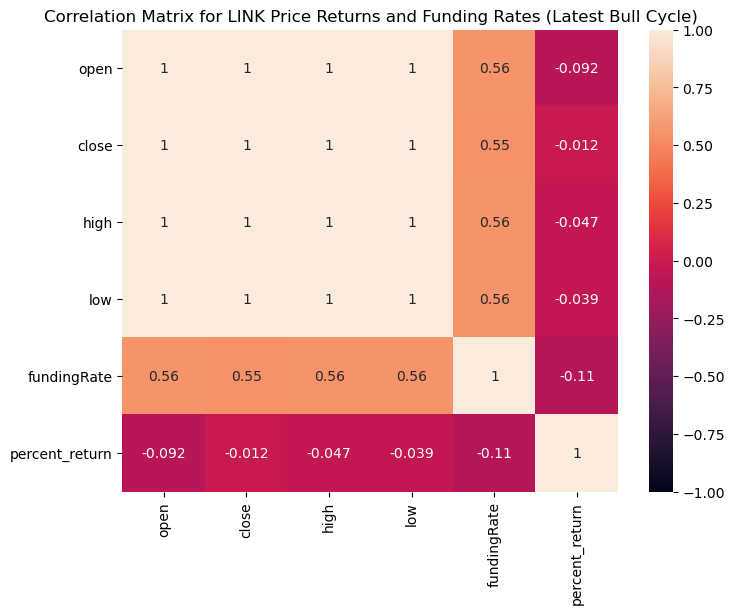

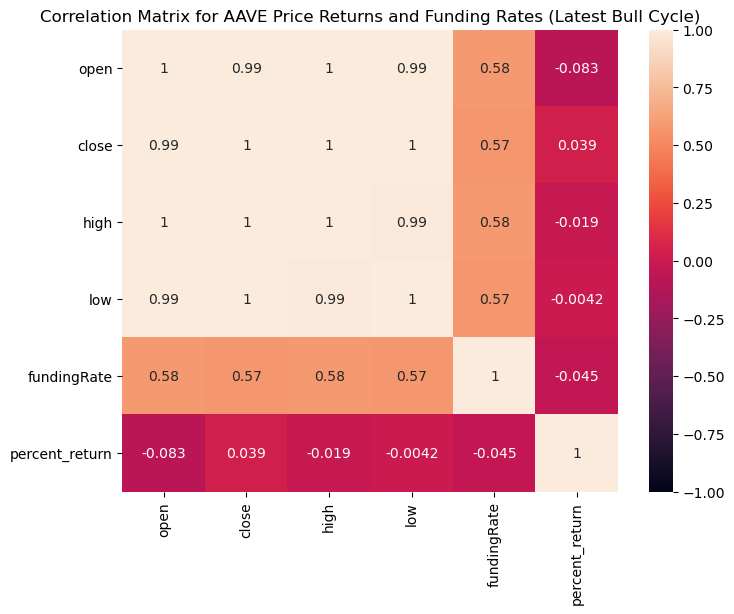

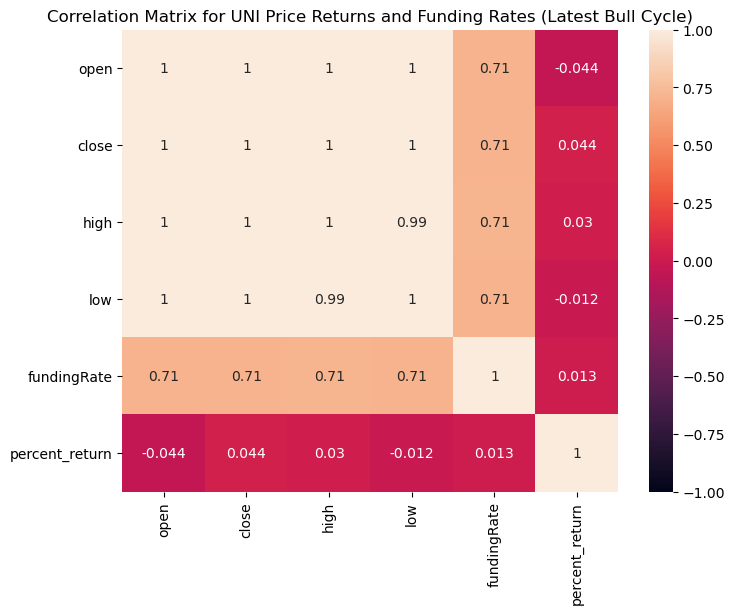

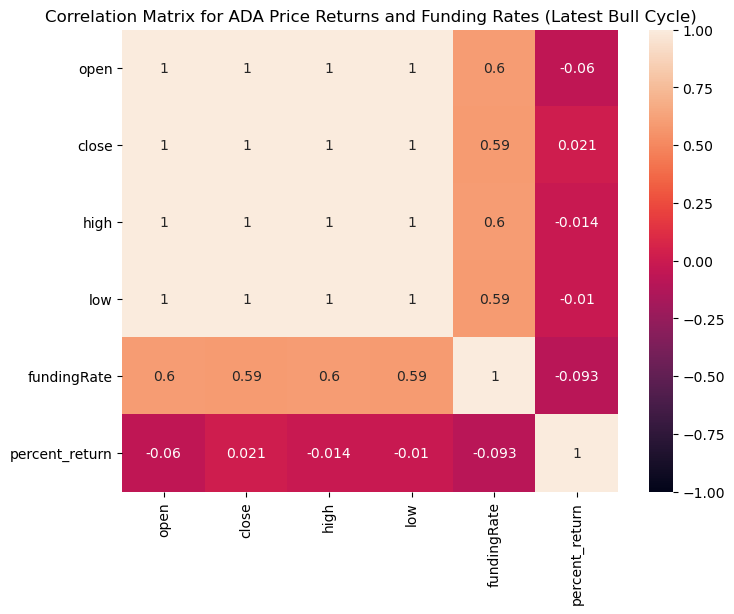

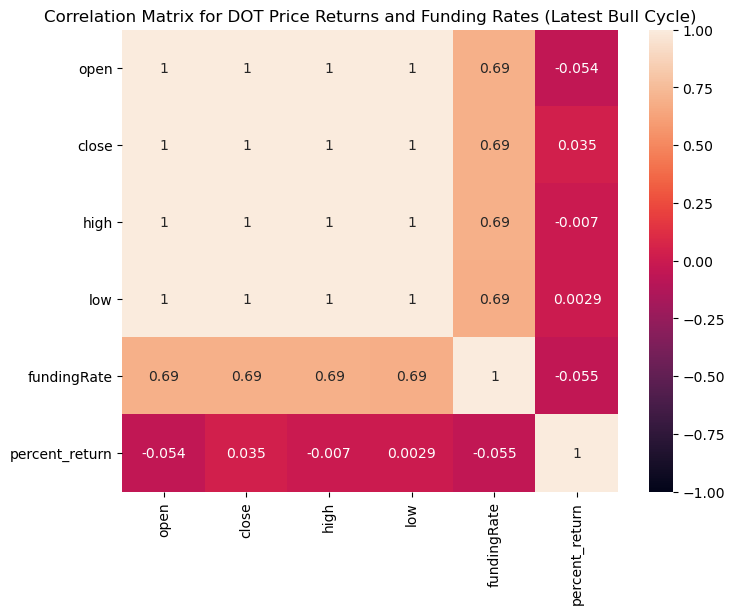

In [70]:
for i in second_bull_cycle_corr_dict.keys():

    # Plot the heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(second_bull_cycle_corr_dict[i], annot=True, vmin=-1, vmax=1)
    temp = i.split('_')[0].upper()
    plt.title(f'Correlation Matrix for {temp} Price Returns and Funding Rates (Latest Bull Cycle)')
    plt.show()

#### Observations:

asdf

### 4.4 Exploring time-lagged relationships

**shift_funding_time(data)**

The function of *shift_funding_time* was created to shift the fundingRate by X number of periods. The purpose of this is to determine in our subsequent analysis, whether the current fundingRate is a leading indicator for future spot prices.

It takes the following parameteres:
- data: merged_df consisting of spot price and funding rates (eg. btc_merged_df)

In *shift_funding_time*, taking into account that 1 period is 8 hours, I conduct the following operations:
1. Set *fundingTime* to be the index
2. Shift fundingRate by: 
- 1 period (8 hours)
- 2 periods (16 hours)
- 3 periods (24 hours)
- 6 periods (48 hours)
- 21 periods (1 week / 168 hours)

In [71]:
def shift_funding_time(data):
    """Compute the time lag between the price returns and funding rates."""

    data.set_index('fundingTime', inplace=True)

    data['lag_8h_fundingRate'] = data['fundingRate'].shift(1)   # Shift by 1 period (8 hours)
    data['lag_16h_fundingRate'] = data['fundingRate'].shift(2)  # Shift by 2 periods (16 hours)
    data['lag_24h_fundingRate'] = data['fundingRate'].shift(3)  # Shift by 3 periods (24 hours)
    data['lag_48h_fundingRate'] = data['fundingRate'].shift(6)  # Shift by 6 periods (48 hours)
    data['lag_1w_fundingRate'] = data['fundingRate'].shift(21)  # Shift by 21 periods (1 week / 168 hours)

    
    
    return data

In [72]:
for i in merged_dict_copy.keys():
    print('Computing time lag for', i)
    merged_dict_copy[i] = shift_funding_time(merged_dict_copy[i])

Computing time lag for merged_btc
Computing time lag for merged_eth
Computing time lag for merged_sol
Computing time lag for merged_doge
Computing time lag for merged_bnb
Computing time lag for merged_link
Computing time lag for merged_aave
Computing time lag for merged_uni
Computing time lag for merged_ada
Computing time lag for merged_dot


In [73]:
merged_dict_copy['merged_eth'].head()

,open,close,high,low,open_time,close_time,symbol,fundingRate,markPrice,percent_return,lag_8h_fundingRate,lag_16h_fundingRate,lag_24h_fundingRate,lag_48h_fundingRate,lag_1w_fundingRate
fundingTime,,,,,,,,,,,,,,,
2021-04-14 16:00:00.001,2374.10,2432.60,2447.29,2301.89,2021-04-14 17:00:00,2021-04-14 23:59:59.999,ETHUSD_PERP,0.000614,,2.464092,NaN,NaN,NaN,NaN,NaN
2021-04-15 00:00:00.011,2432.59,2469.10,2481.00,2400.00,2021-04-15 00:00:00,2021-04-15 07:59:59.999,ETHUSD_PERP,0.000943,,1.500869,0.000614,NaN,NaN,NaN,NaN
2021-04-15 08:00:00.002,2468.66,2461.49,2487.38,2405.08,2021-04-15 08:00:00,2021-04-15 15:59:59.999,ETHUSD_PERP,0.000916,,-0.290441,0.000943,0.000614,NaN,NaN,NaN
2021-04-15 16:00:00.000,2461.42,2514.04,2543.47,2433.44,2021-04-15 16:00:00,2021-04-15 23:59:59.999,ETHUSD_PERP,0.000443,,2.137790,0.000916,0.000943,0.000614,NaN,NaN
2021-04-16 00:00:00.006,2514.04,2426.59,2548.29,2367.10,2021-04-16 00:00:00,2021-04-16 07:59:59.999,ETHUSD_PERP,0.000628,,-3.478465,0.000443,0.000916,0.000943,NaN,NaN


In [74]:
merged_dict_copy['merged_sol'].head()

,open,close,high,low,open_time,close_time,symbol,fundingRate,markPrice,percent_return,lag_8h_fundingRate,lag_16h_fundingRate,lag_24h_fundingRate,lag_48h_fundingRate,lag_1w_fundingRate
fundingTime,,,,,,,,,,,,,,,
2021-09-02 08:00:00.007,114.47,121.88,123.50,114.08,2021-09-02 08:00:00,2021-09-02 15:59:59.999,SOLUSD_PERP,0.000764,,6.473312,NaN,NaN,NaN,NaN,NaN
2021-09-02 16:00:00.011,121.87,128.23,131.96,119.54,2021-09-02 16:00:00,2021-09-02 23:59:59.999,SOLUSD_PERP,0.000805,,5.218676,0.000764,NaN,NaN,NaN,NaN
2021-09-03 00:00:00.000,128.20,144.69,146.38,128.12,2021-09-03 00:00:00,2021-09-03 07:59:59.999,SOLUSD_PERP,0.000663,,12.862715,0.000805,0.000764,NaN,NaN,NaN
2021-09-03 08:00:00.008,144.67,140.02,145.19,135.54,2021-09-03 08:00:00,2021-09-03 15:59:59.999,SOLUSD_PERP,0.000588,,-3.214212,0.000663,0.000805,0.000764,NaN,NaN
2021-09-03 16:00:00.000,140.02,146.40,148.99,138.13,2021-09-03 16:00:00,2021-09-03 23:59:59.999,SOLUSD_PERP,0.000100,,4.556492,0.000588,0.000663,0.000805,NaN,NaN


In [75]:
for k, df in merged_dict_copy.items():
    print('Checking NaN and Null values for', k)
    print(df.isna().sum())
    print()

Checking NaN and Null values for merged_btc
open                    0
close                   0
high                    0
low                     0
open_time               0
close_time              0
symbol                  0
fundingRate             0
markPrice               0
percent_return          0
lag_8h_fundingRate      1
lag_16h_fundingRate     2
lag_24h_fundingRate     3
lag_48h_fundingRate     6
lag_1w_fundingRate     21
dtype: int64

Checking NaN and Null values for merged_eth
open                    0
close                   0
high                    0
low                     0
open_time               0
close_time              0
symbol                  0
fundingRate             0
markPrice               0
percent_return          0
lag_8h_fundingRate      1
lag_16h_fundingRate     2
lag_24h_fundingRate     3
lag_48h_fundingRate     6
lag_1w_fundingRate     21
dtype: int64

Checking NaN and Null values for merged_sol
open                    0
close                   0
high    

In [76]:
# Drop NaN
for k, df in merged_dict_copy.items():
    print(k, df.shape)
    print('===== Dropping =====')
    df.dropna(subset=['lag_8h_fundingRate', 'lag_16h_fundingRate', 
                        'lag_24h_fundingRate', 'lag_48h_fundingRate', 
                        'lag_1w_fundingRate'], inplace=True)
    print(df.shape)
    print('=' * 20)

merged_btc (3289, 15)
===== Dropping =====
(3268, 15)
merged_eth (3289, 15)
===== Dropping =====
(3268, 15)
merged_sol (2867, 15)
===== Dropping =====
(2846, 15)
merged_doge (3289, 15)
===== Dropping =====
(3268, 15)
merged_bnb (3289, 15)
===== Dropping =====
(3268, 15)
merged_link (3289, 15)
===== Dropping =====
(3268, 15)
merged_aave (2516, 15)
===== Dropping =====
(2495, 15)
merged_uni (3289, 15)
===== Dropping =====
(3268, 15)
merged_ada (3289, 15)
===== Dropping =====
(3268, 15)
merged_dot (3289, 15)
===== Dropping =====
(3268, 15)


### 4.5 Correlation Matrix for the last 36 months

In [77]:
lagged_coin_corr_dict = {}

for i in merged_dict_copy.keys():
    lagged_corr = merged_dict_copy[i][['percent_return', 'lag_8h_fundingRate', 'lag_16h_fundingRate', 'lag_24h_fundingRate', 'lag_48h_fundingRate', 'lag_1w_fundingRate']].corr()
    lagged_coin_corr_dict[i.split('_')[1] + '_corr_matrix_lagged'] = lagged_corr

print(lagged_coin_corr_dict.keys())

dict_keys(['btc_corr_matrix_lagged', 'eth_corr_matrix_lagged', 'sol_corr_matrix_lagged', 'doge_corr_matrix_lagged', 'bnb_corr_matrix_lagged', 'link_corr_matrix_lagged', 'aave_corr_matrix_lagged', 'uni_corr_matrix_lagged', 'ada_corr_matrix_lagged', 'dot_corr_matrix_lagged'])


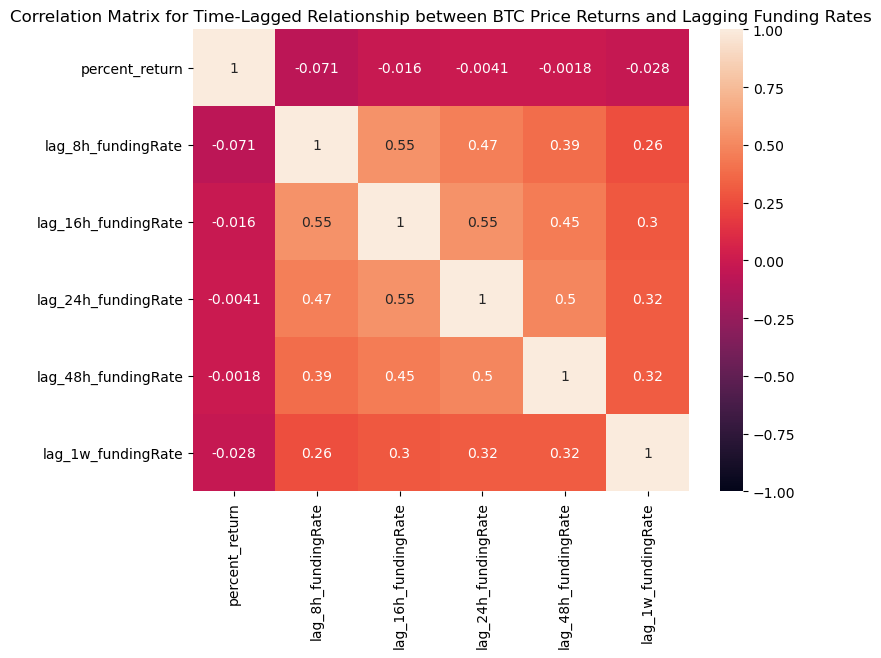

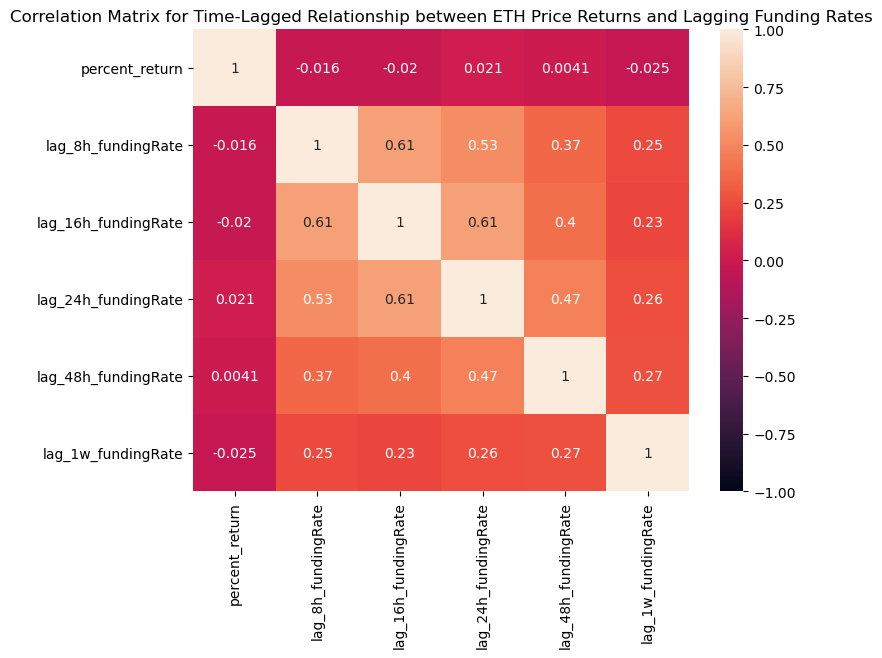

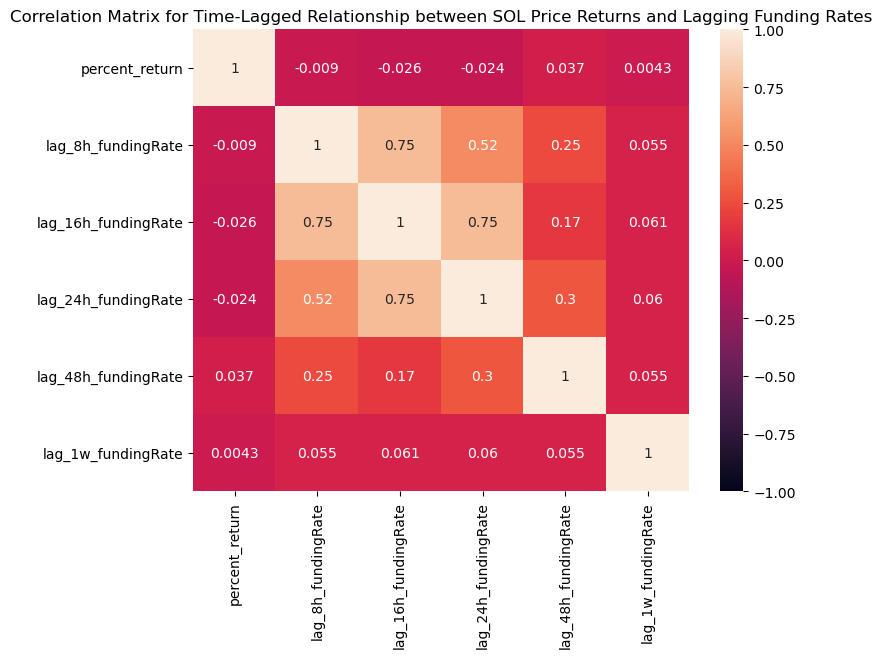

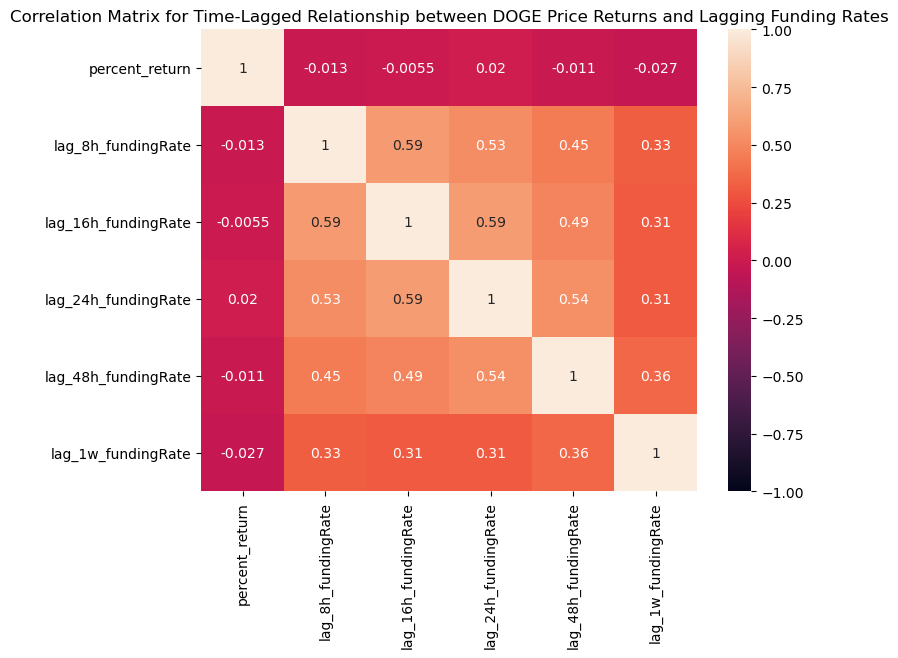

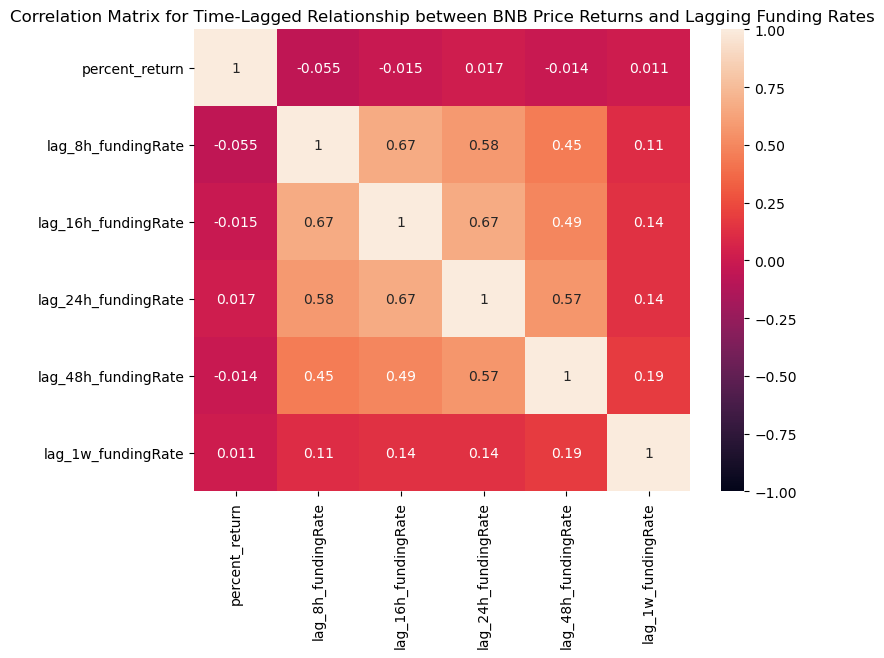

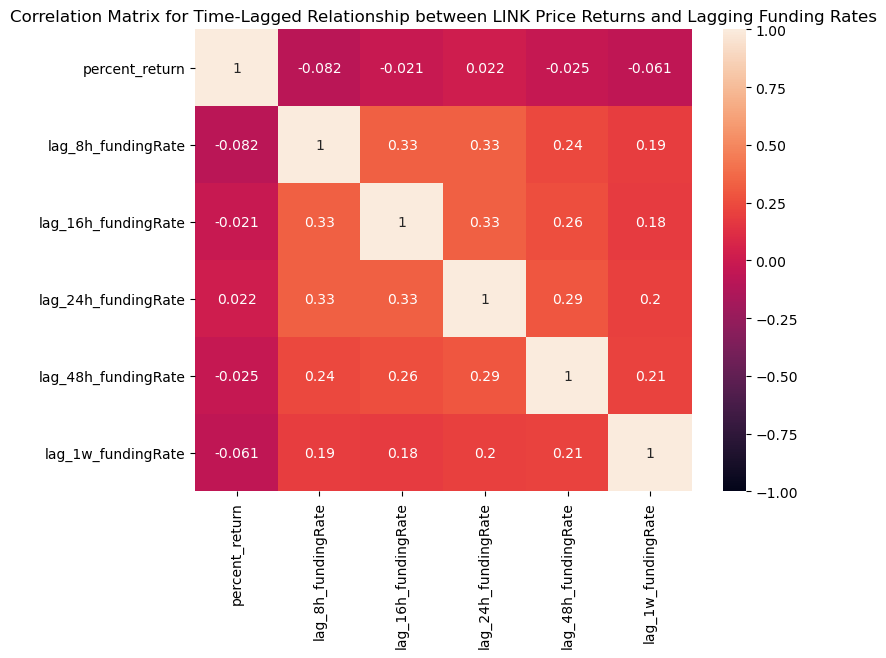

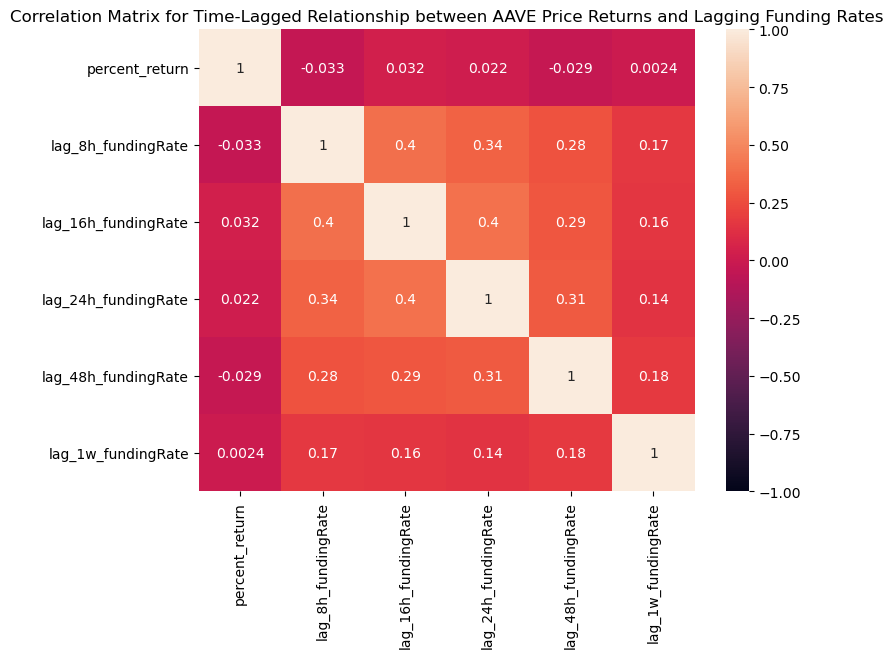

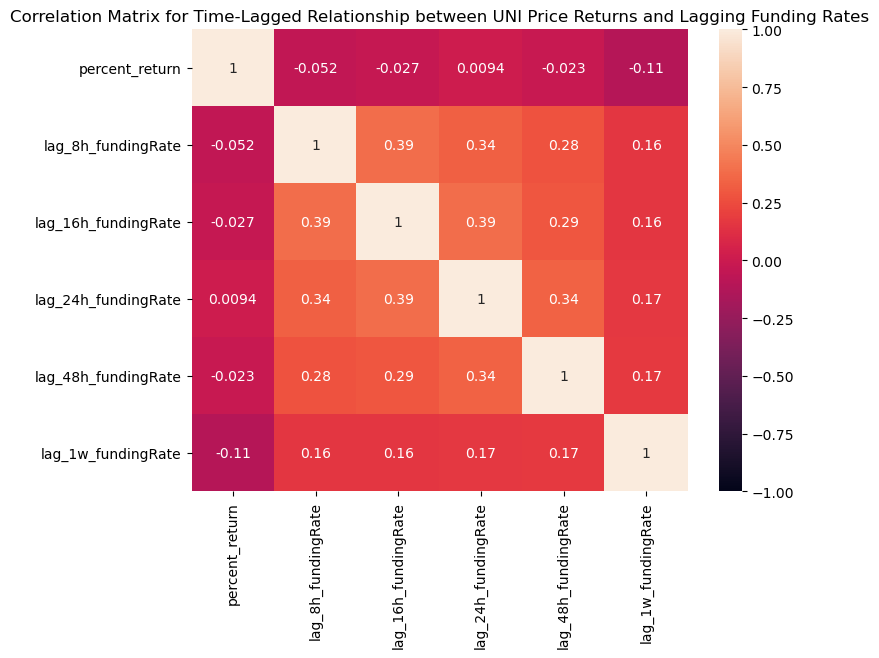

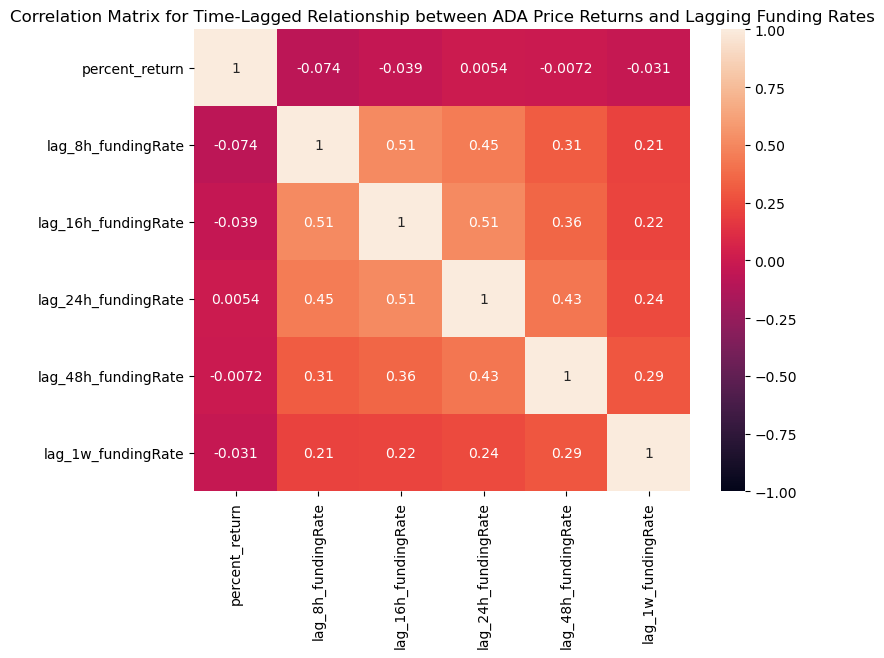

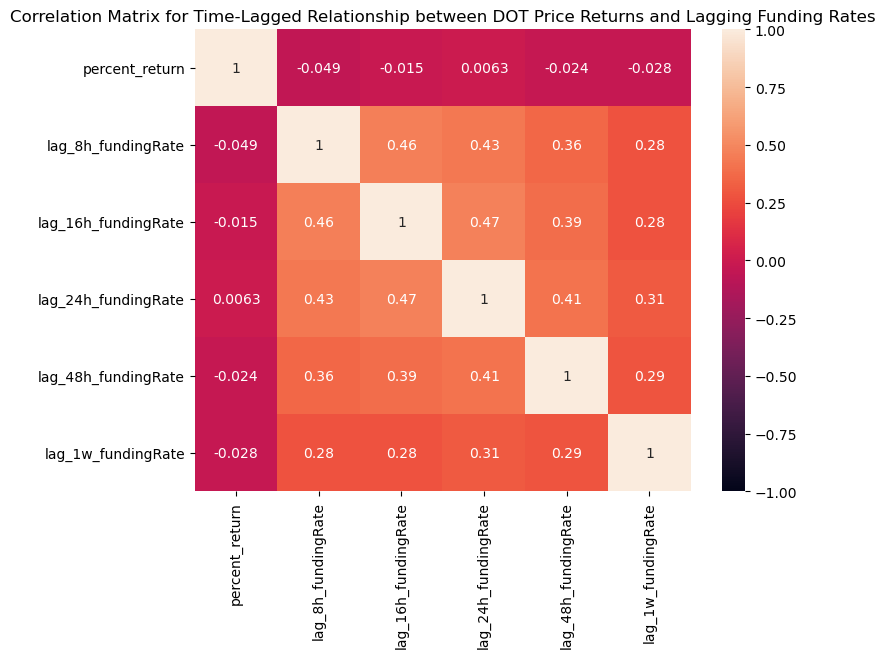

In [78]:
for i in lagged_coin_corr_dict.keys():
    # Plot the heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(lagged_coin_corr_dict[i], annot=True, vmin=-1, vmax=1)
    temp = i.split('_')[0].upper()
    plt.title(f'Correlation Matrix for Time-Lagged Relationship between {temp} Price Returns and Lagging Funding Rates')
    plt.show()

### 4.6 Correlation Matrix for Bear Market

In [79]:
for i in bear_cycle_dict.keys():
    print('Computing time lag for', i)
    bear_cycle_dict[i] = shift_funding_time(bear_cycle_dict[i])

Computing time lag for merged_btc
Computing time lag for merged_eth
Computing time lag for merged_sol
Computing time lag for merged_doge
Computing time lag for merged_bnb
Computing time lag for merged_link
Computing time lag for merged_aave
Computing time lag for merged_uni
Computing time lag for merged_ada
Computing time lag for merged_dot


In [80]:
bear_cycle_dict_copy = bear_cycle_dict.copy()

In [81]:
bear_cycle_dict_copy['merged_uni'].head()

,open,close,high,low,open_time,close_time,symbol,fundingRate,markPrice,percent_return,lag_8h_fundingRate,lag_16h_fundingRate,lag_24h_fundingRate,lag_48h_fundingRate,lag_1w_fundingRate
fundingTime,,,,,,,,,,,,,,,
2022-05-01 00:00:00.000,6.76,6.85,6.96,6.53,2022-05-01 00:00:00,2022-05-01 07:59:59.999,UNIUSD_PERP,-0.000523,,1.331361,NaN,NaN,NaN,NaN,NaN
2022-05-01 08:00:00.009,6.86,7.18,7.24,6.86,2022-05-01 08:00:00,2022-05-01 15:59:59.999,UNIUSD_PERP,-0.000489,,4.664723,-0.000523,NaN,NaN,NaN,NaN
2022-05-01 16:00:00.006,7.19,7.12,7.23,6.83,2022-05-01 16:00:00,2022-05-01 23:59:59.999,UNIUSD_PERP,-0.000317,,-0.973574,-0.000489,-0.000523,NaN,NaN,NaN
2022-05-02 00:00:00.000,7.12,6.99,7.20,6.97,2022-05-02 00:00:00,2022-05-02 07:59:59.999,UNIUSD_PERP,-0.000376,,-1.825843,-0.000317,-0.000489,-0.000523,NaN,NaN
2022-05-02 08:00:00.001,6.99,6.93,7.01,6.69,2022-05-02 08:00:00,2022-05-02 15:59:59.999,UNIUSD_PERP,0.000029,,-0.858369,-0.000376,-0.000317,-0.000489,NaN,NaN


In [82]:
for k, df in bear_cycle_dict_copy.items():
    print('Checking NaN and Null values for', k)
    print(df.isna().sum())
    print()

Checking NaN and Null values for merged_btc
open                    0
close                   0
high                    0
low                     0
open_time               0
close_time              0
symbol                  0
fundingRate             0
markPrice               0
percent_return          0
lag_8h_fundingRate      1
lag_16h_fundingRate     2
lag_24h_fundingRate     3
lag_48h_fundingRate     6
lag_1w_fundingRate     21
dtype: int64

Checking NaN and Null values for merged_eth
open                    0
close                   0
high                    0
low                     0
open_time               0
close_time              0
symbol                  0
fundingRate             0
markPrice               0
percent_return          0
lag_8h_fundingRate      1
lag_16h_fundingRate     2
lag_24h_fundingRate     3
lag_48h_fundingRate     6
lag_1w_fundingRate     21
dtype: int64

Checking NaN and Null values for merged_sol
open                    0
close                   0
high    

In [83]:
# Drop NaN
for k, df in bear_cycle_dict_copy.items():
    print(k, df.shape)
    print('===== Dropping =====')
    df.dropna(subset=['lag_8h_fundingRate', 'lag_16h_fundingRate', 
                        'lag_24h_fundingRate', 'lag_48h_fundingRate', 
                        'lag_1w_fundingRate'], inplace=True)
    print(df.shape)
    print('=' * 20)

merged_btc (1464, 15)
===== Dropping =====
(1443, 15)
merged_eth (1464, 15)
===== Dropping =====
(1443, 15)
merged_sol (1464, 15)
===== Dropping =====
(1443, 15)
merged_doge (1464, 15)
===== Dropping =====
(1443, 15)
merged_bnb (1464, 15)
===== Dropping =====
(1443, 15)
merged_link (1464, 15)
===== Dropping =====
(1443, 15)
merged_aave (1464, 15)
===== Dropping =====
(1443, 15)
merged_uni (1464, 15)
===== Dropping =====
(1443, 15)
merged_ada (1464, 15)
===== Dropping =====
(1443, 15)
merged_dot (1464, 15)
===== Dropping =====
(1443, 15)


In [84]:
bear_lagged_coin_corr_dict = {}

for i in bear_cycle_dict_copy.keys():
    bear_lagged_corr = bear_cycle_dict_copy[i][['percent_return', 'lag_8h_fundingRate', 'lag_16h_fundingRate', 'lag_24h_fundingRate', 'lag_48h_fundingRate', 'lag_1w_fundingRate']].corr()
    bear_lagged_coin_corr_dict[i.split('_')[1] + '_corr_matrix_lagged'] = bear_lagged_corr

print(bear_lagged_coin_corr_dict.keys())

dict_keys(['btc_corr_matrix_lagged', 'eth_corr_matrix_lagged', 'sol_corr_matrix_lagged', 'doge_corr_matrix_lagged', 'bnb_corr_matrix_lagged', 'link_corr_matrix_lagged', 'aave_corr_matrix_lagged', 'uni_corr_matrix_lagged', 'ada_corr_matrix_lagged', 'dot_corr_matrix_lagged'])


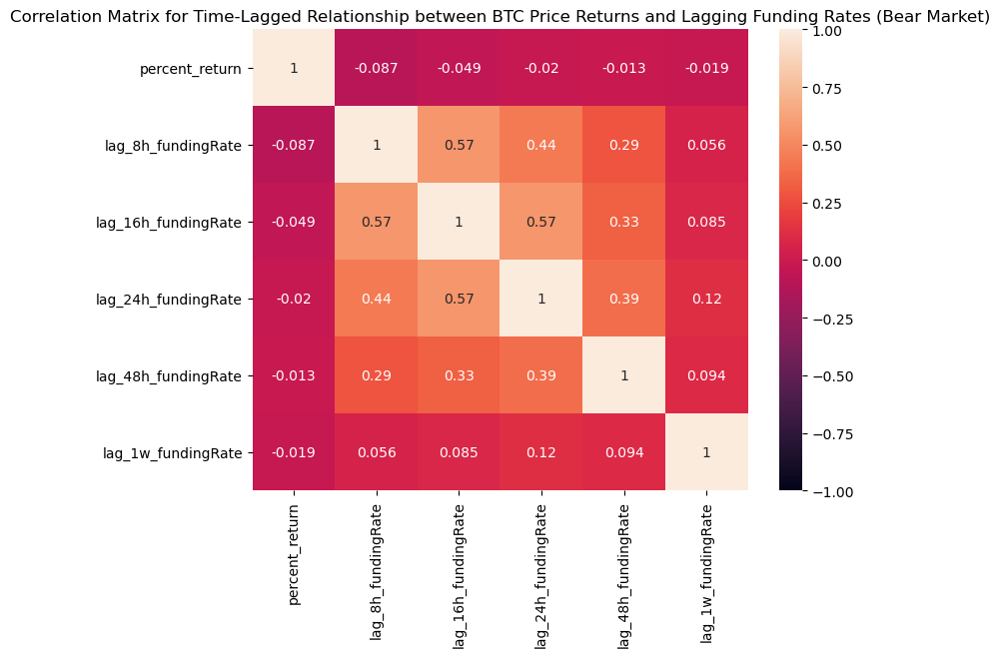

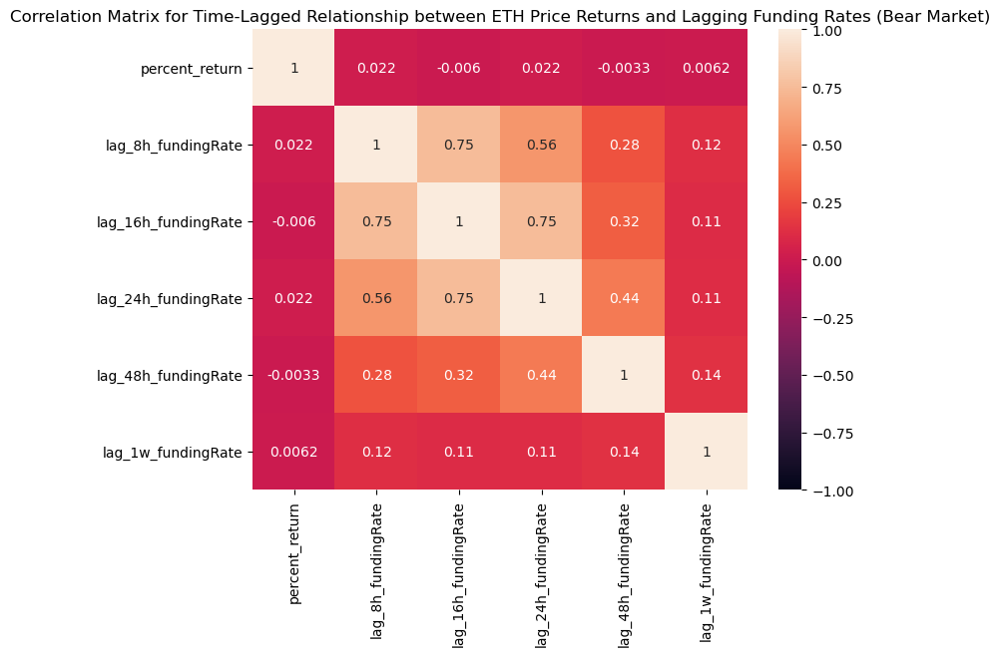

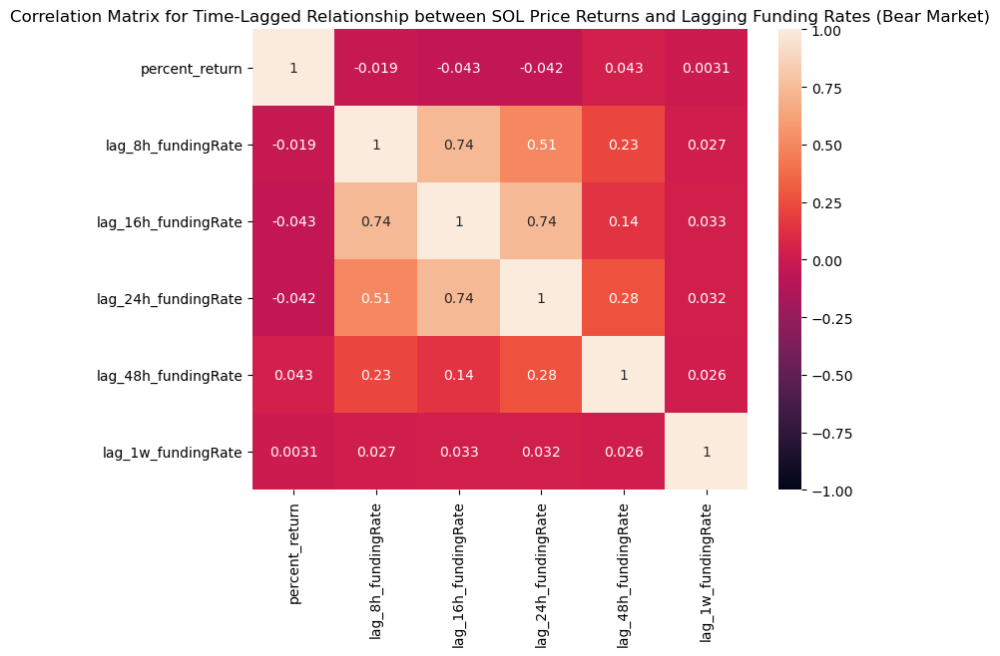

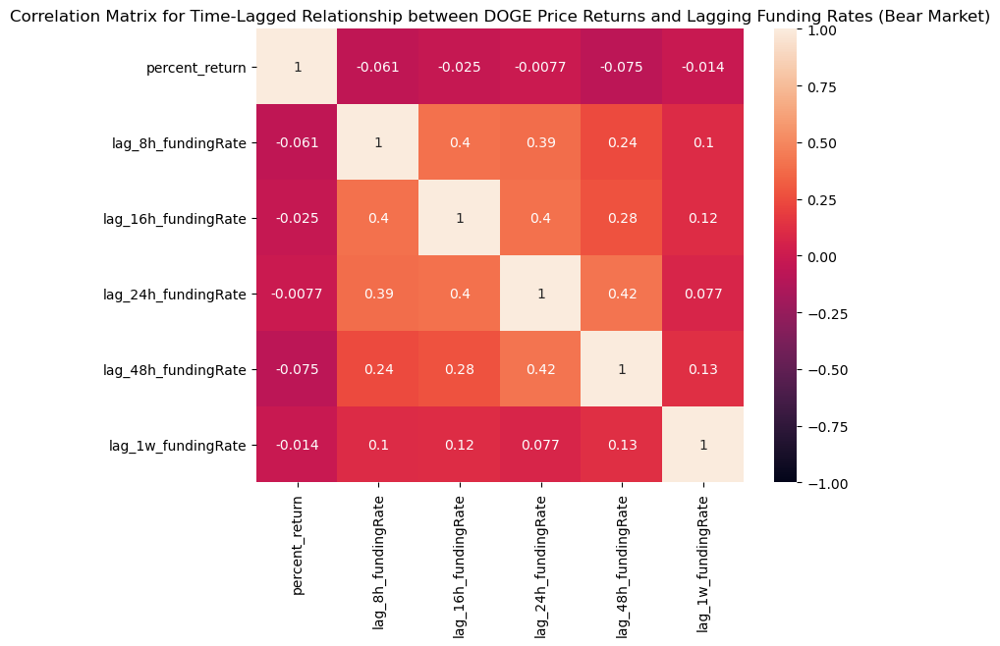

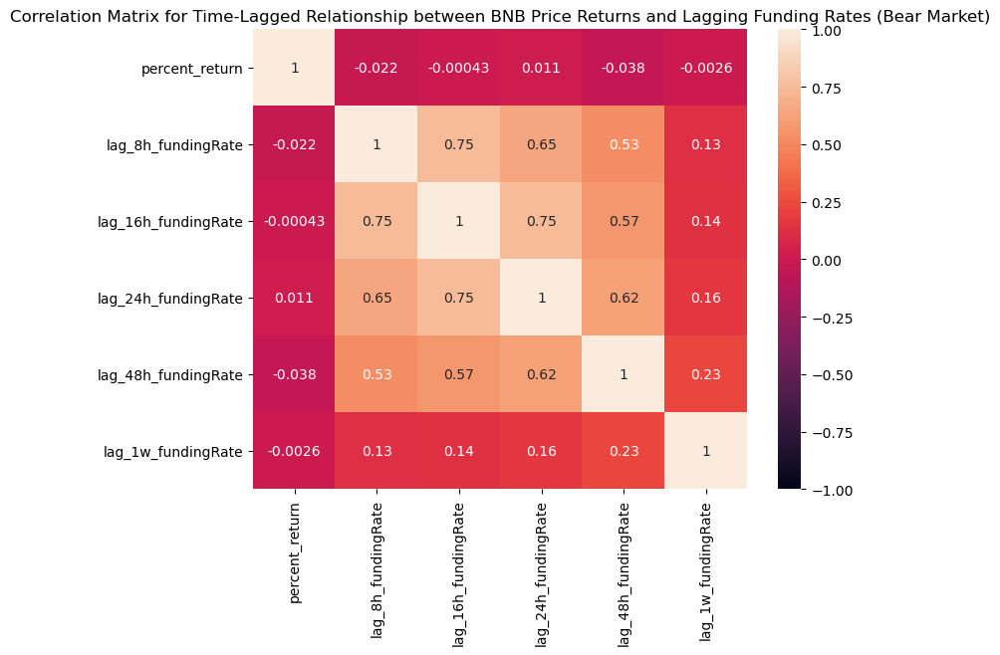

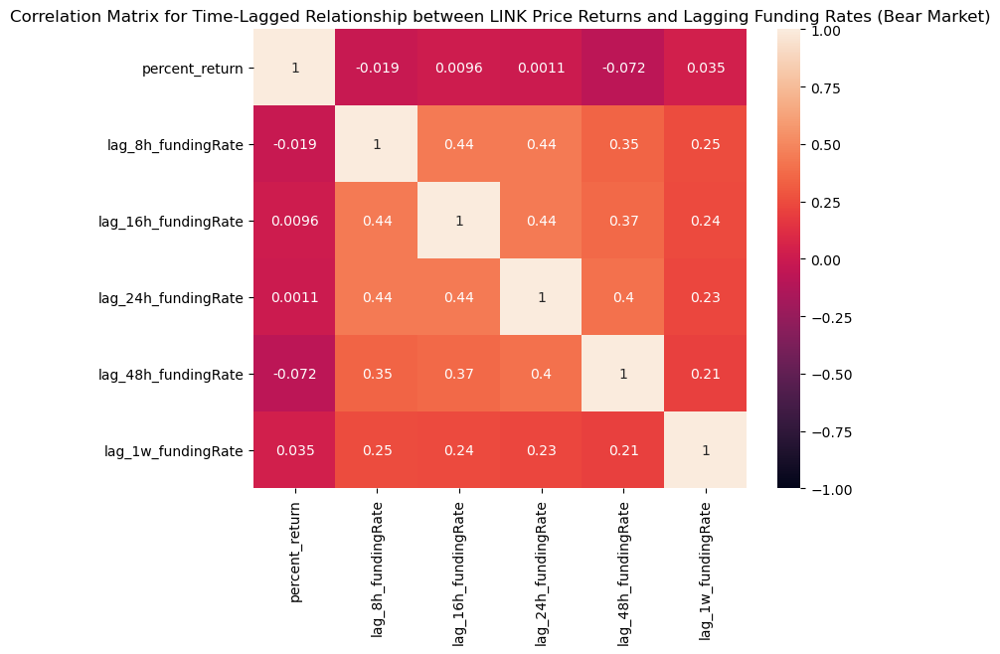

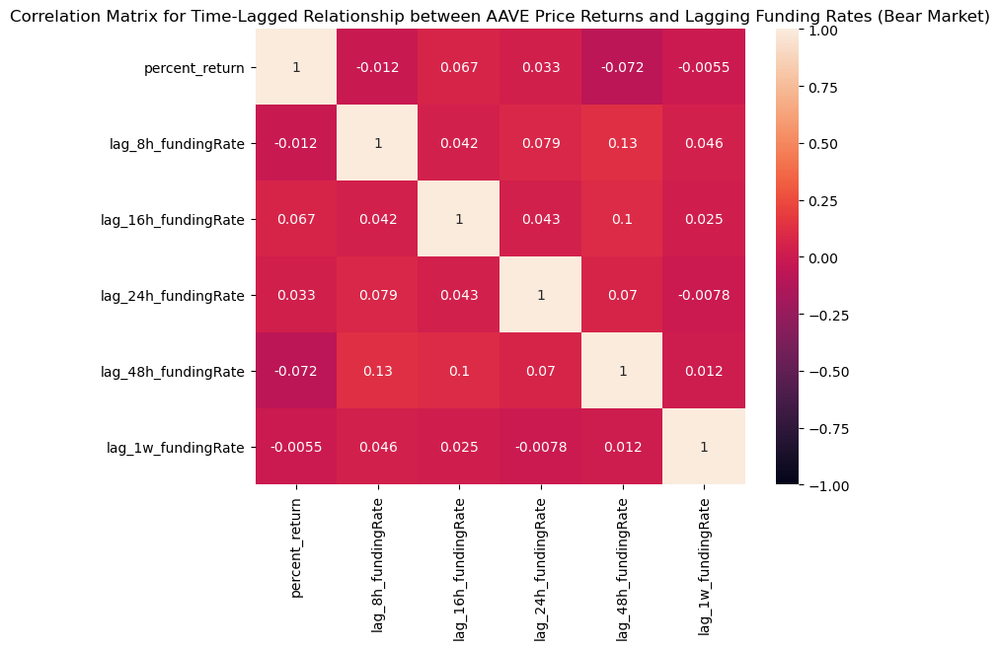

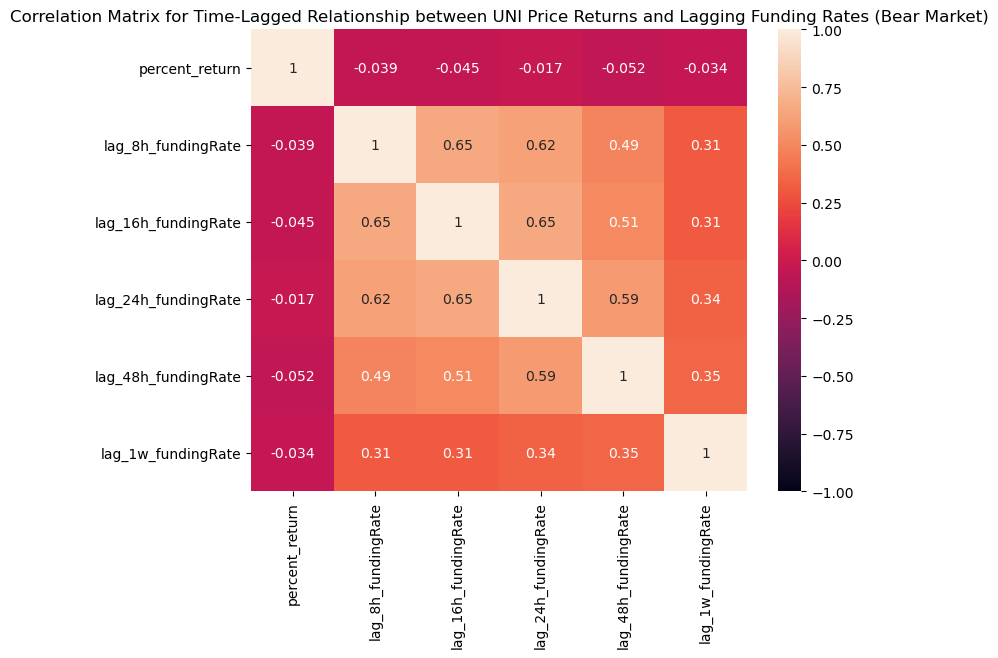

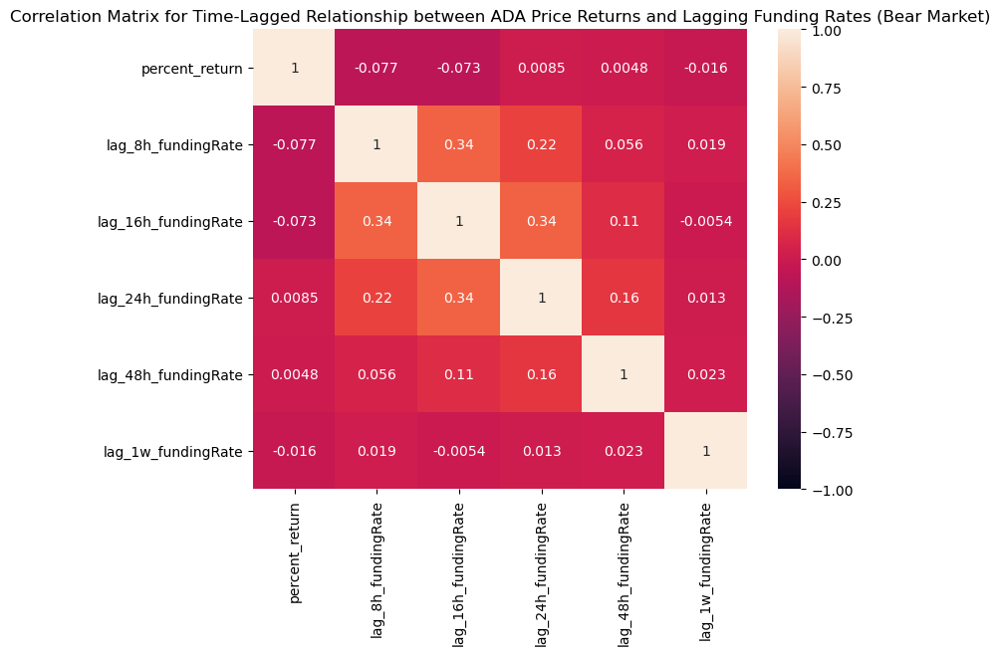

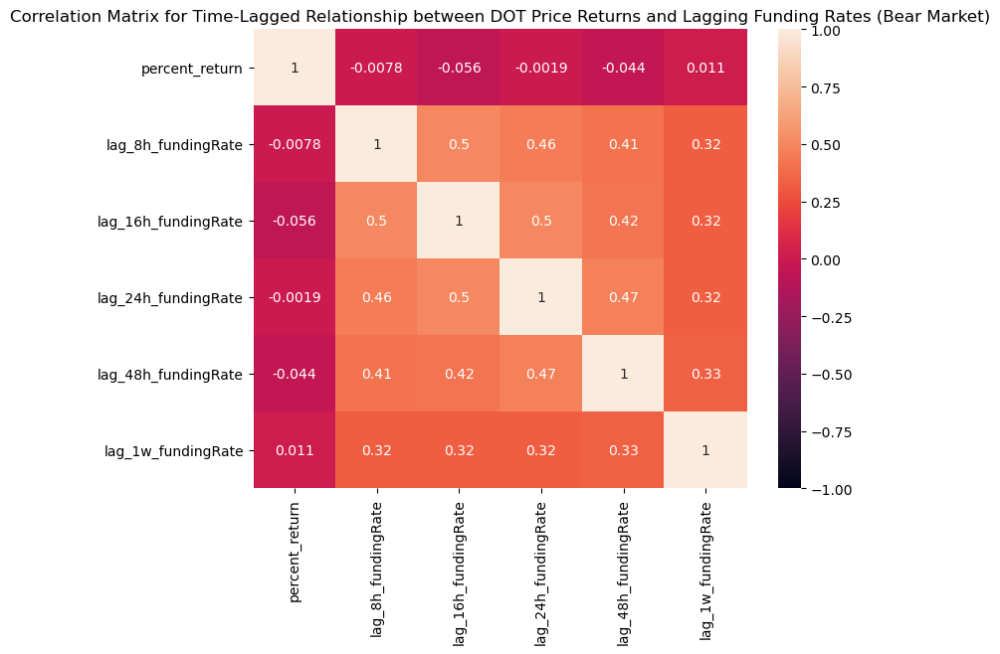

In [85]:
for i in bear_lagged_coin_corr_dict.keys():
    # Plot the heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(bear_lagged_coin_corr_dict[i], annot=True, vmin=-1, vmax=1)
    temp = i.split('_')[0].upper()
    plt.title(f'Correlation Matrix for Time-Lagged Relationship between {temp} Price Returns and Lagging Funding Rates (Bear Market)')
    plt.show()

### 4.7 Correlation Matrix for Time-Lagged Relationship in Current Bull Market

In [86]:
for i in second_bull_cycle_dict.keys():
    print('Computing time lag for', i)
    second_bull_cycle_dict[i] = shift_funding_time(second_bull_cycle_dict[i])

Computing time lag for merged_btc
Computing time lag for merged_eth
Computing time lag for merged_sol
Computing time lag for merged_doge
Computing time lag for merged_bnb
Computing time lag for merged_link
Computing time lag for merged_aave
Computing time lag for merged_uni
Computing time lag for merged_ada
Computing time lag for merged_dot


In [87]:
second_bull_cycle_dict_copy = second_bull_cycle_dict.copy()

In [88]:
second_bull_cycle_dict_copy['merged_uni'].head()

,open,close,high,low,open_time,close_time,symbol,fundingRate,markPrice,percent_return,lag_8h_fundingRate,lag_16h_fundingRate,lag_24h_fundingRate,lag_48h_fundingRate,lag_1w_fundingRate
fundingTime,,,,,,,,,,,,,,,
2023-09-01 00:00:00,4.372,4.386,4.425,4.360,2023-09-01 00:00:00,2023-09-01 07:59:59.999,UNIUSD_PERP,-0.000172,,0.320220,NaN,NaN,NaN,NaN,NaN
2023-09-01 08:00:00,4.388,4.336,4.414,4.319,2023-09-01 08:00:00,2023-09-01 15:59:59.999,UNIUSD_PERP,0.000060,,-1.185050,-0.000172,NaN,NaN,NaN,NaN
2023-09-01 16:00:00,4.335,4.262,4.347,4.237,2023-09-01 16:00:00,2023-09-01 23:59:59.999,UNIUSD_PERP,0.000098,,-1.683968,0.000060,-0.000172,NaN,NaN,NaN
2023-09-02 00:00:00,4.265,4.325,4.333,4.250,2023-09-02 00:00:00,2023-09-02 07:59:59.999,UNIUSD_PERP,0.000082,,1.406800,0.000098,0.000060,-0.000172,NaN,NaN
2023-09-02 08:00:00,4.325,4.370,4.403,4.304,2023-09-02 08:00:00,2023-09-02 15:59:59.999,UNIUSD_PERP,0.000100,,1.040462,0.000082,0.000098,0.000060,NaN,NaN


In [89]:
for k, df in second_bull_cycle_dict_copy.items():
    print('Checking NaN and Null values for', k)
    print(df.isna().sum())
    print()

Checking NaN and Null values for merged_btc
open                    0
close                   0
high                    0
low                     0
open_time               0
close_time              0
symbol                  0
fundingRate             0
markPrice               0
percent_return          0
lag_8h_fundingRate      1
lag_16h_fundingRate     2
lag_24h_fundingRate     3
lag_48h_fundingRate     6
lag_1w_fundingRate     21
dtype: int64

Checking NaN and Null values for merged_eth
open                    0
close                   0
high                    0
low                     0
open_time               0
close_time              0
symbol                  0
fundingRate             0
markPrice               0
percent_return          0
lag_8h_fundingRate      1
lag_16h_fundingRate     2
lag_24h_fundingRate     3
lag_48h_fundingRate     6
lag_1w_fundingRate     21
dtype: int64

Checking NaN and Null values for merged_sol
open                    0
close                   0
high    

In [90]:
# Drop NaN
for k, df in second_bull_cycle_dict_copy.items():
    print(k, df.shape)
    print('===== Dropping =====')
    df.dropna(subset=['lag_8h_fundingRate', 'lag_16h_fundingRate', 
                        'lag_24h_fundingRate', 'lag_48h_fundingRate', 
                        'lag_1w_fundingRate'], inplace=True)
    print(df.shape)
    print('=' * 20)

merged_btc (681, 15)
===== Dropping =====
(660, 15)
merged_eth (681, 15)
===== Dropping =====
(660, 15)
merged_sol (681, 15)
===== Dropping =====
(660, 15)
merged_doge (681, 15)
===== Dropping =====
(660, 15)
merged_bnb (681, 15)
===== Dropping =====
(660, 15)
merged_link (681, 15)
===== Dropping =====
(660, 15)
merged_aave (681, 15)
===== Dropping =====
(660, 15)
merged_uni (681, 15)
===== Dropping =====
(660, 15)
merged_ada (681, 15)
===== Dropping =====
(660, 15)
merged_dot (681, 15)
===== Dropping =====
(660, 15)


In [91]:
bull_lagged_coin_corr_dict = {}

for i in second_bull_cycle_dict_copy.keys():
    bull_lagged_corr = second_bull_cycle_dict_copy[i][['percent_return', 'lag_8h_fundingRate', 'lag_16h_fundingRate', 'lag_24h_fundingRate', 'lag_48h_fundingRate', 'lag_1w_fundingRate']].corr()
    bull_lagged_coin_corr_dict[i.split('_')[1] + '_corr_matrix_lagged'] = bull_lagged_corr

print(bull_lagged_coin_corr_dict.keys())

dict_keys(['btc_corr_matrix_lagged', 'eth_corr_matrix_lagged', 'sol_corr_matrix_lagged', 'doge_corr_matrix_lagged', 'bnb_corr_matrix_lagged', 'link_corr_matrix_lagged', 'aave_corr_matrix_lagged', 'uni_corr_matrix_lagged', 'ada_corr_matrix_lagged', 'dot_corr_matrix_lagged'])


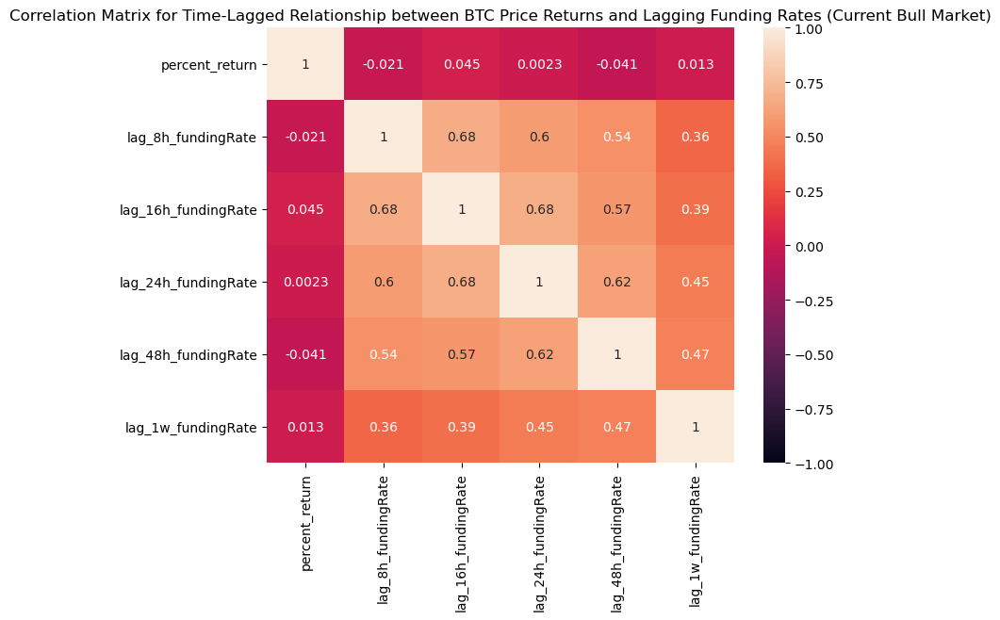

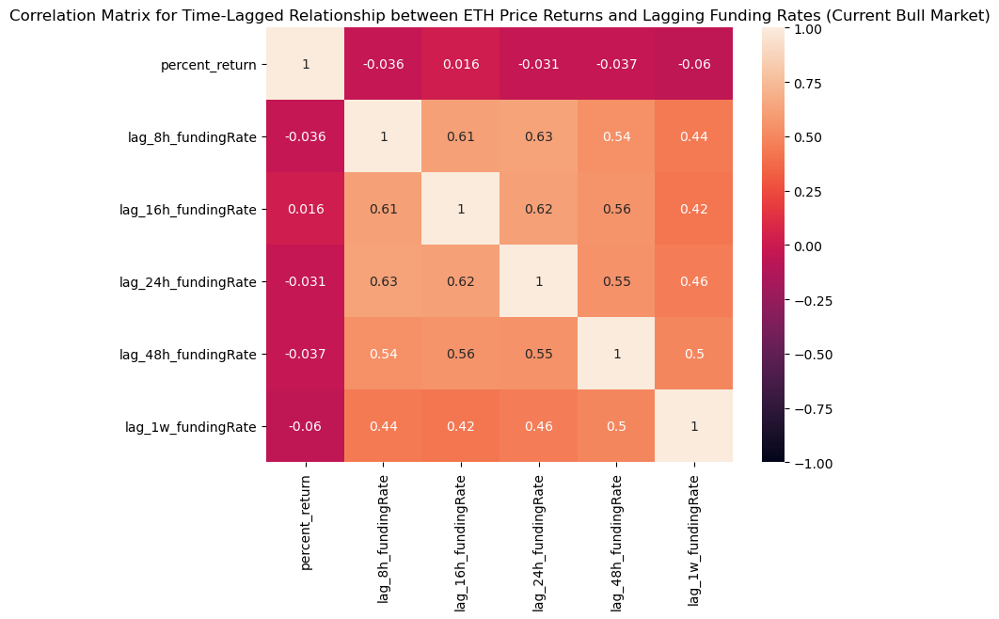

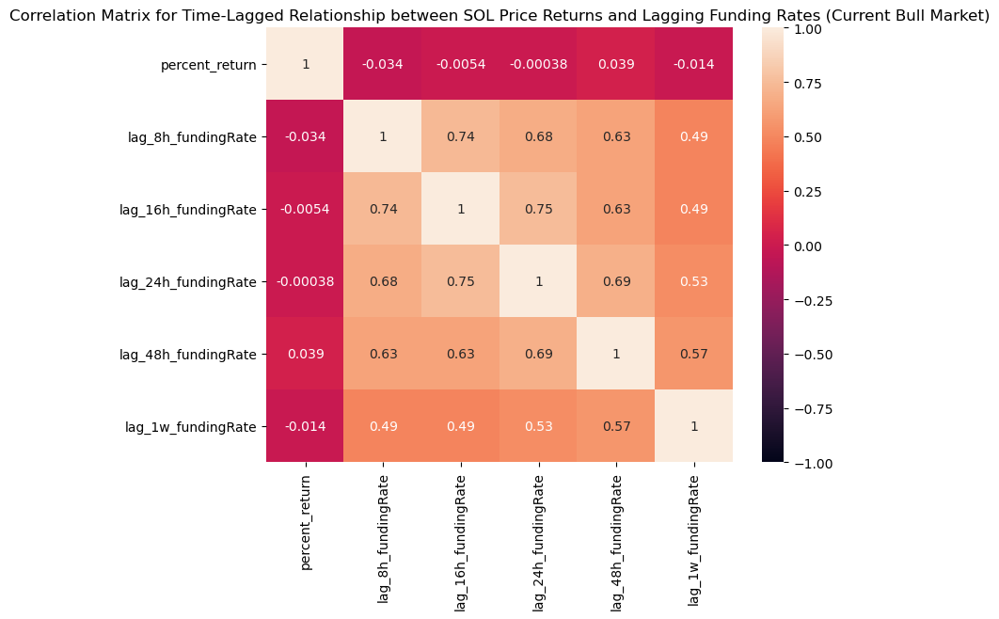

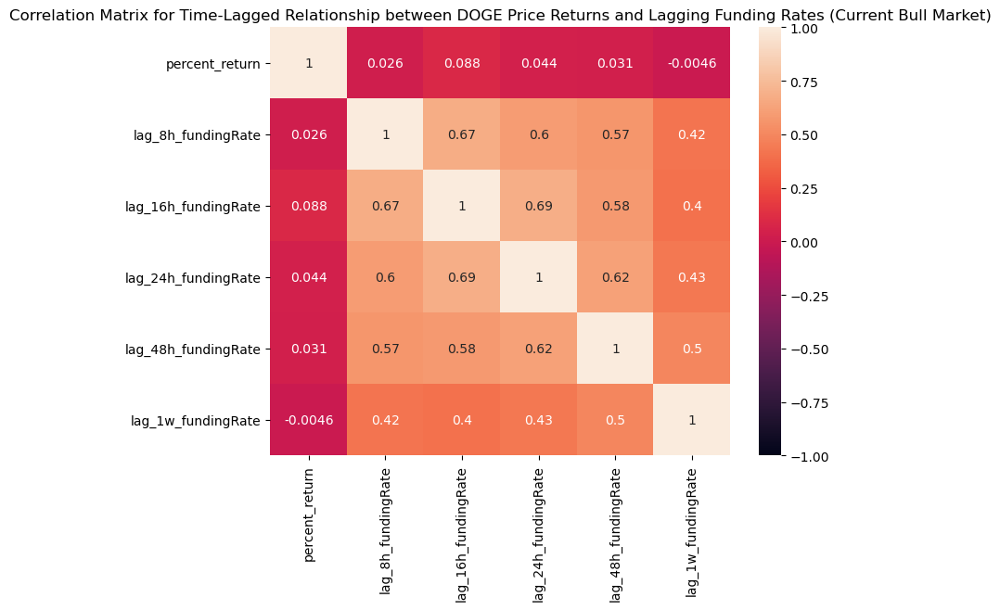

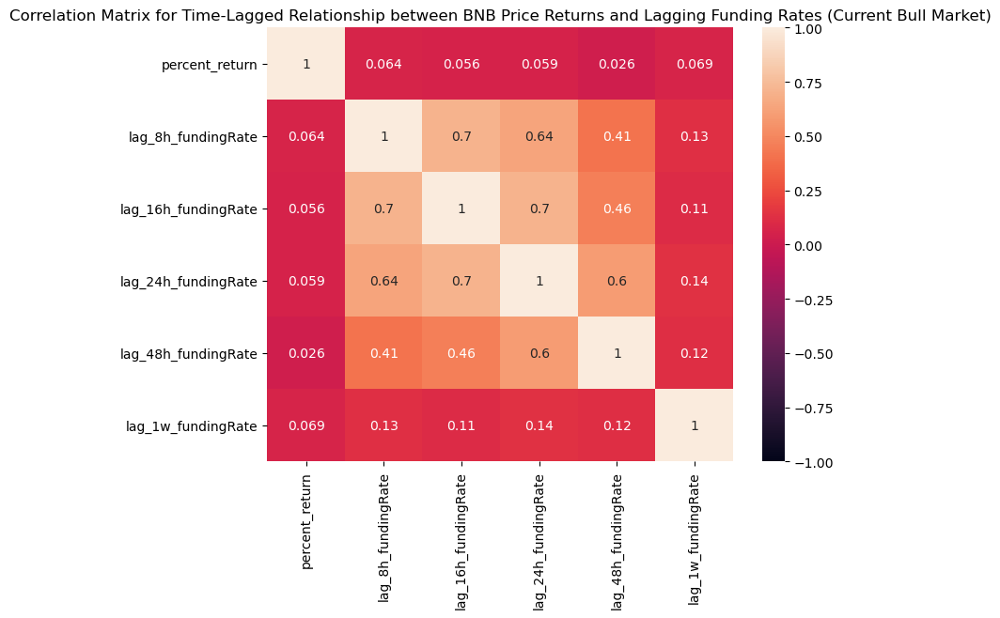

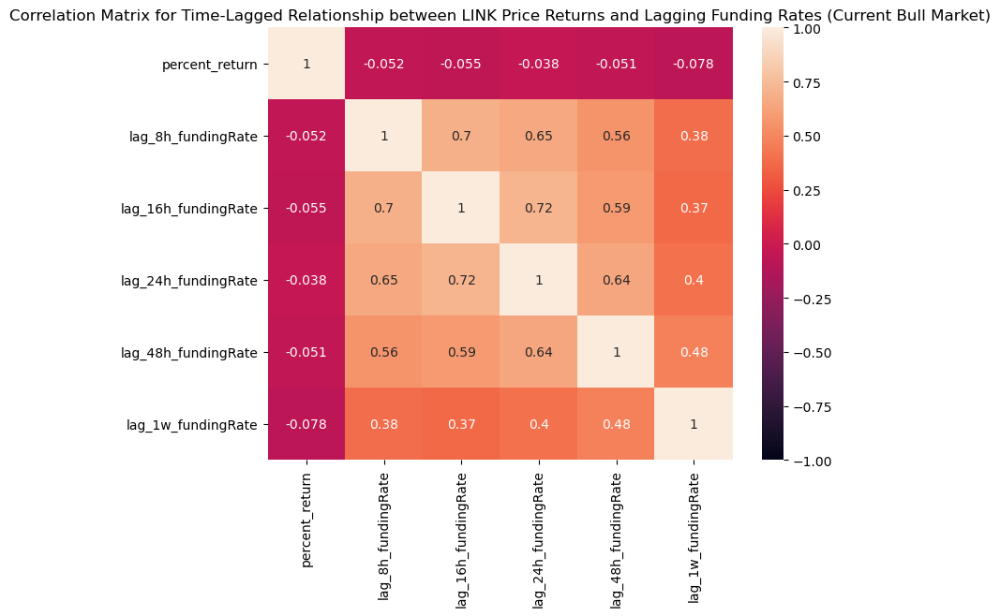

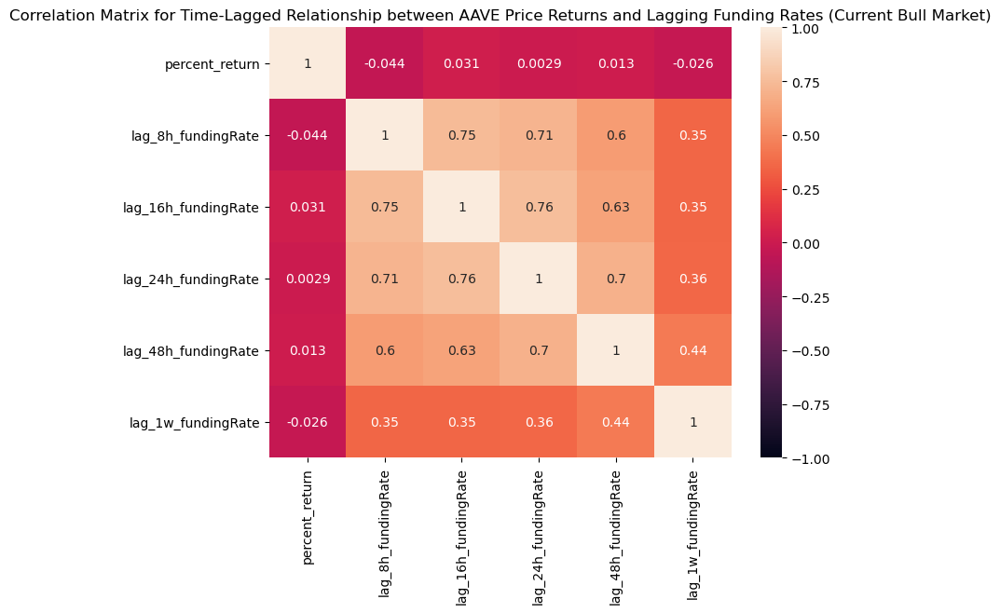

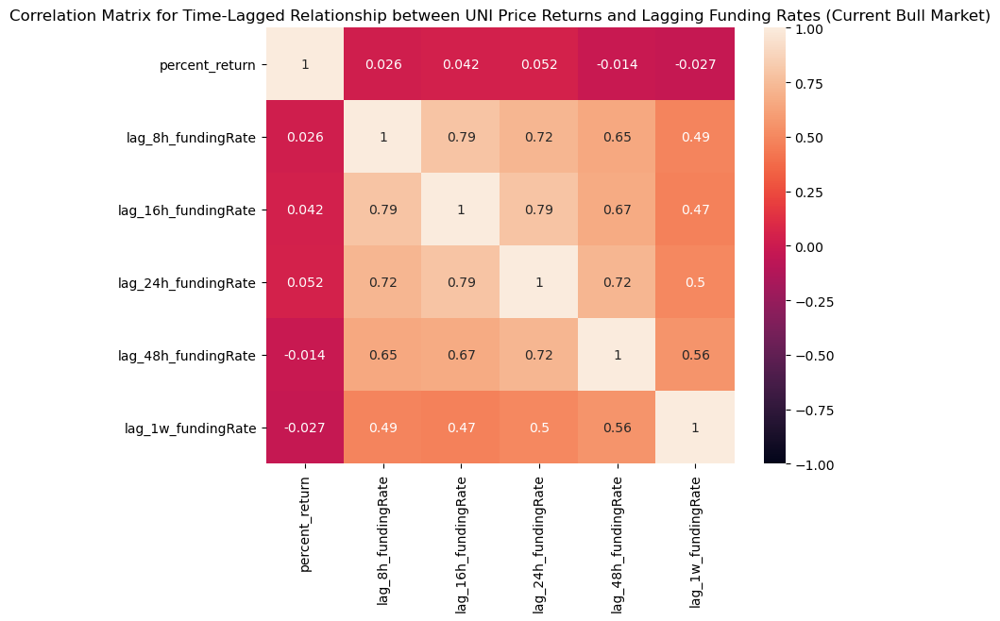

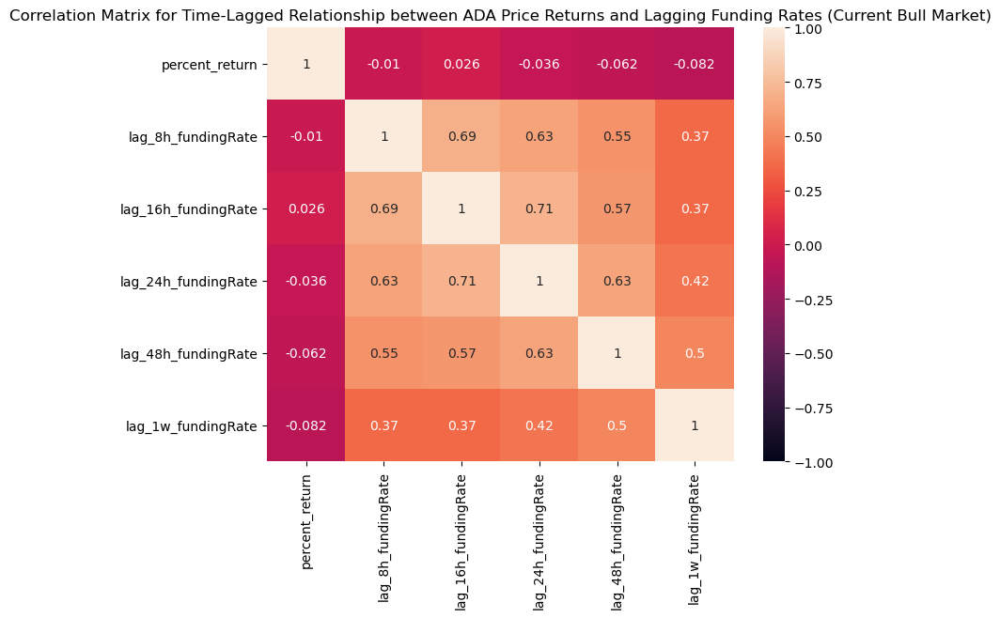

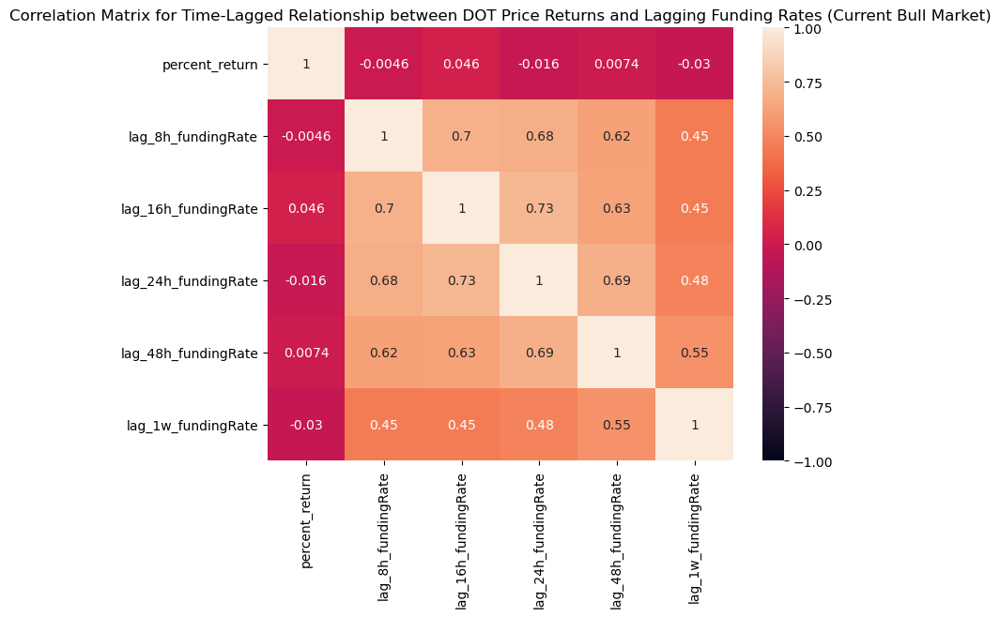

In [92]:
for i in bull_lagged_coin_corr_dict.keys():
    # Plot the heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(bull_lagged_coin_corr_dict[i], annot=True, vmin=-1, vmax=1)
    temp = i.split('_')[0].upper()
    plt.title(f'Correlation Matrix for Time-Lagged Relationship between {temp} Price Returns and Lagging Funding Rates (Current Bull Market)')
    plt.show()

#### Observations:

asdf

# 5. Model

### 5.1 Building a Linear Regression Model

Building a linear regression model to predict future prices based on current spot prices and past funding rates

In [93]:
merged_dict_copy2 = merged_dict.copy()

In [94]:
for i in merged_dict_copy2.keys():
    print('Checking timeframe alignment in', i)
    merged_dict_copy2[i] = align_timeframe(merged_dict_copy2[i])
    print()

Checking timeframe alignment in merged_btc
2021-04-14 17:00:00
2021-04-14 15:59:00.001000
2021-04-15 00:01:00.001000
Valid row found at index 0 with open_time 2021-04-14 17:00:00 and close_time 2021-04-14 23:59:59.999000 | funding window from 2021-04-14 15:59:00.001000 tp 2021-04-15 00:01:00.001000
Data sliced from row: 0
Remaining data shape: (3289, 11)

Checking timeframe alignment in merged_eth
2021-04-14 17:00:00
2021-04-14 15:59:00.001000
2021-04-15 00:01:00.001000
Valid row found at index 0 with open_time 2021-04-14 17:00:00 and close_time 2021-04-14 23:59:59.999000 | funding window from 2021-04-14 15:59:00.001000 tp 2021-04-15 00:01:00.001000
Data sliced from row: 0
Remaining data shape: (3289, 11)

Checking timeframe alignment in merged_sol
2021-04-14 17:00:00
2021-09-02 07:59:00.007000
2021-09-02 16:01:00.007000
Valid row found at index 422 with open_time 2021-09-02 08:00:00 and close_time 2021-09-02 15:59:59.999000 | funding window from 2021-09-02 07:59:00.007000 tp 2021-09-0

In [95]:
for i in merged_dict_copy2.keys():
    print('Computing time lag for', i)
    merged_dict_copy2[i] = shift_funding_time(merged_dict_copy2[i])

Computing time lag for merged_btc
Computing time lag for merged_eth
Computing time lag for merged_sol
Computing time lag for merged_doge
Computing time lag for merged_bnb
Computing time lag for merged_link
Computing time lag for merged_aave
Computing time lag for merged_uni
Computing time lag for merged_ada
Computing time lag for merged_dot


In [96]:
merged_dict_copy2['merged_ada'].head()

,open,close,high,low,open_time,close_time,symbol,fundingRate,markPrice,percent_return,lag_8h_fundingRate,lag_16h_fundingRate,lag_24h_fundingRate,lag_48h_fundingRate,lag_1w_fundingRate
fundingTime,,,,,,,,,,,,,,,
2021-04-14 16:00:00.001,1.45727,1.45092,1.47500,1.37500,2021-04-14 17:00:00,2021-04-14 23:59:59.999,ADAUSD_PERP,0.000590,,-0.435746,NaN,NaN,NaN,NaN,NaN
2021-04-15 00:00:00.011,1.45140,1.43873,1.46813,1.41023,2021-04-15 00:00:00,2021-04-15 07:59:59.999,ADAUSD_PERP,0.000648,,-0.872950,0.000590,NaN,NaN,NaN,NaN
2021-04-15 08:00:00.002,1.43873,1.47948,1.49539,1.42809,2021-04-15 08:00:00,2021-04-15 15:59:59.999,ADAUSD_PERP,0.001280,,2.832359,0.000648,0.000590,NaN,NaN,NaN
2021-04-15 16:00:00.000,1.47947,1.47820,1.49283,1.44441,2021-04-15 16:00:00,2021-04-15 23:59:59.999,ADAUSD_PERP,0.000981,,-0.085842,0.001280,0.000648,0.000590,NaN,NaN
2021-04-16 00:00:00.006,1.47845,1.41858,1.51915,1.39000,2021-04-16 00:00:00,2021-04-16 07:59:59.999,ADAUSD_PERP,0.001236,,-4.049511,0.000981,0.001280,0.000648,NaN,NaN


In [97]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

def model_lregression(data, dependent):
    """Perform linear regression on the data to predict the price returns based on the funding rates."""
    
    data_copy = data.copy()

    #Keeping only the interested columns
    data_copy = data_copy[['percent_return', dependent]]

    data_copy.dropna(inplace=True)

    X = data_copy[[dependent]]  #feature will be the funding rate
    y = data_copy['percent_return'] #target

    # Split into train and test data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    coeff = model.coef_[0]

    performance = {
        'coeff': coeff, 
        'rmse': rmse,
        'mse': mse, 
        'r2': r2,
        'X_test': X_test,
        'y_test': y_test,
        'y_pred': y_pred}

    # # Plotting the actual data (scatter plot)
    # plt.scatter(X_test, y_test, color='black', label='Actual data')

    # # Adding labels and title
    # plt.xlabel('Funding Rate')
    # plt.ylabel('Percent Return')
    # plt.title('Actual vs Predicted Percent Returns')
    # plt.legend()

    # # Display the plot
    # plt.show()

    return model, performance

In [98]:
lag_time = ['fundingRate', 'lag_8h_fundingRate', 'lag_16h_fundingRate', 'lag_24h_fundingRate', 'lag_48h_fundingRate', 'lag_1w_fundingRate']

performance = {}


for i in range(len(lag_time)):
    performance[lag_time[i]] = {}
    for k, df in merged_dict_copy2.items():
        print('Modeling for', k.upper(), 'using', lag_time[i])
        model, metrics = model_lregression(df, lag_time[i])

        performance[lag_time[i]][k] = {'R2': metrics['r2'], 'MSE': metrics['mse'], 'RMSE': metrics['rmse'], 'coeff': metrics['coeff']}

        print('Coeff:', metrics['coeff'])
        print('RMSE:', metrics['rmse'])
        print('MSE:', metrics['mse'])
        print('R2:', metrics['r2'])
        print()

Modeling for MERGED_BTC using fundingRate
Coeff: -527.859212450271
RMSE: 1.723881035231781
MSE: 2.9717658236317974
R2: -0.0009366956145178129

Modeling for MERGED_ETH using fundingRate
Coeff: 395.64735244093544
RMSE: 2.2537791814120123
MSE: 5.079520598566201
R2: -0.006411778145564151

Modeling for MERGED_SOL using fundingRate
Coeff: 169.03254973455282
RMSE: 3.151803851188132
MSE: 9.933867516364343
R2: 0.014983951635177517

Modeling for MERGED_DOGE using fundingRate
Coeff: -110.82984219359228
RMSE: 3.1327841735820052
MSE: 9.814336678245887
R2: -0.0036535141511286895

Modeling for MERGED_BNB using fundingRate
Coeff: -192.05043785384956
RMSE: 2.2552133445178706
MSE: 5.08598722929148
R2: -0.002697972376866087

Modeling for MERGED_LINK using fundingRate
Coeff: -150.68821670617032
RMSE: 3.1283157044987937
MSE: 9.786359147013783
R2: -0.0013468977131487758

Modeling for MERGED_AAVE using fundingRate
Coeff: 168.1695301074776
RMSE: 3.011130735954988
MSE: 9.06690830901283
R2: -0.0060921086908583


### 5.2 Evaluating the best model

In [99]:
for k,v in performance.items():
    print(k)
    print(v)
    print()

fundingRate
{'merged_btc': {'R2': -0.0009366956145178129, 'MSE': 2.9717658236317974, 'RMSE': 1.723881035231781, 'coeff': -527.859212450271}, 'merged_eth': {'R2': -0.006411778145564151, 'MSE': 5.079520598566201, 'RMSE': 2.2537791814120123, 'coeff': 395.64735244093544}, 'merged_sol': {'R2': 0.014983951635177517, 'MSE': 9.933867516364343, 'RMSE': 3.151803851188132, 'coeff': 169.03254973455282}, 'merged_doge': {'R2': -0.0036535141511286895, 'MSE': 9.814336678245887, 'RMSE': 3.1327841735820052, 'coeff': -110.82984219359228}, 'merged_bnb': {'R2': -0.002697972376866087, 'MSE': 5.08598722929148, 'RMSE': 2.2552133445178706, 'coeff': -192.05043785384956}, 'merged_link': {'R2': -0.0013468977131487758, 'MSE': 9.786359147013783, 'RMSE': 3.1283157044987937, 'coeff': -150.68821670617032}, 'merged_aave': {'R2': -0.0060921086908583, 'MSE': 9.06690830901283, 'RMSE': 3.011130735954988, 'coeff': 168.1695301074776}, 'merged_uni': {'R2': -0.0038735297468057706, 'MSE': 9.243880651371429, 'RMSE': 3.0403750839

In [100]:
# Get the best performing model from performance
best_model = None
best_r2 = 0
best_mse = 0
best_rmse = 0
best_lag = None

for lag, models in performance.items():
    for model, metrics in models.items():
        if metrics['R2'] > best_r2 and lag != 'fundingRate':
            best_r2 = metrics['R2']
            best_rmse = metrics['RMSE']
            best_mse = metrics['MSE']
            best_model = model
            best_lag = lag


print('Best Model:', best_model)
print('Best R2:', best_r2)
print('Best MSE:', best_mse)
print('Best RMSE:', best_mse)
print('Best Lag:', best_lag)

Best Model: merged_dot
Best R2: 0.004948257741490436
Best MSE: 8.60258813539663
Best RMSE: 8.60258813539663
Best Lag: lag_8h_fundingRate


### 5.3 Backtesting the model

#### 5.3.1 Creating the backtest data

I will be using the original dataset of historical prices and perpetual contracts for the following trades. 

Since the best lag funding rate is 1 week, I will use the previous functions of *align_timeframe* and *shift_funding_time* to create the final dataset

In [101]:
coin = best_model.split('_')[1]

hist_df = coin + '_hist_df'
funding_hist_df = coin + 'usd_funding_hist_df'

#Grab the global variable of hist_df and funding_hist_df
hist_df = globals()[hist_df]
funding_hist_df = globals()[funding_hist_df]

In [102]:
df = pd.merge_asof(hist_df, funding_hist_df, left_on='open_time', right_on='fundingTime', direction='nearest')

In [103]:
df.head()

,open_time,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore,percent_return,symbol,fundingTime,fundingRate,markPrice
0,2021-04-14 17:00:00,42.0380,42.0382,40.7820,40.8533,491091.59,2021-04-14 17:59:59.999,2.031970e+07,24575,216499.85,8.956094e+06,0,-2.818165,DOTUSD_PERP,2021-04-14 16:00:00.001,0.000615,
1,2021-04-14 18:00:00,40.8802,41.3432,40.5000,41.1393,321964.72,2021-04-14 18:59:59.999,1.318166e+07,19128,161173.05,6.601041e+06,0,0.633803,DOTUSD_PERP,2021-04-14 16:00:00.001,0.000615,
2,2021-04-14 19:00:00,41.1396,41.3622,40.6102,41.2580,277333.14,2021-04-14 19:59:59.999,1.136220e+07,17060,141640.29,5.805130e+06,0,0.287801,DOTUSD_PERP,2021-04-14 16:00:00.001,0.000615,
3,2021-04-14 20:00:00,41.2574,41.4956,40.9926,41.4668,136193.58,2021-04-14 20:59:59.999,5.616682e+06,8867,69000.33,2.845799e+06,0,0.507545,DOTUSD_PERP,2021-04-14 16:00:00.001,0.000615,
4,2021-04-14 21:00:00,41.4667,42.2817,41.4647,42.2686,256684.50,2021-04-14 21:59:59.999,1.076845e+07,15722,123869.76,5.194826e+06,0,1.933841,DOTUSD_PERP,2021-04-15 00:00:00.011,0.000609,


In [104]:
df = compute_percent_return(df)
df = align_timeframe(df)
df = shift_funding_time(df)
df.reset_index(inplace=True)

2021-04-14 17:00:00
2021-04-14 15:59:00.001000
2021-04-15 00:01:00.001000
Valid row found at index 0 with open_time 2021-04-14 17:00:00 and close_time 2021-04-14 17:59:59.999000 | funding window from 2021-04-14 15:59:00.001000 tp 2021-04-15 00:01:00.001000
Data sliced from row: 0
Remaining data shape: (26292, 17)


In [105]:
df.head()

,fundingTime,open_time,open,high,low,close,volume,close_time,quote_asset_volume,number_of_trades,...,ignore,percent_return,symbol,fundingRate,markPrice,lag_8h_fundingRate,lag_16h_fundingRate,lag_24h_fundingRate,lag_48h_fundingRate,lag_1w_fundingRate
0,2021-04-14 16:00:00.001,2021-04-14 17:00:00,42.0380,42.0382,40.7820,40.8533,491091.59,2021-04-14 17:59:59.999,2.031970e+07,24575,...,0,-2.818165,DOTUSD_PERP,0.000615,,NaN,NaN,NaN,NaN,NaN
1,2021-04-14 16:00:00.001,2021-04-14 18:00:00,40.8802,41.3432,40.5000,41.1393,321964.72,2021-04-14 18:59:59.999,1.318166e+07,19128,...,0,0.633803,DOTUSD_PERP,0.000615,,0.000615,NaN,NaN,NaN,NaN
2,2021-04-14 16:00:00.001,2021-04-14 19:00:00,41.1396,41.3622,40.6102,41.2580,277333.14,2021-04-14 19:59:59.999,1.136220e+07,17060,...,0,0.287801,DOTUSD_PERP,0.000615,,0.000615,0.000615,NaN,NaN,NaN
3,2021-04-14 16:00:00.001,2021-04-14 20:00:00,41.2574,41.4956,40.9926,41.4668,136193.58,2021-04-14 20:59:59.999,5.616682e+06,8867,...,0,0.507545,DOTUSD_PERP,0.000615,,0.000615,0.000615,0.000615,NaN,NaN
4,2021-04-15 00:00:00.011,2021-04-14 21:00:00,41.4667,42.2817,41.4647,42.2686,256684.50,2021-04-14 21:59:59.999,1.076845e+07,15722,...,0,1.933841,DOTUSD_PERP,0.000609,,0.000615,0.000615,0.000615,NaN,NaN


In [106]:
for idx, row in df.iterrows():
    if row['fundingTime'] > row['close_time']:
        print('Funding Time is greater than close time')
        print(row['fundingTime'])
        print(row['close_time'])
        print(row['fundingRate'])
        print(df.loc[idx-1, 'fundingRate'])
        print('Row:', idx)
        print()

        df.loc[idx, 'fundingRate'] = df.loc[idx-1, 'fundingRate']
        df.loc[idx, 'fundingTime'] = df.loc[idx-1, 'fundingTime']

Funding Time is greater than close time
2021-04-15 00:00:00.011000
2021-04-14 21:59:59.999000
0.00060944
0.00061471
Row: 4

Funding Time is greater than close time
2021-04-15 00:00:00.011000
2021-04-14 22:59:59.999000
0.00060944
0.00061471
Row: 5

Funding Time is greater than close time
2021-04-15 00:00:00.011000
2021-04-14 23:59:59.999000
0.00060944
0.00061471
Row: 6

Funding Time is greater than close time
2021-04-15 08:00:00.002000
2021-04-15 05:59:59.999000
0.00034124
0.00060944
Row: 12

Funding Time is greater than close time
2021-04-15 08:00:00.002000
2021-04-15 06:59:59.999000
0.00034124
0.00060944
Row: 13

Funding Time is greater than close time
2021-04-15 08:00:00.002000
2021-04-15 07:59:59.999000
0.00034124
0.00060944
Row: 14

Funding Time is greater than close time
2021-04-15 16:00:00
2021-04-15 13:59:59.999000
0.00061872
0.00034124
Row: 20

Funding Time is greater than close time
2021-04-15 16:00:00
2021-04-15 14:59:59.999000
0.00061872
0.00034124
Row: 21

Funding Time is g

Funding Time is greater than close time
2021-11-06 08:00:00.013000
2021-11-06 05:59:59.999000
0.0001
0.0001
Row: 4921

Funding Time is greater than close time
2021-11-06 08:00:00.013000
2021-11-06 06:59:59.999000
0.0001
0.0001
Row: 4922

Funding Time is greater than close time
2021-11-06 08:00:00.013000
2021-11-06 07:59:59.999000
0.0001
0.0001
Row: 4923

Funding Time is greater than close time
2021-11-06 16:00:00
2021-11-06 13:59:59.999000
0.0001
0.0001
Row: 4929

Funding Time is greater than close time
2021-11-06 16:00:00
2021-11-06 14:59:59.999000
0.0001
0.0001
Row: 4930

Funding Time is greater than close time
2021-11-06 16:00:00
2021-11-06 15:59:59.999000
0.0001
0.0001
Row: 4931

Funding Time is greater than close time
2021-11-07 00:00:00.013000
2021-11-06 21:59:59.999000
0.0001
0.0001
Row: 4937

Funding Time is greater than close time
2021-11-07 00:00:00.013000
2021-11-06 22:59:59.999000
0.0001
0.0001
Row: 4938

Funding Time is greater than close time
2021-11-07 00:00:00.013000
20

In [107]:
df = df[['fundingTime','open_time', 'close_time', 'open', 'close', 'high', 'low', 'volume', 'percent_return', 'fundingRate', 'lag_8h_fundingRate', 'lag_16h_fundingRate', 'lag_24h_fundingRate', 'lag_48h_fundingRate', 'lag_1w_fundingRate']]

In [108]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26292 entries, 0 to 26291
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   fundingTime          26292 non-null  datetime64[ns]
 1   open_time            26292 non-null  datetime64[ns]
 2   close_time           26292 non-null  datetime64[ns]
 3   open                 26292 non-null  float64       
 4   close                26292 non-null  float64       
 5   high                 26292 non-null  float64       
 6   low                  26292 non-null  float64       
 7   volume               26292 non-null  float64       
 8   percent_return       26292 non-null  float64       
 9   fundingRate          26292 non-null  float64       
 10  lag_8h_fundingRate   26291 non-null  float64       
 11  lag_16h_fundingRate  26290 non-null  float64       
 12  lag_24h_fundingRate  26289 non-null  float64       
 13  lag_48h_fundingRate  26286 non-

In [109]:
df.describe()

,open,close,high,low,volume,percent_return,fundingRate,lag_8h_fundingRate,lag_16h_fundingRate,lag_24h_fundingRate,lag_48h_fundingRate,lag_1w_fundingRate
count,26292.00000,26292.000000,26292.000000,26292.000000,2.629200e+04,26292.000000,26292.000000,26291.000000,26290.000000,26289.000000,26286.000000,26271.000000
mean,13.50416,13.502539,13.621715,13.376322,3.421446e+05,-0.004020,0.000039,0.000039,0.000039,0.000039,0.000039,0.000040
std,11.25594,11.254733,11.376192,11.125527,4.188848e+05,1.134172,0.000239,0.000239,0.000239,0.000239,0.000239,0.000237
min,3.61000,3.611000,3.621000,3.562000,0.000000e+00,-31.619408,-0.005699,-0.005699,-0.005699,-0.005699,-0.005699,-0.005699
25%,5.66675,5.667000,5.695000,5.631000,1.178330e+05,-0.448845,-0.000043,-0.000043,-0.000043,-0.000043,-0.000043,-0.000043
50%,7.47850,7.476500,7.539000,7.420000,2.236794e+05,0.000000,0.000100,0.000100,0.000100,0.000100,0.000100,0.000100
75%,18.97000,18.970000,19.100000,18.810000,4.126963e+05,0.449930,0.000100,0.000100,0.000100,0.000100,0.000100,0.000100
max,55.03000,55.030000,55.090000,53.800000,1.049963e+07,21.183432,0.001749,0.001749,0.001749,0.001749,0.001749,0.001749


In [110]:
df.head(10)

,fundingTime,open_time,close_time,open,close,high,low,volume,percent_return,fundingRate,lag_8h_fundingRate,lag_16h_fundingRate,lag_24h_fundingRate,lag_48h_fundingRate,lag_1w_fundingRate
0,2021-04-14 16:00:00.001,2021-04-14 17:00:00,2021-04-14 17:59:59.999,42.0380,40.8533,42.0382,40.7820,491091.59,-2.818165,0.000615,NaN,NaN,NaN,NaN,NaN
1,2021-04-14 16:00:00.001,2021-04-14 18:00:00,2021-04-14 18:59:59.999,40.8802,41.1393,41.3432,40.5000,321964.72,0.633803,0.000615,0.000615,NaN,NaN,NaN,NaN
2,2021-04-14 16:00:00.001,2021-04-14 19:00:00,2021-04-14 19:59:59.999,41.1396,41.2580,41.3622,40.6102,277333.14,0.287801,0.000615,0.000615,0.000615,NaN,NaN,NaN
3,2021-04-14 16:00:00.001,2021-04-14 20:00:00,2021-04-14 20:59:59.999,41.2574,41.4668,41.4956,40.9926,136193.58,0.507545,0.000615,0.000615,0.000615,0.000615,NaN,NaN
4,2021-04-14 16:00:00.001,2021-04-14 21:00:00,2021-04-14 21:59:59.999,41.4667,42.2686,42.2817,41.4647,256684.50,1.933841,0.000615,0.000615,0.000615,0.000615,NaN,NaN
5,2021-04-14 16:00:00.001,2021-04-14 22:00:00,2021-04-14 22:59:59.999,42.2672,42.5188,42.6140,41.9694,265020.04,0.595261,0.000615,0.000609,0.000615,0.000615,NaN,NaN
6,2021-04-14 16:00:00.001,2021-04-14 23:00:00,2021-04-14 23:59:59.999,42.5356,42.5171,42.8985,42.3000,248861.27,-0.043493,0.000615,0.000609,0.000609,0.000615,0.000615,NaN
7,2021-04-15 00:00:00.011,2021-04-15 00:00:00,2021-04-15 00:59:59.999,42.5217,42.1057,42.8264,42.1047,273218.12,-0.978324,0.000609,0.000609,0.000609,0.000609,0.000615,NaN
8,2021-04-15 00:00:00.011,2021-04-15 01:00:00,2021-04-15 01:59:59.999,42.1047,42.1505,42.6873,41.9570,406741.75,0.108776,0.000609,0.000609,0.000609,0.000609,0.000615,NaN
9,2021-04-15 00:00:00.011,2021-04-15 02:00:00,2021-04-15 02:59:59.999,42.1505,42.8711,43.5374,42.1384,749348.82,1.709588,0.000609,0.000609,0.000609,0.000609,0.000615,NaN


In [111]:
df.dropna(subset=[best_lag], inplace=True)
df.head()

,fundingTime,open_time,close_time,open,close,high,low,volume,percent_return,fundingRate,lag_8h_fundingRate,lag_16h_fundingRate,lag_24h_fundingRate,lag_48h_fundingRate,lag_1w_fundingRate
1,2021-04-14 16:00:00.001,2021-04-14 18:00:00,2021-04-14 18:59:59.999,40.8802,41.1393,41.3432,40.5000,321964.72,0.633803,0.000615,0.000615,NaN,NaN,NaN,NaN
2,2021-04-14 16:00:00.001,2021-04-14 19:00:00,2021-04-14 19:59:59.999,41.1396,41.2580,41.3622,40.6102,277333.14,0.287801,0.000615,0.000615,0.000615,NaN,NaN,NaN
3,2021-04-14 16:00:00.001,2021-04-14 20:00:00,2021-04-14 20:59:59.999,41.2574,41.4668,41.4956,40.9926,136193.58,0.507545,0.000615,0.000615,0.000615,0.000615,NaN,NaN
4,2021-04-14 16:00:00.001,2021-04-14 21:00:00,2021-04-14 21:59:59.999,41.4667,42.2686,42.2817,41.4647,256684.50,1.933841,0.000615,0.000615,0.000615,0.000615,NaN,NaN
5,2021-04-14 16:00:00.001,2021-04-14 22:00:00,2021-04-14 22:59:59.999,42.2672,42.5188,42.6140,41.9694,265020.04,0.595261,0.000615,0.000609,0.000615,0.000615,NaN,NaN


#### 5.3.2 Backtest

In this strategy, I will compare *best_lag* and *fundingRate* to decide whether to <span style='color:green'>buy</span> or <span style='color:red'>sell</span> UNI Spot Prices.

##### <span style='color:green'>BUY</span>: If *best_lag* > *fundingRate*
- This logic checks on the hourly rate basis.
- Buying size will be 1 coin at the hourly open price.


##### <span style='color:red'>SELL</span>: If *best_lag* ≤ *fundingRate*
- This logic checks on the hourly rate basis as well
- Selling size will be the accumulative size when *best_lag* > *fundingRate* .

In [112]:
initial_capital = 100000.0  # Starting capital
capital = initial_capital
size = 0
number_of_trades = 0

for i in range(1, len(df)):
    if df[best_lag].iloc[i] > df['fundingRate'].iloc[i]:
        # Buy one unit and subtract from capital
        capital -= df['open'].iloc[i]
        size += 1
        number_of_trades += 1

        print('BUY')
        print('Position bought at a price of', df['open'].iloc[i], 'at', df['open_time'].iloc[i])
        print('Curent capital:', capital)
        print('Current size:', size)
        print()

    elif df[best_lag].iloc[i] <= df['fundingRate'].iloc[i] and size > 0:
        # Sell the unit and add to capital
        capital += df['open'].iloc[i] * size
        size = 0

        print('CLOSE')
        print('Position closed at a price of', df['open'].iloc[i], 'at', df['close_time'].iloc[i])
        print('Curent capital:', capital)
        print()

# If we have an open position, close it
if size > 0:
    capital += df['open'].iloc[-1] * size
    positions = 0

# Calculate the total performance
performance = (capital - initial_capital) * 100 / initial_capital
print(f'Total performance: {round(performance,2)}%')
print('Final capital:', capital)
print('No. of Trades:', number_of_trades)
print('No. of possible trades:', len(df))

BUY
Position bought at a price of 42.5212 at 2021-04-15 14:00:00
Curent capital: 99957.4788
Current size: 1

BUY
Position bought at a price of 43.177 at 2021-04-15 15:00:00
Curent capital: 99914.3018
Current size: 2

CLOSE
Position closed at a price of 42.9766 at 2021-04-15 16:59:59.999000
Curent capital: 100000.255

BUY
Position bought at a price of 43.4087 at 2021-04-15 22:00:00
Curent capital: 99956.8463
Current size: 1

BUY
Position bought at a price of 43.9022 at 2021-04-15 23:00:00
Curent capital: 99912.94410000001
Current size: 2

CLOSE
Position closed at a price of 43.4169 at 2021-04-16 00:59:59.999000
Curent capital: 99999.7779

BUY
Position bought at a price of 42.236 at 2021-04-16 06:00:00
Curent capital: 99957.5419
Current size: 1

BUY
Position bought at a price of 42.2372 at 2021-04-16 07:00:00
Curent capital: 99915.3047
Current size: 2

CLOSE
Position closed at a price of 42.545 at 2021-04-16 08:59:59.999000
Curent capital: 100000.39469999999

BUY
Position bought at a pri

# 6. Summary of findings